<a href="https://colab.research.google.com/github/a-memoir/Automated-Medical-Report-NNH/blob/main/08sep.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip -q install pymupdf pillow imagehash pandas tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 21.3 MB/s eta 0:00:00


In [3]:
from pathlib import Path

IMAGE_ROOT = Path("/content/drive/MyDrive/ImageLocal/ImageLocal")
PDF_ROOT   = Path("/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày")

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print("Images:", IMAGE_ROOT)
print("PDFs:", PDF_ROOT)
print("Output:", OUTPUT_DIR)

Images: /content/drive/MyDrive/ImageLocal/ImageLocal
PDFs: /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày
Output: /content/drive/MyDrive/NoiSoi_Matching


In [ ]:
print("Image root exists:", IMAGE_ROOT.exists())
print("PDF root exists:", PDF_ROOT.exists())

print("\nExample image files:")
for p in list(IMAGE_ROOT.rglob("*"))[:10]:
    print(p)

print("\nExample PDF files:")
for p in list(PDF_ROOT.rglob("*.pdf"))[:10]:
    print(p)

Image root exists: True
PDF root exists: True

Example image files:


In [5]:
import re
from datetime import datetime

def parse_image_datetime(filename):
    """
    Ví dụ:
    10000.10000.0.10014.20240302060129669.jpg

    → 2024-03-02 06:01:29...
    """

    match = re.search(r'(\d{17,20})', filename)

    if not match:
        return None

    timestamp = match.group(1)

    try:
        dt = datetime.strptime(timestamp[:14], "%Y%m%d%H%M%S")
        return dt
    except:
        return None


def extract_record_id(filename):
    """
    Lấy phần record ID trước timestamp.
    """

    stem = Path(filename).stem

    match = re.match(r'(.+)\.(\d{17,20})$', stem)

    if match:
        return match.group(1)

    return None

In [6]:
from tqdm.auto import tqdm
import pandas as pd

image_records = []

image_files = [
    p for p in IMAGE_ROOT.rglob("*")
    if p.suffix.lower() in [".jpg", ".jpeg", ".png"]
]

print("Total images:", len(image_files))

for p in tqdm(image_files):

    dt = parse_image_datetime(p.name)
    record_id = extract_record_id(p.name)

    image_records.append({
        "image_path": str(p),
        "image_name": p.name,
        "record_id": record_id,
        "datetime": dt,
        "date": dt.date().isoformat() if dt else None
    })

images_df = pd.DataFrame(image_records)

images_df.head()

Total images: 81786


  0%|          | 0/81786 [00:00<?, ?it/s]

,image_path,image_name,record_id,datetime,date
0,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062148207.jpg,10136.10136.0.10150,2024-03-12 06:21:48,2024-03-12
1,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062200704.jpg,10136.10136.0.10150,2024-03-12 06:22:00,2024-03-12
2,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062224039.jpg,10136.10136.0.10150,2024-03-12 06:22:24,2024-03-12
3,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062229247.jpg,10136.10136.0.10150,2024-03-12 06:22:29,2024-03-12
4,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062238671.jpg,10136.10136.0.10150,2024-03-12 06:22:38,2024-03-12


In [2]:
images_df.to_csv(
    OUTPUT_DIR / "image_index.csv",
    index=False
)

NameError: name 'images_df' is not defined

In [4]:
from pathlib import Path
import pandas as pd

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")

images_df = pd.read_csv(
    OUTPUT_DIR / "image_index.csv"
)

print("Total images:", len(images_df))
display(images_df.head())

Total images: 81786


,image_path,image_name,record_id,datetime,date
0,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062148207.jpg,10136.10136.0.10150,2024-03-12 06:21:48,2024-03-12
1,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062200704.jpg,10136.10136.0.10150,2024-03-12 06:22:00,2024-03-12
2,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062224039.jpg,10136.10136.0.10150,2024-03-12 06:22:24,2024-03-12
3,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062229247.jpg,10136.10136.0.10150,2024-03-12 06:22:29,2024-03-12
4,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062238671.jpg,10136.10136.0.10150,2024-03-12 06:22:38,2024-03-12


In [5]:
print("Images:", len(images_df))
print("Columns:", images_df.columns.tolist())

print("\nDates parsed:")
print(images_df["date"].notna().sum())

print("\nExample folders:")
print(images_df["image_path"].head(10).to_string(index=False))

Images: 81786
Columns: ['image_path', 'image_name', 'record_id', 'datetime', 'date']

Dates parsed:
81786

Example folders:
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...
/content/drive/MyDrive/ImageLocal/ImageLocal/10...


In [6]:
from pathlib import Path
from collections import Counter

def get_parent_folder(image_path):
    return Path(image_path).parent.name

images_df["parent_folder"] = images_df["image_path"].apply(
    get_parent_folder
)

print("Unique parent folders:", images_df["parent_folder"].nunique())

print("\nExample parent folders:")
display(
    images_df["parent_folder"]
    .drop_duplicates()
    .head(20)
)

print("\nFolder pattern distribution:")

def folder_pattern(x):
    parts = x.split(".")
    return len(parts)

print(
    images_df["parent_folder"]
    .map(folder_pattern)
    .value_counts()
)

Unique parent folders: 8150

Example parent folders:


,parent_folder
0,10136.10136.0.10150
8,10135.10135.0.10149
16,10134.10134.0.10148
28,10133.10133.0.10147
36,10132.10132.0.10146
47,10131.10131.0.10145
58,10130.10130.0.10144
64,10128.10128.0.10142
74,10127.10127.0.10141
93,10126.10126.0.10140



Folder pattern distribution:
parent_folder
4    81786
Name: count, dtype: int64


In [7]:
from pathlib import Path

# Tạo lại parent_folder trực tiếp từ image_path
images_df["parent_folder"] = images_df["image_path"].apply(
    lambda x: Path(x).parent.name
)

print("Total images:", len(images_df))
print("Unique parent folders:", images_df["parent_folder"].nunique())

print("\n=== 20 parent folders đầu tiên ===")
print(
    images_df["parent_folder"]
    .drop_duplicates()
    .head(20)
    .to_string(index=False)
)

print("\n=== Số dấu chấm trong tên folder ===")

folder_pattern_counts = (
    images_df["parent_folder"]
    .drop_duplicates()
    .map(lambda x: len(x.split(".")))
    .value_counts()
    .sort_index()
)

print(folder_pattern_counts)

print("\n=== 20 ảnh đầu tiên ===")

print(
    images_df[
        ["image_name", "record_id", "date", "parent_folder"]
    ]
    .head(20)
    .to_string(index=False)
)

Total images: 81786
Unique parent folders: 8150

=== 20 parent folders đầu tiên ===
10136.10136.0.10150
10135.10135.0.10149
10134.10134.0.10148
10133.10133.0.10147
10132.10132.0.10146
10131.10131.0.10145
10130.10130.0.10144
10128.10128.0.10142
10127.10127.0.10141
10126.10126.0.10140
10125.10125.0.10139
10124.10124.0.10138
10123.10123.0.10137
10122.10122.0.10136
10121.10121.0.10135
10120.10120.0.10134
10119.10119.0.10133
10118.10118.0.10132
10117.10117.0.10131
10116.10116.0.10130

=== Số dấu chấm trong tên folder ===
parent_folder
4    8150
Name: count, dtype: int64

=== 20 ảnh đầu tiên ===
                               image_name           record_id       date       parent_folder
10136.10136.0.10150.20240312062148207.jpg 10136.10136.0.10150 2024-03-12 10136.10136.0.10150
10136.10136.0.10150.20240312062200704.jpg 10136.10136.0.10150 2024-03-12 10136.10136.0.10150
10136.10136.0.10150.20240312062224039.jpg 10136.10136.0.10150 2024-03-12 10136.10136.0.10150
10136.10136.0.10150.20240312062

In [8]:
import pandas as pd
from pathlib import Path

# Lấy unique folder/record
folders_df = (
    images_df[
        ["parent_folder", "record_id", "date"]
    ]
    .drop_duplicates(subset=["parent_folder"])
    .copy()
)

print("Total image folders:", len(folders_df))

# Số ảnh trong mỗi folder
image_counts = (
    images_df
    .groupby("parent_folder")
    .size()
    .rename("num_images")
)

folders_df = folders_df.merge(
    image_counts,
    on="parent_folder",
    how="left"
)

print("\nImages per folder:")
print(folders_df["num_images"].describe())

print("\nFirst 30 folders:")
display(folders_df.head(30))

Total image folders: 8150

Images per folder:
count    8150.000000
mean       10.035092
std         3.909611
min         1.000000
25%         7.000000
50%        10.000000
75%        12.000000
max        31.000000
Name: num_images, dtype: float64

First 30 folders:


,parent_folder,record_id,date,num_images
0,10136.10136.0.10150,10136.10136.0.10150,2024-03-12,8
1,10135.10135.0.10149,10135.10135.0.10149,2024-03-12,8
2,10134.10134.0.10148,10134.10134.0.10148,2024-03-12,12
3,10133.10133.0.10147,10133.10133.0.10147,2024-03-12,8
4,10132.10132.0.10146,10132.10132.0.10146,2024-03-12,11
5,10131.10131.0.10145,10131.10131.0.10145,2024-03-11,11
6,10130.10130.0.10144,10130.10130.0.10144,2024-03-11,6
7,10128.10128.0.10142,10128.10128.0.10142,2024-03-11,10
8,10127.10127.0.10141,10127.10127.0.10141,2024-03-11,19
9,10126.10126.0.10140,10126.10126.0.10140,2024-03-11,10


In [9]:
print("\n=== Folders by date ===")

print(
    folders_df["date"]
    .value_counts()
    .sort_index()
    .head(30)
)


=== Folders by date ===
date
2024-03-02    17
2024-03-04    19
2024-03-05    21
2024-03-06    11
2024-03-07    15
2024-03-08    13
2024-03-09    15
2024-03-11    17
2024-03-12    20
2024-03-13    10
2024-03-14    13
2024-03-15    14
2024-03-16    19
2024-03-18    20
2024-03-19    17
2024-03-20     9
2024-03-21     7
2024-03-22    11
2024-03-23    19
2024-03-25    20
2024-03-26    24
2024-03-27    15
2024-03-28     6
2024-03-29    11
2024-03-30    22
2024-04-01     9
2024-04-02    21
2024-04-03    13
2024-04-04    14
2024-04-05    13
Name: count, dtype: int64


In [10]:
print("\n=== Record ID structure ===")

record_parts = (
    folders_df["record_id"]
    .str.split(".", expand=True)
)

record_parts.columns = [
    "part1",
    "part2",
    "part3",
    "part4"
]

display(record_parts.head(30))


=== Record ID structure ===


,part1,part2,part3,part4
0,10136,10136,0,10150
1,10135,10135,0,10149
2,10134,10134,0,10148
3,10133,10133,0,10147
4,10132,10132,0,10146
5,10131,10131,0,10145
6,10130,10130,0,10144
7,10128,10128,0,10142
8,10127,10127,0,10141
9,10126,10126,0,10140


In [11]:
import fitz
import re
from pathlib import Path
from tqdm.auto import tqdm

# Lấy 20 PDF đầu tiên
test_pdfs = pdf_df["pdf_path"].head(20).tolist()

# Lấy toàn bộ record IDs
record_ids = set(
    images_df["record_id"]
    .dropna()
    .astype(str)
)

print("Total record IDs:", len(record_ids))
print("Test PDFs:", len(test_pdfs))


def extract_text(pdf_path):
    try:
        doc = fitz.open(pdf_path)

        text = "\n".join(
            page.get_text()
            for page in doc
        )

        doc.close()

        return text

    except Exception as e:
        print("ERROR:", pdf_path, e)
        return ""


results = []

for pdf_path in tqdm(test_pdfs, desc="Testing PDFs"):

    text = extract_text(pdf_path)

    found_ids = [
        rid for rid in record_ids
        if rid in text
    ]

    results.append({
        "pdf_path": pdf_path,
        "pdf_name": Path(pdf_path).name,
        "text_length": len(text),
        "record_ids_found": found_ids,
        "num_ids_found": len(found_ids)
    })


test_pdf_results = pd.DataFrame(results)

display(
    test_pdf_results[
        [
            "pdf_name",
            "text_length",
            "num_ids_found",
            "record_ids_found"
        ]
    ]
)

NameError: name 'pdf_df' is not defined

In [12]:
from pathlib import Path
import pandas as pd
from tqdm.auto import tqdm

PDF_ROOT = Path(
    "/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày"
)

OUTPUT_DIR = Path(
    "/content/drive/MyDrive/NoiSoi_Matching"
)

# Scan PDF
pdf_files = list(PDF_ROOT.rglob("*.pdf"))

print("Total PDFs:", len(pdf_files))

pdf_records = []

for p in tqdm(pdf_files, desc="Indexing PDFs"):
    pdf_records.append({
        "pdf_path": str(p),
        "pdf_name": p.name,
        "folder": p.parent.name
    })

pdf_df = pd.DataFrame(pdf_records)

print("\nPDF index created:")
print(pdf_df.shape)

display(pdf_df.head())

Total PDFs: 21257


Indexing PDFs:   0%|          | 0/21257 [00:00<?, ?it/s]


PDF index created:
(21257, 3)


,pdf_path,pdf_name,folder
0,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Văn Đức 2018 09 19.pdf,2018 09 19
1,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Phạm Văn Đức 2018 09 19.pdf,2018 09 19
2,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Đinh Văn Toàn 2018 09 19.pdf,2018 09 19
3,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Nguyễn Thị Ngọc Minh 2018 09 19.pdf,2018 09 19
4,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Ngọc Hà Thư 2018 09 19.pdf,2018 09 19


In [13]:
pdf_df.to_csv(
    OUTPUT_DIR / "pdf_index.csv",
    index=False
)

print("Saved:", OUTPUT_DIR / "pdf_index.csv")

Saved: /content/drive/MyDrive/NoiSoi_Matching/pdf_index.csv


In [14]:
import fitz
from pathlib import Path
from tqdm.auto import tqdm

# Record IDs từ 81,786 ảnh
record_ids = set(
    images_df["record_id"]
    .dropna()
    .astype(str)
)

test_pdfs = pdf_df["pdf_path"].head(20).tolist()

print("Unique image record IDs:", len(record_ids))
print("Testing PDFs:", len(test_pdfs))


def extract_text(pdf_path):
    try:
        doc = fitz.open(pdf_path)

        text = "\n".join(
            page.get_text()
            for page in doc
        )

        doc.close()
        return text

    except Exception as e:
        print("ERROR:", pdf_path, e)
        return ""


results = []

for pdf_path in tqdm(
    test_pdfs,
    desc="Testing PDF text"
):

    text = extract_text(pdf_path)

    found_ids = [
        rid for rid in record_ids
        if rid in text
    ]

    results.append({
        "pdf_path": pdf_path,
        "pdf_name": Path(pdf_path).name,
        "text_length": len(text),
        "num_ids_found": len(found_ids),
        "record_ids_found": found_ids
    })


test_pdf_results = pd.DataFrame(results)

display(test_pdf_results)

Unique image record IDs: 8150
Testing PDFs: 20


Testing PDF text:   0%|          | 0/20 [00:00<?, ?it/s]

,pdf_path,pdf_name,text_length,num_ids_found,record_ids_found
0,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Văn Đức 2018 09 19.pdf,724,0,[]
1,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Phạm Văn Đức 2018 09 19.pdf,680,0,[]
2,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Đinh Văn Toàn 2018 09 19.pdf,666,0,[]
3,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Nguyễn Thị Ngọc Minh 2018 09 19.pdf,753,0,[]
4,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Ngọc Hà Thư 2018 09 19.pdf,713,0,[]
5,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Lê Hoàng Thanh Yến 2018 09 19.pdf,775,0,[]
6,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,PHẠM NGUYỄN ĐỨC HOÀNG 2018 09 20.pdf,698,0,[]
7,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,LÂM VỸ NGUYÊN 2018 09 20.pdf,806,0,[]
8,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,TRƯƠNG THỊ THANH 2018 09 20.pdf,682,0,[]
9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,LÊ ĐỖ PHƯƠNG ANH 2018 09 20.pdf,700,0,[]


In [15]:
from pathlib import Path
import pandas as pd
import re

PDF_ROOT = Path(
    "/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày"
)

# Reload nếu cần
if "images_df" not in globals():
    images_df = pd.read_csv(
        "/content/drive/MyDrive/NoiSoi_Matching/image_index.csv"
    )

# Lấy unique image cases
cases_df = (
    images_df[
        ["parent_folder", "record_id", "date"]
    ]
    .drop_duplicates("parent_folder")
    .copy()
)

print("Image cases:", len(cases_df))


# --------------------------------------------------
# Scan PDF folders
# --------------------------------------------------

pdf_files = list(PDF_ROOT.rglob("*.pdf"))

pdf_records = []

for p in pdf_files:

    # Folder trực tiếp chứa PDF
    folder = p.parent.name

    pdf_records.append({
        "pdf_path": str(p),
        "pdf_name": p.name,
        "folder": folder
    })

pdf_df = pd.DataFrame(pdf_records)

print("PDFs:", len(pdf_df))


# --------------------------------------------------
# Xem cấu trúc folder PDF
# --------------------------------------------------

print("\n=== Example PDF folders ===")

display(
    pdf_df["folder"]
    .value_counts()
    .head(30)
)

Image cases: 8150
PDFs: 21257

=== Example PDF folders ===


,count
folder,
2024 10 14,31
2024 11 25,31
2024 09 04,31
2025 03 03,30
2025 02 03,30
2025 05 05,28
2024 11 12,28
2024 05 28,28
2024 07 15,28


In [16]:
print("\n=== Example full PDF paths ===")

for x in pdf_df["pdf_path"].head(30):
    print(x)


=== Example full PDF paths ===
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Võ Văn Đức 2018  09 19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Phạm Văn Đức 2018  09  19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Đinh Văn Toàn 2018  09  19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Nguyễn Thị Ngọc Minh 2018  09  19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Võ Ngọc Hà Thư 2018  09  19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 19/Lê Hoàng Thanh Yến 2018  09  19.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 20/PHẠM NGUYỄN ĐỨC HOÀNG 2018 09 20.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 20/LÂM VỸ NGUYÊN 2018 09 20.pdf
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018 09 20/TRƯƠNG THỊ THANH 

In [17]:
print("\n=== PDF parent folder examples ===")

print(
    pdf_df[
        ["pdf_name", "folder"]
    ]
    .head(50)
    .to_string(index=False)
)


=== PDF parent folder examples ===
                                        pdf_name     folder
                  Võ Văn Đức 2018  09 19.pdf 2018 09 19
               Phạm Văn Đức 2018  09  19.pdf 2018 09 19
                Đinh Văn Toàn 2018  09  19.pdf 2018 09 19
       Nguyễn Thị Ngọc Minh 2018  09  19.pdf 2018 09 19
             Võ Ngọc Hà Thư 2018  09  19.pdf 2018 09 19
         Lê Hoàng Thanh Yến 2018  09  19.pdf 2018 09 19
      PHẠM NGUYỄN ĐỨC HOÀNG 2018 09 20.pdf 2018 09 20
                 LÂM VỸ NGUYÊN 2018 09 20.pdf 2018 09 20
              TRƯƠNG THỊ THANH 2018 09 20.pdf 2018 09 20
            LÊ ĐỖ PHƯƠNG ANH 2018 09 20.pdf 2018 09 20
            ĐÀO THỊ HOA (HỌNG) 2018 07 26.pdf 2018 07 26
              ĐÀO THỊ HOA (TAI) 2018 07 26.pdf 2018 07 26
            TRẦN VŨ BẢO CHINH 2018 09 24.pdf 2018 09 24
                 HỒ THỊ LIỄU 2018 09 24.pdf 2018 09 24
                   VÕ ANH TUẤN 2018 09 24.pdf 2018 09 24
    

In [18]:
from pathlib import Path
import re
import pandas as pd

# ---------------------------------------------
# Reload checkpoint nếu runtime vừa reconnect
# ---------------------------------------------

OUTPUT_DIR = Path(
    "/content/drive/MyDrive/NoiSoi_Matching"
)

if "images_df" not in globals():
    images_df = pd.read_csv(
        OUTPUT_DIR / "image_index.csv"
    )

# ---------------------------------------------
# Build case-level dataframe
# ---------------------------------------------

cases_df = (
    images_df[
        ["parent_folder", "record_id", "date"]
    ]
    .drop_duplicates("parent_folder")
    .copy()
)

print("Image cases:", len(cases_df))


# ---------------------------------------------
# Parse PDF date from parent folder
# ---------------------------------------------

def parse_pdf_date(folder):

    m = re.fullmatch(
        r"(\d{4})\s+(\d{2})\s+(\d{2})",
        str(folder).strip()
    )

    if m:
        return f"{m.group(1)}-{m.group(2)}-{m.group(3)}"

    return None


pdf_df["date"] = pdf_df["folder"].apply(
    parse_pdf_date
)

print("PDF dates parsed:",
      pdf_df["date"].notna().sum(),
      "/",
      len(pdf_df))


# ---------------------------------------------
# Candidate statistics
# ---------------------------------------------

pdf_count_by_date = (
    pdf_df
    .groupby("date")
    .size()
    .rename("num_candidate_pdfs")
)

cases_df = cases_df.merge(
    pdf_count_by_date,
    left_on="date",
    right_index=True,
    how="left"
)

cases_df["num_candidate_pdfs"] = (
    cases_df["num_candidate_pdfs"]
    .fillna(0)
    .astype(int)
)

print("\nCandidate statistics:")
print(
    cases_df["num_candidate_pdfs"]
    .describe()
)

display(cases_df.head(20))

Image cases: 8150
PDF dates parsed: 12756 / 21257

Candidate statistics:
count    8150.000000
mean       16.344785
std         5.849329
min         0.000000
25%        12.000000
50%        16.000000
75%        20.000000
max        31.000000
Name: num_candidate_pdfs, dtype: float64


,parent_folder,record_id,date,num_candidate_pdfs
0,10136.10136.0.10150,10136.10136.0.10150,2024-03-12,20
8,10135.10135.0.10149,10135.10135.0.10149,2024-03-12,20
16,10134.10134.0.10148,10134.10134.0.10148,2024-03-12,20
28,10133.10133.0.10147,10133.10133.0.10147,2024-03-12,20
36,10132.10132.0.10146,10132.10132.0.10146,2024-03-12,20
47,10131.10131.0.10145,10131.10131.0.10145,2024-03-11,18
58,10130.10130.0.10144,10130.10130.0.10144,2024-03-11,18
64,10128.10128.0.10142,10128.10128.0.10142,2024-03-11,18
74,10127.10127.0.10141,10127.10127.0.10141,2024-03-11,18
93,10126.10126.0.10140,10126.10126.0.10140,2024-03-11,18


In [19]:
print("=== Cases with NO PDF on same date ===")

no_match_date = cases_df[
    cases_df["num_candidate_pdfs"] == 0
]

print(
    "Cases:",
    len(no_match_date)
)

display(no_match_date.head(20))


print("\n=== Cases with 1 PDF candidate ===")

one_candidate = cases_df[
    cases_df["num_candidate_pdfs"] == 1
]

print(
    "Cases:",
    len(one_candidate)
)


print("\n=== Cases with >30 PDF candidates ===")

many_candidates = cases_df[
    cases_df["num_candidate_pdfs"] > 30
]

print(
    "Cases:",
    len(many_candidates)
)

=== Cases with NO PDF on same date ===
Cases: 24


,parent_folder,record_id,date,num_candidate_pdfs
36149,14194.14194.0.14213,14194.14194.0.14213,2025-01-12,0
73371,17672.17672.0.17697,17672.17672.0.17697,2025-11-14,0
73380,17671.17671.0.17696,17671.17671.0.17696,2025-11-14,0
73387,17670.17670.0.17695,17670.17670.0.17695,2025-11-14,0
73397,17669.17669.0.17694,17669.17669.0.17694,2025-11-14,0
73403,17668.17668.0.17693,17668.17668.0.17693,2025-11-14,0
73410,17667.17667.0.17692,17667.17667.0.17692,2025-11-14,0
73426,17666.17666.0.17691,17666.17666.0.17691,2025-11-14,0
73700,17639.17639.0.17664,17639.17639.0.17664,2025-11-08,0
73727,17638.17638.0.17663,17638.17638.0.17663,2025-11-08,0



=== Cases with 1 PDF candidate ===
Cases: 38

=== Cases with >30 PDF candidates ===
Cases: 92


In [20]:
import re
from pathlib import Path

def extract_date_from_pdf_path(pdf_path):
    """
    Tìm pattern YYYY MM DD ở bất kỳ đâu trong path.
    Ví dụ:
    .../2018/2018 09 19/Vo Van Duc 2018 09 19.pdf
    -> 2018-09-19
    """

    path_str = str(pdf_path)

    # Ưu tiên pattern folder YYYY MM DD
    matches = re.findall(
        r'(?<!\d)(20\d{2})\s+(\d{1,2})\s+(\d{1,2})(?!\d)',
        path_str
    )

    if matches:
        # Lấy match cuối cùng
        year, month, day = matches[-1]

        try:
            return f"{year}-{int(month):02d}-{int(day):02d}"
        except:
            return None

    return None


pdf_df["date"] = pdf_df["pdf_path"].apply(
    extract_date_from_pdf_path
)

print(
    "PDF dates parsed:",
    pdf_df["date"].notna().sum(),
    "/",
    len(pdf_df)
)

print(
    "Missing:",
    pdf_df["date"].isna().sum()
)

PDF dates parsed: 21177 / 21257
Missing: 80


In [21]:
missing_pdf_dates = pdf_df[
    pdf_df["date"].isna()
]

print(
    "Missing PDF dates:",
    len(missing_pdf_dates)
)

display(
    missing_pdf_dates[
        ["pdf_name", "folder", "pdf_path"]
    ].head(50)
)

Missing PDF dates: 80


,pdf_name,folder,pdf_path
359,TRAN DAN VY 5.1.2018.pdf,2018-01-05,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
1327,NGUYỄN THỊ THU HÀ.pdf,Tháng 01,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11426,ĐẶNG THỊ THÚY DIỄM 1988 09 26.pdf,2023-09-26,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
12419,PHẠM THỊ MỸ LỆ 1979 2923 06 13.pdf,2023-06-13,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
12420,PHẠM THỊ MỸ LỆ 1979 2923 06 13(TQ).pdf,2023-06-13,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
13107,HÀ KIM HOA 1962 4 10.pdf,2023-04-10,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
13501,SHTYRKOVA EUGENY 1987 3 15.pdf,2023-03-15,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
13575,NGUYỄN THỊ THÚY LIỄU 1985 03 22.pdf,2023-03-22,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
13641,BÀNH KIM YẾN 1972 3023 03 29.pdf,2023-03-29,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
13825,TRẦN THỊ NHƯ Ý 1993 2 15.pdf,2023-02-15,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...


In [22]:
import re
from pathlib import Path

def extract_date_from_path(pdf_path):
    """
    Tìm folder có dạng:
        YYYY M D
        YYYY MM DD

    Ví dụ:
        .../2018/2018 09 19/Patient.pdf
        -> 2018-09-19
    """

    parts = Path(pdf_path).parts

    # Duyệt từ cuối path lên
    for part in reversed(parts):

        m = re.fullmatch(
            r"(20\d{2})\s+(\d{1,2})\s+(\d{1,2})",
            part.strip()
        )

        if m:
            year, month, day = map(int, m.groups())

            return f"{year:04d}-{month:02d}-{day:02d}"

    return None


pdf_df["date"] = pdf_df["pdf_path"].apply(
    extract_date_from_path
)

print(
    "PDF dates parsed:",
    pdf_df["date"].notna().sum(),
    "/",
    len(pdf_df)
)

print(
    "Missing:",
    pdf_df["date"].isna().sum()
)

PDF dates parsed: 12756 / 21257
Missing: 8501


In [23]:
missing = pdf_df[pdf_df["date"].isna()]

print("Missing PDFs:", len(missing))

display(
    missing[
        ["pdf_name", "folder", "pdf_path"]
    ].to_string(index=False)
)

Missing PDFs: 8501


"                                                    pdf_name      folder                                                                                                                                       pdf_path\n                                    TRAN DAN VY 5.1.2018.pdf  2018-01-05                                              /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2018/2018-01-05/TRAN DAN VY 5.1.2018.pdf\n                                   NGUYỄN THỊ THU HÀ.pdf   Tháng 01                                              /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 01/NGUYỄN THỊ THU HÀ.pdf\n                          DƯƠNG THỊ BA 1964 2023 9 01.pdf  2023-09-01                           /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2023/Tháng 9/2023-09-01/DƯƠNG THỊ BA 1964 2023 9 01.pdf\n              NGUYỄN NHẬT ĐĂNG KHÔI 2017 2023 9 01.pdf  2023-09-01               /content/drive/MyDrive/Hồ sơ bệnh/Hình nội s

In [24]:
import re
from pathlib import Path
from datetime import datetime

def extract_date_from_path(pdf_path):
    parts = Path(pdf_path).parts

    # Đi từ cuối path lên để tìm folder ngày
    for part in reversed(parts):
        s = part.strip()

        # Format: YYYY-MM-DD
        m = re.fullmatch(r"(20\d{2})-(\d{1,2})-(\d{1,2})", s)
        if m:
            y, mth, d = map(int, m.groups())
            try:
                return datetime(y, mth, d).strftime("%Y-%m-%d")
            except ValueError:
                pass

        # Format: YYYY MM DD
        m = re.fullmatch(r"(20\d{2})\s+(\d{1,2})\s+(\d{1,2})", s)
        if m:
            y, mth, d = map(int, m.groups())
            try:
                return datetime(y, mth, d).strftime("%Y-%m-%d")
            except ValueError:
                pass

    return None


pdf_df["date"] = pdf_df["pdf_path"].apply(extract_date_from_path)

print("Total PDFs:", len(pdf_df))
print("PDFs with date:", pdf_df["date"].notna().sum())
print("PDFs missing date:", pdf_df["date"].isna().sum())

Total PDFs: 21257
PDFs with date: 21241
PDFs missing date: 16


In [25]:
missing = pdf_df[pdf_df["date"].isna()]

print("Missing PDFs:", len(missing))

display(
    missing[["pdf_name", "folder", "pdf_path"]]
    .head(100)
)

Missing PDFs: 16


,pdf_name,folder,pdf_path
1327,NGUYỄN THỊ THU HÀ.pdf,Tháng 01,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11815,TRẦN THỊ XUÂN NHỰT 2000 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11816,PHẠM NGUYỄN NGỌC KIỆT 2018 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11817,PHẠM THANH SANG 1990 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11818,TRỊNH QUỐC BẢO 2009 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11819,PHAN PHÙNG NHÃ TÂM 2002 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11820,NGUYỄN THỊ HOA 1954 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11821,TRẦN VĂN LẬP 1989 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11822,TRẦN NGUYỄN TUỆ LÂM 2022 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...
11823,NGUYỄN KHẢI UY 2013 2023 08 25.pdf,2023 -08-25,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...


In [27]:
# Chuẩn hóa PDF date
pdf_df["date"] = pd.to_datetime(
    pdf_df["date"],
    errors="coerce"
)

print("Total PDFs:", len(pdf_df))
print("PDFs with date:", pdf_df["date"].notna().sum())
print("PDFs missing date:", pdf_df["date"].isna().sum())

pdf_by_date = pdf_df.groupby("date").size()

print("Unique PDF dates:", len(pdf_by_date))
print("Date range:", pdf_df["date"].min(), "→", pdf_df["date"].max())

display(pdf_by_date.describe())

Total PDFs: 21257
PDFs with date: 21241
PDFs missing date: 16
Unique PDF dates: 2047
Date range: 2018-01-05 00:00:00 → 2026-06-03 00:00:00


,0
count,2047.000000
mean,10.376649
std,5.901215
min,1.000000
25%,6.000000
50%,10.000000
75%,14.000000
max,31.000000


In [28]:
images_df["date"] = pd.to_datetime(
    images_df["date"],
    errors="coerce"
)

print("Image dates:", images_df["date"].notna().sum())
print("PDF dates:", pdf_df["date"].notna().sum())

Image dates: 81786
PDF dates: 21241


In [29]:
# Mỗi image case = 1 record_id / parent_folder
case_by_date = (
    images_df
    .groupby(["parent_folder", "date"])
    .size()
    .reset_index(name="num_images")
)

# Số PDF trong từng ngày
pdf_count_by_date = (
    pdf_df
    .groupby("date")
    .size()
    .reset_index(name="num_pdfs")
)

# Join
case_by_date = case_by_date.merge(
    pdf_count_by_date,
    on="date",
    how="left"
)

case_by_date["num_pdfs"] = (
    case_by_date["num_pdfs"]
    .fillna(0)
    .astype(int)
)

print("Image cases:", len(case_by_date))

display(
    case_by_date["num_pdfs"].describe()
)

Image cases: 8158


,num_pdfs
count,8158.000000
mean,16.338073
std,5.855202
min,0.000000
25%,12.000000
50%,16.000000
75%,20.000000
max,31.000000


In [30]:
print(
    "Cases with 0 PDF candidates:",
    (case_by_date["num_pdfs"] == 0).sum()
)

print(
    "Cases with exactly 1 PDF candidate:",
    (case_by_date["num_pdfs"] == 1).sum()
)

print(
    "Cases with 2-5 PDF candidates:",
    case_by_date["num_pdfs"].between(2, 5).sum()
)

print(
    "Cases with >5 PDF candidates:",
    (case_by_date["num_pdfs"] > 5).sum()
)

Cases with 0 PDF candidates: 24
Cases with exactly 1 PDF candidate: 40
Cases with 2-5 PDF candidates: 133
Cases with >5 PDF candidates: 7961


In [31]:
# Kiểm tra một parent_folder có nhiều date hay không
folder_date_check = (
    images_df
    .groupby("parent_folder")["date"]
    .nunique()
    .sort_values(ascending=False)
)

print("Unique image folders:", folder_date_check.index.nunique())
print("Folders with >1 date:", (folder_date_check > 1).sum())

display(
    folder_date_check[folder_date_check > 1].head(20)
)

Unique image folders: 8150
Folders with >1 date: 8


,date
parent_folder,
10589.10589.0.10604,2
18086.18086.0.18111,2
11434.11434.0.11450,2
15833.15833.0.15854,2
17610.17610.0.17635,2
12161.12161.0.12179,2
17672.17672.0.17697,2
17482.17482.0.17505,2


In [32]:
multi_date_folders = folder_date_check[folder_date_check > 1].index.tolist()

display(
    images_df[
        images_df["parent_folder"].isin(multi_date_folders)
    ][
        ["parent_folder", "image_name", "datetime", "date"]
    ].sort_values(
        ["parent_folder", "datetime"]
    ).to_string(index=False)
)

'      parent_folder                                image_name            datetime       date\n10589.10589.0.10604 10589.10589.0.10604.20240415070416322.jpg 2024-04-15 07:04:16 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070417125.jpg 2024-04-15 07:04:17 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070421360.jpg 2024-04-15 07:04:21 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070440661.jpg 2024-04-15 07:04:40 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070441190.jpg 2024-04-15 07:04:41 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070502397.jpg 2024-04-15 07:05:02 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070503122.jpg 2024-04-15 07:05:03 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070504400.jpg 2024-04-15 07:05:04 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070507041.jpg 2024-04-15 07:05:07 2024-04-15\n10589.10589.0.10604 10589.10589.0.10604.20240415070507581.j

In [33]:
case_dates = (
    images_df
    .groupby("parent_folder")
    .agg(
        first_datetime=("datetime", "min"),
        last_datetime=("datetime", "max"),
        num_images=("image_name", "count"),
        num_dates=("date", "nunique")
    )
    .reset_index()
)

case_dates["first_date"] = pd.to_datetime(
    case_dates["first_datetime"]
).dt.normalize()

case_dates["last_date"] = pd.to_datetime(
    case_dates["last_datetime"]
).dt.normalize()

print("Total cases:", len(case_dates))
print("Cases with multiple dates:", (case_dates["num_dates"] > 1).sum())

display(case_dates.head(10))

Total cases: 8150
Cases with multiple dates: 8


,parent_folder,first_datetime,last_datetime,num_images,num_dates,first_date,last_date
0,10000.10000.0.10014,2024-03-02 06:01:29,2024-03-02 06:07:21,9,1,2024-03-02,2024-03-02
1,10001.10001.0.10015,2024-03-02 06:18:16,2024-03-02 06:19:22,7,1,2024-03-02,2024-03-02
2,10002.10002.0.10016,2024-03-02 06:24:14,2024-03-02 06:25:18,8,1,2024-03-02,2024-03-02
3,10003.10003.0.10017,2024-03-02 06:30:01,2024-03-02 06:30:48,6,1,2024-03-02,2024-03-02
4,10004.10004.0.10018,2024-03-02 06:33:24,2024-03-02 06:35:53,9,1,2024-03-02,2024-03-02
5,10005.10005.0.10019,2024-03-02 07:01:19,2024-03-02 07:04:48,8,1,2024-03-02,2024-03-02
6,10006.10006.0.10020,2024-03-02 07:10:17,2024-03-02 07:11:06,7,1,2024-03-02,2024-03-02
7,10007.10007.0.10021,2024-03-02 07:15:50,2024-03-02 07:16:57,9,1,2024-03-02,2024-03-02
8,10008.10008.0.10022,2024-03-02 07:26:02,2024-03-02 07:41:40,9,1,2024-03-02,2024-03-02
9,10009.10009.0.10023,2024-03-02 07:46:42,2024-03-02 07:47:02,6,1,2024-03-02,2024-03-02


In [34]:
# Với case bình thường: first_date = last_date
print(
    "Cases with same first/last date:",
    (case_dates["first_date"] == case_dates["last_date"]).sum()
)

print(
    "Cases spanning multiple dates:",
    (case_dates["first_date"] != case_dates["last_date"]).sum()
)

Cases with same first/last date: 8142
Cases spanning multiple dates: 8


In [35]:
pdf_count_by_date = (
    pdf_df
    .dropna(subset=["date"])
    .groupby("date")
    .size()
    .rename("num_pdfs")
)

case_dates["num_pdfs"] = (
    case_dates["first_date"]
    .map(pdf_count_by_date)
    .fillna(0)
    .astype(int)
)

print("Cases:", len(case_dates))
print()
print("Cases with 0 PDF candidates:",
      (case_dates["num_pdfs"] == 0).sum())

print("Cases with exactly 1 PDF candidate:",
      (case_dates["num_pdfs"] == 1).sum())

print("Cases with 2-5 PDF candidates:",
      case_dates["num_pdfs"].between(2, 5).sum())

print("Cases with >5 PDF candidates:",
      (case_dates["num_pdfs"] > 5).sum())

Cases: 8150

Cases with 0 PDF candidates: 24
Cases with exactly 1 PDF candidate: 38
Cases with 2-5 PDF candidates: 131
Cases with >5 PDF candidates: 7957


In [36]:
# Các case có đúng 1 PDF cùng ngày
easy_cases = case_dates[case_dates["num_pdfs"] == 1].copy()

print("Easy cases:", len(easy_cases))

display(easy_cases.head(10))

Easy cases: 38


,parent_folder,first_datetime,last_datetime,num_images,num_dates,first_date,last_date,num_pdfs
474,10485.10485.0.10499,2024-04-07 08:05:02,2024-04-07 10:20:53,18,1,2024-04-07,2024-04-07,1
7281,17467.17467.0.17490,2025-09-26 08:23:03,2025-09-26 08:29:00,11,1,2025-09-26,2025-09-26,1
7282,17468.17468.0.17491,2025-10-03 07:06:33,2025-10-03 07:08:20,21,1,2025-10-03,2025-10-03,1
7296,17482.17482.0.17505,2025-10-08 08:10:49,2025-10-09 05:57:17,10,2,2025-10-08,2025-10-09,1
7318,17505.17505.0.17530,2025-10-15 05:32:04,2025-10-15 05:32:28,2,1,2025-10-15,2025-10-15,1
7319,17506.17506.0.17531,2025-10-15 06:25:27,2025-10-15 06:26:08,9,1,2025-10-15,2025-10-15,1
7320,17507.17507.0.17532,2025-10-15 06:47:05,2025-10-15 06:48:46,16,1,2025-10-15,2025-10-15,1
7321,17508.17508.0.17533,2025-10-15 06:44:26,2025-10-15 06:45:01,10,1,2025-10-15,2025-10-15,1
7322,17509.17509.0.17534,2025-10-15 07:10:11,2025-10-15 07:11:04,10,1,2025-10-15,2025-10-15,1
7323,17510.17510.0.17535,2025-10-15 07:24:21,2025-10-15 07:25:16,3,1,2025-10-15,2025-10-15,1


In [37]:
test_case = easy_cases.iloc[0]

test_folder = test_case["parent_folder"]
test_date = test_case["first_date"]

print("Test folder:", test_folder)
print("Test date:", test_date)

candidate_pdfs = pdf_df[
    pdf_df["date"] == test_date
]

print("Candidate PDFs:", len(candidate_pdfs))

display(
    candidate_pdfs[["pdf_name", "pdf_path"]]
)

Test folder: 10485.10485.0.10499
Test date: 2024-04-07 00:00:00
Candidate PDFs: 1


,pdf_name,pdf_path
8412,LÊ TÍN 1942 2024 04 07.pdf,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...


In [38]:
import fitz
from PIL import Image
import io

pdf_path = candidate_pdfs.iloc[0]["pdf_path"]

doc = fitz.open(pdf_path)

print("PDF:", Path(pdf_path).name)
print("Pages:", len(doc))

for page_idx, page in enumerate(doc):
    images = page.get_images(full=True)

    print(
        f"Page {page_idx + 1}: {len(images)} embedded images"
    )

PDF: LÊ TÍN 1942 2024 04 07.pdf
Pages: 1
Page 1: 7 embedded images


In [39]:
import fitz
from PIL import Image
import io
from pathlib import Path

# Open test PDF
doc = fitz.open(pdf_path)

extracted = []

for page_idx, page in enumerate(doc):
    for img_idx, img_info in enumerate(page.get_images(full=True)):
        xref = img_info[0]

        base_image = doc.extract_image(xref)
        image_bytes = base_image["image"]
        ext = base_image["ext"]

        img = Image.open(io.BytesIO(image_bytes)).convert("RGB")

        extracted.append({
            "page": page_idx + 1,
            "image_idx": img_idx + 1,
            "xref": xref,
            "width": img.width,
            "height": img.height,
            "ext": ext,
            "image": img
        })

print("Extracted images:", len(extracted))

for x in extracted:
    print(
        f"Page {x['page']} | "
        f"Image {x['image_idx']} | "
        f"{x['width']}x{x['height']} | "
        f"{x['ext']}"
    )

Extracted images: 7
Page 1 | Image 1 | 165x123 | png
Page 1 | Image 2 | 177x132 | png
Page 1 | Image 3 | 177x132 | png
Page 1 | Image 4 | 177x132 | png
Page 1 | Image 5 | 177x132 | png
Page 1 | Image 6 | 177x132 | png
Page 1 | Image 7 | 177x132 | png


In [41]:
test_images = images_df[
    images_df["parent_folder"] == test_folder
].sort_values("datetime")

print("Original images:", len(test_images))

display(
    test_images[
        ["image_name", "datetime"]
    ]
)

Original images: 18


,image_name,datetime
2626,10485.10485.0.10499.20240407080502973.jpg,2024-04-07 08:05:02
2627,10485.10485.0.10499.20240407080505532.jpg,2024-04-07 08:05:05
2628,10485.10485.0.10499.20240407080512619.jpg,2024-04-07 08:05:12
2629,10485.10485.0.10499.20240407080514935.jpg,2024-04-07 08:05:14
2630,10485.10485.0.10499.20240407080654943.jpg,2024-04-07 08:06:54
2631,10485.10485.0.10499.20240407080705787.jpg,2024-04-07 08:07:05
2632,10485.10485.0.10499.20240407080717946.jpg,2024-04-07 08:07:17
2633,10485.10485.0.10499.20240407081203561.jpg,2024-04-07 08:12:03
2634,10485.10485.0.10499.20240407081210133.jpg,2024-04-07 08:12:10
2635,10485.10485.0.10499.20240407081500447.jpg,2024-04-07 08:15:00


In [42]:
for _, row in test_images.iterrows():
    img = Image.open(row["image_path"])
    print(
        row["image_name"],
        "→",
        img.size
    )

10485.10485.0.10499.20240407080502973.jpg → (640, 480)
10485.10485.0.10499.20240407080505532.jpg → (640, 480)
10485.10485.0.10499.20240407080512619.jpg → (640, 480)
10485.10485.0.10499.20240407080514935.jpg → (640, 480)
10485.10485.0.10499.20240407080654943.jpg → (640, 480)
10485.10485.0.10499.20240407080705787.jpg → (640, 480)
10485.10485.0.10499.20240407080717946.jpg → (640, 480)
10485.10485.0.10499.20240407081203561.jpg → (640, 480)
10485.10485.0.10499.20240407081210133.jpg → (640, 480)
10485.10485.0.10499.20240407081500447.jpg → (640, 480)
10485.10485.0.10499.20240407081550829.jpg → (640, 480)
10485.10485.0.10499.20240407081722416.jpg → (640, 480)
10485.10485.0.10499.20240407081724589.jpg → (640, 480)
10485.10485.0.10499.20240407081728456.jpg → (640, 480)
10485.10485.0.10499.20240407081808115.jpg → (640, 480)
10485.10485.0.10499.20240407081818838.jpg → (640, 480)
10485.10485.0.10499.20240407081829102.jpg → (640, 480)
10485.10485.0.10499.20240407102053962.jpg → (338, 327)


In [43]:
for x in extracted:
    print(
        f"Page {x['page']} | "
        f"Image {x['image_idx']} | "
        f"{x['width']}x{x['height']} | "
        f"{x['ext']}"
    )

Page 1 | Image 1 | 165x123 | png
Page 1 | Image 2 | 177x132 | png
Page 1 | Image 3 | 177x132 | png
Page 1 | Image 4 | 177x132 | png
Page 1 | Image 5 | 177x132 | png
Page 1 | Image 6 | 177x132 | png
Page 1 | Image 7 | 177x132 | png


In [44]:
import imagehash
from PIL import Image
import numpy as np

# --------------------------------------------------
# Load original images for test case
# --------------------------------------------------

test_images = images_df[
    images_df["parent_folder"] == test_folder
].sort_values("datetime")

originals = []

for _, row in test_images.iterrows():
    try:
        img = Image.open(row["image_path"]).convert("RGB")

        originals.append({
            "image_name": row["image_name"],
            "datetime": row["datetime"],
            "image": img,
            "phash": imagehash.phash(img)
        })
    except Exception as e:
        print("Error:", row["image_path"], e)


# --------------------------------------------------
# Compare every PDF thumbnail against every original
# --------------------------------------------------

results = []

for pdf_img_idx, item in enumerate(extracted, start=1):

    pdf_img = item["image"].convert("RGB")
    pdf_hash = imagehash.phash(pdf_img)

    for orig in originals:

        distance = pdf_hash - orig["phash"]

        results.append({
            "pdf_image": pdf_img_idx,
            "original_image": orig["image_name"],
            "datetime": orig["datetime"],
            "phash_distance": distance
        })


results_df = pd.DataFrame(results)


# --------------------------------------------------
# Show best matches
# --------------------------------------------------

best_matches = (
    results_df
    .sort_values(["pdf_image", "phash_distance"])
    .groupby("pdf_image")
    .head(5)
)

display(best_matches)

,pdf_image,original_image,datetime,phash_distance
11,1,10485.10485.0.10499.20240407081722416.jpg,2024-04-07 08:17:22,0
12,1,10485.10485.0.10499.20240407081724589.jpg,2024-04-07 08:17:24,6
2,1,10485.10485.0.10499.20240407080512619.jpg,2024-04-07 08:05:12,12
14,1,10485.10485.0.10499.20240407081808115.jpg,2024-04-07 08:18:08,12
1,1,10485.10485.0.10499.20240407080505532.jpg,2024-04-07 08:05:05,14
20,2,10485.10485.0.10499.20240407080512619.jpg,2024-04-07 08:05:12,0
29,2,10485.10485.0.10499.20240407081722416.jpg,2024-04-07 08:17:22,12
26,2,10485.10485.0.10499.20240407081210133.jpg,2024-04-07 08:12:10,16
30,2,10485.10485.0.10499.20240407081724589.jpg,2024-04-07 08:17:24,16
32,2,10485.10485.0.10499.20240407081808115.jpg,2024-04-07 08:18:08,16


In [45]:
from pathlib import Path
import pandas as pd
import numpy as np
import fitz
import imagehash
import io
from PIL import Image
from tqdm.auto import tqdm
import json
import os

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")
THUMB_DIR = OUTPUT_DIR / "pdf_thumbnails"
LOG_DIR = OUTPUT_DIR / "logs"

THUMB_DIR.mkdir(parents=True, exist_ok=True)
LOG_DIR.mkdir(parents=True, exist_ok=True)

RESULT_FILE = OUTPUT_DIR / "pilot_matching_results.csv"
PROGRESS_FILE = OUTPUT_DIR / "pilot_progress.json"

print("Output:", OUTPUT_DIR)
print("Result:", RESULT_FILE)
print("Progress:", PROGRESS_FILE)

Output: /content/drive/MyDrive/NoiSoi_Matching
Result: /content/drive/MyDrive/NoiSoi_Matching/pilot_matching_results.csv
Progress: /content/drive/MyDrive/NoiSoi_Matching/pilot_progress.json


In [46]:
IMAGE_INDEX = OUTPUT_DIR / "image_index.csv"
PDF_INDEX = OUTPUT_DIR / "pdf_index.csv"

# Image index
if "images_df" not in globals():
    images_df = pd.read_csv(IMAGE_INDEX)

images_df["date"] = pd.to_datetime(
    images_df["date"],
    errors="coerce"
)

print("Images:", len(images_df))
print("Image cases:", images_df["parent_folder"].nunique())


# PDF index
if "pdf_df" not in globals():
    if PDF_INDEX.exists():
        pdf_df = pd.read_csv(PDF_INDEX)
    else:
        # Chỉ scan PDF metadata nếu pdf_index chưa tồn tại
        pdf_files = [
            p for p in PDF_ROOT.rglob("*.pdf")
        ]

        pdf_df = pd.DataFrame({
            "pdf_path": [str(p) for p in pdf_files],
            "pdf_name": [p.name for p in pdf_files],
            "folder": [p.parent.name for p in pdf_files],
        })

pdf_df["date"] = pd.to_datetime(
    pdf_df["date"],
    errors="coerce"
)

print("PDFs:", len(pdf_df))
print("PDFs with date:", pdf_df["date"].notna().sum())

Images: 81786
Image cases: 8150
PDFs: 21257
PDFs with date: 21241


In [47]:
case_dates = (
    images_df
    .groupby("parent_folder")
    .agg(
        first_datetime=("datetime", "min"),
        last_datetime=("datetime", "max"),
        num_images=("image_name", "count"),
        num_dates=("date", "nunique")
    )
    .reset_index()
)

case_dates["first_datetime"] = pd.to_datetime(
    case_dates["first_datetime"],
    errors="coerce"
)

case_dates["last_datetime"] = pd.to_datetime(
    case_dates["last_datetime"],
    errors="coerce"
)

case_dates["first_date"] = case_dates["first_datetime"].dt.normalize()
case_dates["last_date"] = case_dates["last_datetime"].dt.normalize()

print("Cases:", len(case_dates))
print(
    "Multi-date cases:",
    (case_dates["num_dates"] > 1).sum()
)

Cases: 8150
Multi-date cases: 8


In [48]:
pdf_by_date = {
    date: group.to_dict("records")
    for date, group in pdf_df.dropna(subset=["date"]).groupby("date")
}

candidate_rows = []

for _, case in case_dates.iterrows():

    date = case["first_date"]

    candidates = pdf_by_date.get(date, [])

    candidate_rows.append({
        "parent_folder": case["parent_folder"],
        "first_datetime": case["first_datetime"],
        "last_datetime": case["last_datetime"],
        "num_images": case["num_images"],
        "num_dates": case["num_dates"],
        "first_date": case["first_date"],
        "last_date": case["last_date"],
        "candidate_pdfs": [x["pdf_path"] for x in candidates],
        "num_pdfs": len(candidates)
    })

case_candidates = pd.DataFrame(candidate_rows)

CANDIDATE_FILE = OUTPUT_DIR / "case_candidates.csv"

case_candidates.to_csv(
    CANDIDATE_FILE,
    index=False
)

print("Saved:", CANDIDATE_FILE)
print("Cases:", len(case_candidates))

Saved: /content/drive/MyDrive/NoiSoi_Matching/case_candidates.csv
Cases: 8150


In [49]:
# Cases with exactly 1 candidate
sample_1 = (
    case_candidates[
        case_candidates["num_pdfs"] == 1
    ]
    .head(5)
)

# Cases with 2–5 candidates
sample_2_5 = (
    case_candidates[
        case_candidates["num_pdfs"].between(2, 5)
    ]
    .head(5)
)

# Cases with >5 candidates
sample_many = (
    case_candidates[
        case_candidates["num_pdfs"] > 5
    ]
    .head(15)
)

pilot_cases = pd.concat(
    [sample_1, sample_2_5, sample_many],
    ignore_index=True
)

print("Pilot cases:", len(pilot_cases))

display(
    pilot_cases[
        [
            "parent_folder",
            "first_date",
            "num_images",
            "num_pdfs"
        ]
    ]
)

Pilot cases: 25


,parent_folder,first_date,num_images,num_pdfs
0,10485.10485.0.10499,2024-04-07,18,1
1,17467.17467.0.17490,2025-09-26,11,1
2,17468.17468.0.17491,2025-10-03,21,1
3,17482.17482.0.17505,2025-10-08,10,1
4,17505.17505.0.17530,2025-10-15,2,1
5,10970.10970.0.10985,2024-05-16,13,5
6,10971.10971.0.10986,2024-05-16,3,5
7,10972.10972.0.10987,2024-05-16,9,5
8,10974.10974.0.10989,2024-05-16,8,5
9,10975.10975.0.10990,2024-05-16,12,5


In [50]:
def extract_pdf_images(pdf_path):
    """
    Extract embedded raster images from a PDF.

    Returns a list of dictionaries:
        image_idx
        page
        xref
        image (PIL RGB)
        width
        height
        ext
    """

    doc = fitz.open(pdf_path)
    extracted = []

    try:
        image_counter = 0

        for page_idx, page in enumerate(doc):

            for img_info in page.get_images(full=True):

                xref = img_info[0]

                try:
                    base_image = doc.extract_image(xref)

                    image_bytes = base_image["image"]
                    ext = base_image["ext"]

                    img = Image.open(
                        io.BytesIO(image_bytes)
                    ).convert("RGB")

                    image_counter += 1

                    extracted.append({
                        "image_idx": image_counter,
                        "page": page_idx + 1,
                        "xref": xref,
                        "image": img,
                        "width": img.width,
                        "height": img.height,
                        "ext": ext
                    })

                except Exception as e:
                    print(
                        f"Could not extract xref={xref} "
                        f"from {pdf_path}: {e}"
                    )

    finally:
        doc.close()

    return extracted

In [51]:
def match_pdf_to_case(pdf_path, case_images):
    """
    Compare every embedded PDF image against every
    original image belonging to one case.

    Returns:
        thumbnail-level results
        case-level summary
    """

    pdf_images = extract_pdf_images(pdf_path)

    if len(pdf_images) == 0:
        return [], {
            "num_pdf_images": 0,
            "num_matches": 0,
            "mean_distance": np.nan,
            "median_distance": np.nan,
            "mean_margin": np.nan
        }

    # Compute original pHashes once for this case
    original_hashes = []

    for _, row in case_images.iterrows():

        try:
            img = Image.open(
                row["image_path"]
            ).convert("RGB")

            h = imagehash.phash(img)

            original_hashes.append({
                "image_name": row["image_name"],
                "datetime": row["datetime"],
                "hash": h
            })

        except Exception as e:
            print(
                f"Could not open {row['image_path']}: {e}"
            )

    thumbnail_results = []

    for pdf_img in pdf_images:

        pdf_hash = imagehash.phash(
            pdf_img["image"]
        )

        distances = []

        for orig in original_hashes:

            d = pdf_hash - orig["hash"]

            distances.append({
                "image_name": orig["image_name"],
                "datetime": orig["datetime"],
                "distance": d
            })

        distances = sorted(
            distances,
            key=lambda x: x["distance"]
        )

        best = distances[0]

        second = (
            distances[1]
            if len(distances) > 1
            else None
        )

        second_distance = (
            second["distance"]
            if second is not None
            else np.nan
        )

        margin = (
            second_distance - best["distance"]
            if second is not None
            else np.nan
        )

        thumbnail_results.append({
            "pdf_image_idx": pdf_img["image_idx"],
            "pdf_page": pdf_img["page"],
            "pdf_width": pdf_img["width"],
            "pdf_height": pdf_img["height"],

            "best_original": best["image_name"],
            "best_datetime": best["datetime"],
            "best_distance": best["distance"],

            "second_original": (
                second["image_name"]
                if second is not None
                else None
            ),
            "second_distance": second_distance,
            "margin": margin
        })

    distances = [
        x["best_distance"]
        for x in thumbnail_results
    ]

    margins = [
        x["margin"]
        for x in thumbnail_results
        if not pd.isna(x["margin"])
    ]

    summary = {
        "num_pdf_images": len(pdf_images),
        "num_matches": len(thumbnail_results),
        "mean_distance": np.mean(distances),
        "median_distance": np.median(distances),
        "max_distance": np.max(distances),
        "mean_margin": (
            np.mean(margins)
            if margins
            else np.nan
        ),
        "median_margin": (
            np.median(margins)
            if margins
            else np.nan
        )
    }

    return thumbnail_results, summary

In [52]:
# Load previous results if they exist
if RESULT_FILE.exists():

    results_df = pd.read_csv(
        RESULT_FILE
    )

    completed_cases = set(
        results_df["parent_folder"]
    )

    print(
        "Loaded previous results:",
        len(results_df)
    )

else:

    results_df = pd.DataFrame()

    completed_cases = set()

    print("No previous pilot results.")


new_results = []

for _, case in tqdm(
    pilot_cases.iterrows(),
    total=len(pilot_cases),
    desc="Pilot matching"
):

    case_id = case["parent_folder"]

    # Resume support
    if case_id in completed_cases:
        continue

    # Original images for this case
    case_images = images_df[
        images_df["parent_folder"] == case_id
    ].copy()

    candidate_pdfs = case["candidate_pdfs"]

    if not isinstance(candidate_pdfs, list):
        # CSV-loaded list fallback
        candidate_pdfs = []

    for pdf_path in candidate_pdfs:

        try:

            thumb_results, summary = match_pdf_to_case(
                pdf_path,
                case_images
            )

            row = {
                "parent_folder": case_id,
                "case_date": case["first_date"],
                "num_original_images": len(case_images),
                "candidate_pdf": pdf_path,
                **summary
            }

            new_results.append(row)

        except Exception as e:

            print(
                f"\nERROR\n"
                f"Case: {case_id}\n"
                f"PDF: {pdf_path}\n"
                f"{e}\n"
            )

    # Save after EVERY case
    if new_results:

        new_df = pd.DataFrame(new_results)

        if len(results_df) > 0:
            results_df = pd.concat(
                [results_df, new_df],
                ignore_index=True
            )
        else:
            results_df = new_df

        results_df.to_csv(
            RESULT_FILE,
            index=False
        )

        # Reset buffer
        new_results = []

    completed_cases.add(case_id)

    with open(PROGRESS_FILE, "w") as f:
        json.dump(
            {
                "completed_cases": len(completed_cases),
                "total_pilot_cases": len(pilot_cases),
                "last_case": case_id
            },
            f,
            indent=2,
            default=str
        )

print()
print("Pilot finished.")
print("Results:", len(results_df))
print("Saved:", RESULT_FILE)

No previous pilot results.


Pilot matching:   0%|          | 0/25 [00:00<?, ?it/s]


Pilot finished.
Results: 330
Saved: /content/drive/MyDrive/NoiSoi_Matching/pilot_matching_results.csv


In [53]:
results_df = pd.read_csv(RESULT_FILE)

print("Rows:", len(results_df))
print("Cases:", results_df["parent_folder"].nunique())

display(
    results_df.sort_values(
        [
            "parent_folder",
            "mean_distance"
        ]
    ).head(30)
)

Rows: 330
Cases: 25


,parent_folder,case_date,num_original_images,candidate_pdf,num_pdf_images,num_matches,mean_distance,median_distance,max_distance,mean_margin,median_margin
37,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,4,0.000000,0.0,0,10.500000,12.0
38,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,4,12.500000,12.0,18,3.500000,3.0
43,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,7,13.714286,16.0,18,3.428571,2.0
36,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,8,14.750000,15.0,22,2.000000,2.0
47,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,8,14.750000,15.0,20,2.500000,2.0
31,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,4,15.000000,15.0,18,1.500000,2.0
35,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,4,15.000000,15.0,18,2.500000,2.0
41,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,8,15.250000,14.0,20,2.750000,2.0
45,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,6,18.000000,18.0,20,1.666667,2.0
34,10000.10000.0.10014,2024-03-02,9,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,4,18.500000,19.0,20,3.000000,3.0


In [54]:
ranked = results_df.copy()

ranked["rank"] = (
    ranked
    .groupby("parent_folder")["mean_distance"]
    .rank(
        method="min",
        ascending=True
    )
)

display(
    ranked[
        [
            "parent_folder",
            "candidate_pdf",
            "num_pdf_images",
            "mean_distance",
            "median_distance",
            "max_distance",
            "mean_margin",
            "median_margin",
            "rank"
        ]
    ]
    .sort_values(
        ["parent_folder", "rank"]
    )
)

,parent_folder,candidate_pdf,num_pdf_images,mean_distance,median_distance,max_distance,mean_margin,median_margin,rank
37,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.000000,0.0,0,10.500000,12.0,1.0
38,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,12.500000,12.0,18,3.500000,3.0,2.0
43,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,13.714286,16.0,18,3.428571,2.0,3.0
36,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,14.750000,15.0,22,2.000000,2.0,4.0
47,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,14.750000,15.0,20,2.500000,2.0,4.0
...,...,...,...,...,...,...,...,...,...
28,10975.10975.0.10990,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,21.500000,22.0,22,2.500000,3.0,5.0
1,17467.17467.0.17490,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.000000,0.0,0,12.500000,11.0,1.0
2,17468.17468.0.17491,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.000000,0.0,0,7.000000,7.0,1.0
3,17482.17482.0.17505,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,0.000000,0.0,0,15.666667,17.0,1.0


In [55]:
# ============================================
# PILOT EVALUATION
# ============================================

r = pd.read_csv(RESULT_FILE)

print("Total candidate-PDF rows:", len(r))
print("Total cases:", r["parent_folder"].nunique())

# --------------------------------------------
# 1. Best candidate per case
# --------------------------------------------

best = (
    r.sort_values(["parent_folder", "mean_distance"])
     .groupby("parent_folder", as_index=False)
     .first()
)

print("\n=== BEST CANDIDATE PER CASE ===")
print("Cases:", len(best))

print("\nMean distance of winning candidate:")
print(best["mean_distance"].describe())

print("\nMedian distance of winning candidate:")
print(best["median_distance"].describe())

print("\nMax distance of winning candidate:")
print(best["max_distance"].describe())

print("\nMean margin:")
print(best["mean_margin"].describe())

# --------------------------------------------
# 2. How many winning candidates have low distance?
# --------------------------------------------

print("\n=== DISTANCE DISTRIBUTION ===")

for threshold in [0, 1, 2, 4, 6, 8, 10, 12]:
    n = (best["mean_distance"] <= threshold).sum()
    pct = n / len(best) * 100
    print(f"mean_distance <= {threshold:2d}: {n:4d} / {len(best)} ({pct:5.1f}%)")

# --------------------------------------------
# 3. Margin distribution
# --------------------------------------------

print("\n=== MARGIN DISTRIBUTION ===")

for threshold in [0, 2, 4, 6, 8, 10, 12]:
    n = (best["mean_margin"] >= threshold).sum()
    pct = n / len(best) * 100
    print(f"mean_margin >= {threshold:2d}: {n:4d} / {len(best)} ({pct:5.1f}%)")

# --------------------------------------------
# 4. Number of exact matches
# --------------------------------------------

print("\n=== EXACT MATCHES ===")

for threshold in [0, 1, 2]:
    n = (best["max_distance"] <= threshold).sum()
    pct = n / len(best) * 100
    print(
        f"max_distance <= {threshold}: "
        f"{n:4d} / {len(best)} ({pct:5.1f}%)"
    )

# --------------------------------------------
# 5. Cases with suspiciously weak winner
# --------------------------------------------

print("\n=== WEAKEST WINNERS ===")

display(
    best[
        [
            "parent_folder",
            "candidate_pdf",
            "num_pdf_images",
            "mean_distance",
            "median_distance",
            "max_distance",
            "mean_margin",
            "median_margin",
        ]
    ]
    .sort_values(
        ["mean_distance", "mean_margin"],
        ascending=[False, True]
    )
    .head(30)
)

Total candidate-PDF rows: 330
Total cases: 25

=== BEST CANDIDATE PER CASE ===
Cases: 25

Mean distance of winning candidate:
count    25.000000
mean      0.894286
std       3.400214
min       0.000000
25%       0.000000
50%       0.000000
75%       0.333333
max      17.142857
Name: mean_distance, dtype: float64

Median distance of winning candidate:
count    25.000000
mean      0.680000
std       2.809508
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      14.000000
Name: median_distance, dtype: float64

Max distance of winning candidate:
count    25.000000
mean      1.920000
std       5.522077
min       0.000000
25%       0.000000
50%       0.000000
75%       2.000000
max      28.000000
Name: max_distance, dtype: float64

Mean margin:
count    25.000000
mean     13.104286
std       4.610797
min       2.000000
25%      11.250000
50%      13.000000
75%      15.000000
max      29.000000
Name: mean_margin, dtype: float64

=== DISTANCE DISTRIBUTION ===
mea

,parent_folder,candidate_pdf,num_pdf_images,mean_distance,median_distance,max_distance,mean_margin,median_margin
17,10971.10971.0.10986,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,17.142857,14.0,28,2.000000,2.0
11,10011.10011.0.10025,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,1.142857,2.0,2,11.714286,12.0
24,17505.17505.0.17530,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,2,1.000000,1.0,2,29.000000,29.0
8,10008.10008.0.10022,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,0.571429,0.0,2,13.142857,14.0
5,10005.10005.0.10019,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.500000,0.0,2,15.000000,16.0
7,10007.10007.0.10021,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,0.500000,0.0,2,15.750000,17.0
1,10001.10001.0.10015,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,0.333333,0.0,2,12.666667,15.0
3,10003.10003.0.10017,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,0.333333,0.0,2,13.000000,14.0
2,10002.10002.0.10016,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,0.333333,0.0,2,14.666667,15.0
18,10972.10972.0.10987,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,8,0.250000,0.0,2,11.250000,12.0


In [56]:
# ============================================
# VISUAL AUDIT — SETUP
# ============================================

from pathlib import Path
import pandas as pd
import numpy as np
import fitz
import imagehash
import io
import math

from PIL import Image, ImageOps, ImageDraw
import matplotlib.pyplot as plt
from IPython.display import display

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")

RESULT_FILE = OUTPUT_DIR / "pilot_matching_results.csv"
IMAGE_INDEX = OUTPUT_DIR / "image_index.csv"

# Load data
results_df = pd.read_csv(RESULT_FILE)
images_df = pd.read_csv(IMAGE_INDEX)

images_df["datetime"] = pd.to_datetime(
    images_df["datetime"],
    errors="coerce"
)

images_df["date"] = pd.to_datetime(
    images_df["date"],
    errors="coerce"
)

print("Results:", len(results_df))
print("Cases:", results_df["parent_folder"].nunique())
print("Original images:", len(images_df))

Results: 330
Cases: 25
Original images: 81786


In [57]:
# ============================================
# SELECT CASES FOR VISUAL AUDIT
# ============================================

r = results_df.copy()

# Best candidate for each case
best = (
    r.sort_values(
        ["parent_folder", "mean_distance"],
        ascending=[True, True]
    )
    .groupby("parent_folder", as_index=False)
    .first()
)

# --------------------------------------------
# A. VERY STRONG CASES
# --------------------------------------------

strong_cases = (
    best[
        (best["mean_distance"] <= 0.5) &
        (best["max_distance"] <= 2) &
        (best["mean_margin"] >= 10)
    ]
    .sort_values(
        ["mean_distance", "mean_margin"],
        ascending=[True, False]
    )
    .head(3)
)

# --------------------------------------------
# B. BORDERLINE CASES
# --------------------------------------------

borderline_cases = (
    best[
        (best["mean_distance"] > 0.5) &
        (best["mean_distance"] <= 2)
    ]
    .sort_values(
        ["mean_distance", "mean_margin"],
        ascending=[True, True]
    )
    .head(3)
)

# --------------------------------------------
# C. OUTLIER
# --------------------------------------------

outlier_case = best[
    best["parent_folder"] == "10971.10971.0.10986"
]

# --------------------------------------------
# Combine
# --------------------------------------------

audit_cases = pd.concat(
    [
        strong_cases,
        borderline_cases,
        outlier_case
    ],
    ignore_index=True
)

audit_cases = (
    audit_cases
    .drop_duplicates(subset=["parent_folder"])
    .reset_index(drop=True)
)

print("Cases selected for visual audit:", len(audit_cases))

display(
    audit_cases[
        [
            "parent_folder",
            "candidate_pdf",
            "num_pdf_images",
            "mean_distance",
            "median_distance",
            "max_distance",
            "mean_margin",
            "median_margin"
        ]
    ]
)

Cases selected for visual audit: 7


,parent_folder,candidate_pdf,num_pdf_images,mean_distance,median_distance,max_distance,mean_margin,median_margin
0,10010.10010.0.10024,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.000000,0.0,0,18.500000,18.0
1,17482.17482.0.17505,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,0.000000,0.0,0,15.666667,17.0
2,10009.10009.0.10023,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,4,0.000000,0.0,0,15.500000,15.0
3,10008.10008.0.10022,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,0.571429,0.0,2,13.142857,14.0
4,17505.17505.0.17530,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,2,1.000000,1.0,2,29.000000,29.0
5,10011.10011.0.10025,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,1.142857,2.0,2,11.714286,12.0
6,10971.10971.0.10986,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,17.142857,14.0,28,2.000000,2.0


In [58]:
# ============================================
# EXTRACT PDF IMAGES
# ============================================

def extract_pdf_images(pdf_path):
    pdf_path = str(pdf_path)

    doc = fitz.open(pdf_path)

    extracted = []

    try:
        image_counter = 0

        for page_idx, page in enumerate(doc):

            for img_info in page.get_images(full=True):

                xref = img_info[0]

                try:
                    base_image = doc.extract_image(xref)

                    image_bytes = base_image["image"]

                    img = Image.open(
                        io.BytesIO(image_bytes)
                    ).convert("RGB")

                    image_counter += 1

                    extracted.append({
                        "image_idx": image_counter,
                        "page": page_idx + 1,
                        "xref": xref,
                        "image": img,
                        "width": img.width,
                        "height": img.height
                    })

                except Exception as e:
                    print(
                        f"Could not extract "
                        f"xref={xref}: {e}"
                    )

    finally:
        doc.close()

    return extracted

In [59]:
# ============================================
# MATCH PDF THUMBNAILS TO ORIGINAL IMAGES
# ============================================

def find_best_originals(case_id, pdf_path):

    # Original images belonging to this case
    case_images = images_df[
        images_df["parent_folder"] == case_id
    ].copy()

    if len(case_images) == 0:
        return []

    # ----------------------------------------
    # Hash original images
    # ----------------------------------------

    original_hashes = []

    for _, row in case_images.iterrows():

        try:
            img = Image.open(
                row["image_path"]
            ).convert("RGB")

            h = imagehash.phash(img)

            original_hashes.append({
                "image_name": row["image_name"],
                "image_path": row["image_path"],
                "datetime": row["datetime"],
                "hash": h,
                "image": img
            })

        except Exception as e:
            print(
                f"Could not open "
                f"{row['image_path']}: {e}"
            )

    # ----------------------------------------
    # Extract PDF thumbnails
    # ----------------------------------------

    pdf_images = extract_pdf_images(pdf_path)

    results = []

    for pdf_img in pdf_images:

        pdf_hash = imagehash.phash(
            pdf_img["image"]
        )

        candidates = []

        for orig in original_hashes:

            distance = (
                pdf_hash - orig["hash"]
            )

            candidates.append({
                "image_name": orig["image_name"],
                "image_path": orig["image_path"],
                "datetime": orig["datetime"],
                "distance": distance,
                "image": orig["image"]
            })

        candidates.sort(
            key=lambda x: x["distance"]
        )

        best = candidates[0]

        results.append({
            "pdf_image_idx": pdf_img["image_idx"],
            "pdf_image": pdf_img["image"],

            "original_image": best["image"],
            "original_name": best["image_name"],
            "original_path": best["image_path"],
            "original_datetime": best["datetime"],

            "distance": best["distance"]
        })

    return results

In [60]:
# ============================================
# DISPLAY PDF ↔ ORIGINAL MATCHES
# ============================================

def show_audit_case(case_id, pdf_path):

    print("=" * 100)
    print("CASE:", case_id)
    print("PDF :", pdf_path)
    print("=" * 100)

    matches = find_best_originals(
        case_id,
        pdf_path
    )

    if len(matches) == 0:
        print("No matches found.")
        return

    print(
        f"PDF images found: {len(matches)}"
    )

    # ----------------------------------------
    # One row per PDF image
    # ----------------------------------------

    for m in matches:

        pdf_img = m["pdf_image"]
        orig_img = m["original_image"]

        fig, axes = plt.subplots(
            1, 2,
            figsize=(12, 5)
        )

        # PDF thumbnail
        axes[0].imshow(pdf_img)
        axes[0].axis("off")
        axes[0].set_title(
            f"PDF image #{m['pdf_image_idx']}\n"
            f"{pdf_img.width} × {pdf_img.height}"
        )

        # Original
        axes[1].imshow(orig_img)
        axes[1].axis("off")
        axes[1].set_title(
            f"ORIGINAL\n"
            f"{m['original_name']}\n"
            f"distance = {m['distance']}"
        )

        plt.tight_layout()
        plt.show()

        print(
            "Original:",
            m["original_name"]
        )

        print(
            "Datetime:",
            m["original_datetime"]
        )

        print(
            "pHash distance:",
            m["distance"]
        )

        print("-" * 100)

In [62]:
# ============================================
# FIX IMAGE INDEX COLUMNS
# ============================================

from pathlib import Path
import pandas as pd

OUTPUT_DIR = Path("/content/drive/MyDrive/NoiSoi_Matching")
IMAGE_INDEX = OUTPUT_DIR / "image_index.csv"

images_df = pd.read_csv(IMAGE_INDEX)

print("Current columns:")
print(images_df.columns.tolist())

# ------------------------------------------------
# Reconstruct parent_folder if missing
# ------------------------------------------------

if "parent_folder" not in images_df.columns:

    if "image_path" not in images_df.columns:
        raise ValueError(
            "image_index.csv không có cả 'parent_folder' "
            "lẫn 'image_path'. Cần kiểm tra lại image_index.csv."
        )

    images_df["parent_folder"] = (
        images_df["image_path"]
        .astype(str)
        .apply(lambda x: Path(x).parent.name)
    )

    print("\nCreated 'parent_folder' from image_path.")

# ------------------------------------------------
# Reconstruct image_name if missing
# ------------------------------------------------

if "image_name" not in images_df.columns:

    images_df["image_name"] = (
        images_df["image_path"]
        .astype(str)
        .apply(lambda x: Path(x).name)
    )

    print("Created 'image_name' from image_path.")

# ------------------------------------------------
# Datetime / date
# ------------------------------------------------

if "datetime" in images_df.columns:
    images_df["datetime"] = pd.to_datetime(
        images_df["datetime"],
        errors="coerce"
    )

if "date" in images_df.columns:
    images_df["date"] = pd.to_datetime(
        images_df["date"],
        errors="coerce"
    )

# ------------------------------------------------
# Verify
# ------------------------------------------------

print("\nFinal columns:")
print(images_df.columns.tolist())

print("\nImages:", len(images_df))
print(
    "Unique cases:",
    images_df["parent_folder"].nunique()
)

print(
    "Missing parent_folder:",
    images_df["parent_folder"].isna().sum()
)

display(images_df.head())

Current columns:
['image_path', 'image_name', 'record_id', 'datetime', 'date']

Created 'parent_folder' from image_path.

Final columns:
['image_path', 'image_name', 'record_id', 'datetime', 'date', 'parent_folder']

Images: 81786
Unique cases: 8150
Missing parent_folder: 0


,image_path,image_name,record_id,datetime,date,parent_folder
0,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062148207.jpg,10136.10136.0.10150,2024-03-12 06:21:48,2024-03-12,10136.10136.0.10150
1,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062200704.jpg,10136.10136.0.10150,2024-03-12 06:22:00,2024-03-12,10136.10136.0.10150
2,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062224039.jpg,10136.10136.0.10150,2024-03-12 06:22:24,2024-03-12,10136.10136.0.10150
3,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062229247.jpg,10136.10136.0.10150,2024-03-12 06:22:29,2024-03-12,10136.10136.0.10150
4,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150.20240312062238671.jpg,10136.10136.0.10150,2024-03-12 06:22:38,2024-03-12,10136.10136.0.10150


In [63]:
# ============================================
# VERIFY THE SPECIFIC AUDIT CASE
# ============================================

case_id = "10010.10010.0.10024"

case_images = images_df[
    images_df["parent_folder"] == case_id
].copy()

print("Case:", case_id)
print("Number of original images:", len(case_images))

display(
    case_images[
        [
            "image_name",
            "image_path",
            "datetime"
        ]
    ].sort_values("datetime")
)

Case: 10010.10010.0.10024
Number of original images: 12


,image_name,image_path,datetime
1127,10010.10010.0.10024.20240302074940608.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:49:40
1128,10010.10010.0.10024.20240302075003896.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:03
1129,10010.10010.0.10024.20240302075006191.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:06
1130,10010.10010.0.10024.20240302075009343.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:09
1131,10010.10010.0.10024.20240302075026719.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:26
1132,10010.10010.0.10024.20240302075042927.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:42
1133,10010.10010.0.10024.20240302075049207.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:49
1134,10010.10010.0.10024.20240302075050743.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:50:50
1135,10010.10010.0.10024.20240302075209223.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:52:09
1136,10010.10010.0.10024.20240302075222039.jpg,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,2024-03-02 07:52:22





########################################################################################################################
AUDIT CASE 1/7
########################################################################################################################
Mean distance: 0.0
Max distance: 0
Mean margin: 18.5
CASE: 10010.10010.0.10024
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN VĂN LIÊM 1982 2024 03 02.pdf
PDF images found: 4


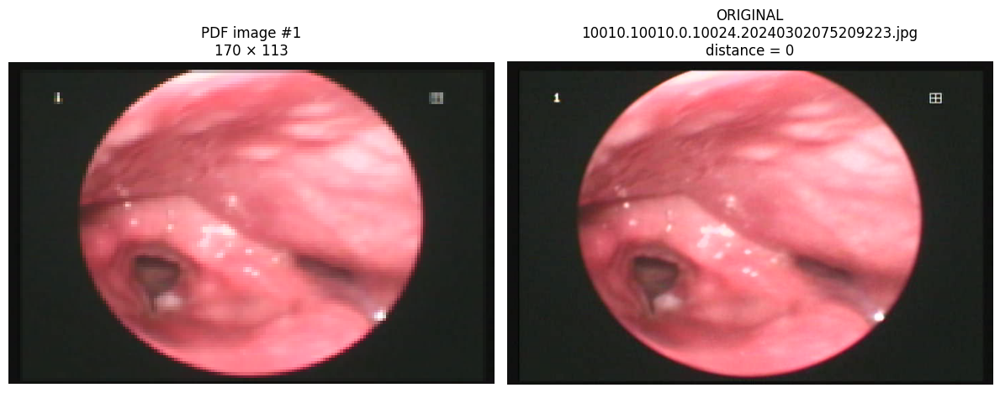

Original: 10010.10010.0.10024.20240302075209223.jpg
Datetime: 2024-03-02 07:52:09
pHash distance: 0
----------------------------------------------------------------------------------------------------


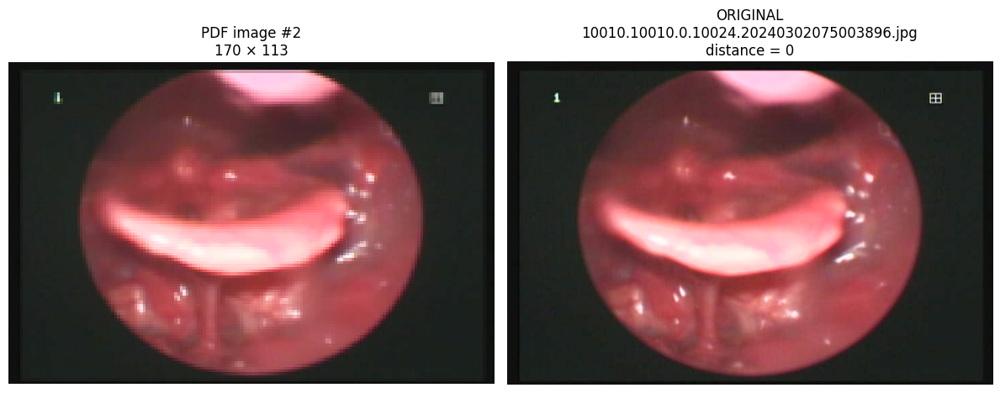

Original: 10010.10010.0.10024.20240302075003896.jpg
Datetime: 2024-03-02 07:50:03
pHash distance: 0
----------------------------------------------------------------------------------------------------


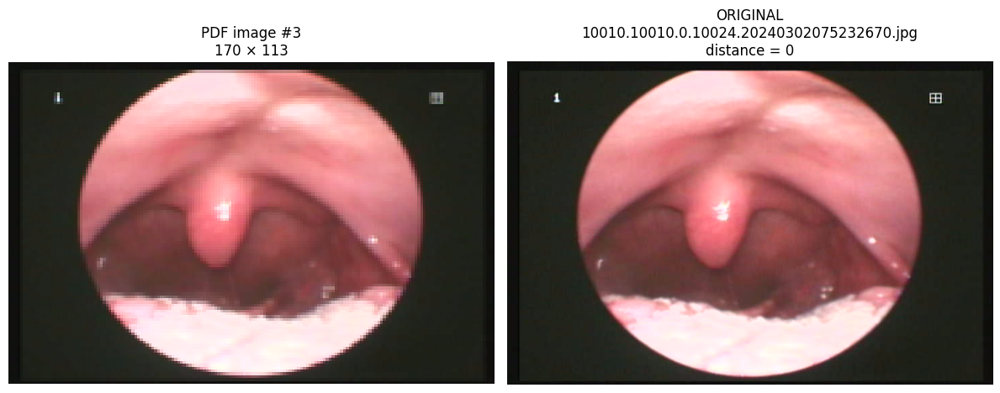

Original: 10010.10010.0.10024.20240302075232670.jpg
Datetime: 2024-03-02 07:52:32
pHash distance: 0
----------------------------------------------------------------------------------------------------


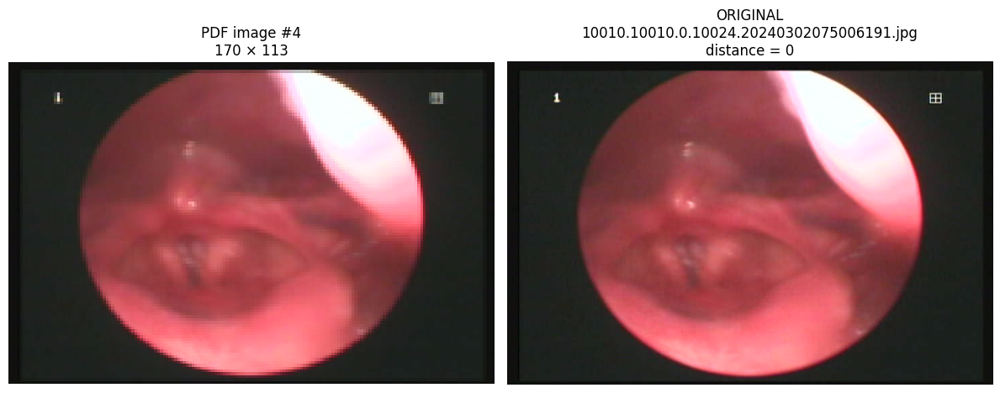

Original: 10010.10010.0.10024.20240302075006191.jpg
Datetime: 2024-03-02 07:50:06
pHash distance: 0
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 2/7
########################################################################################################################
Mean distance: 0.0
Max distance: 0
Mean margin: 15.666666666666666
CASE: 17482.17482.0.17505
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 10/2025 10 08/MAI MINH PHƯƠNG 1986 2025 10 09.pdf
PDF images found: 6


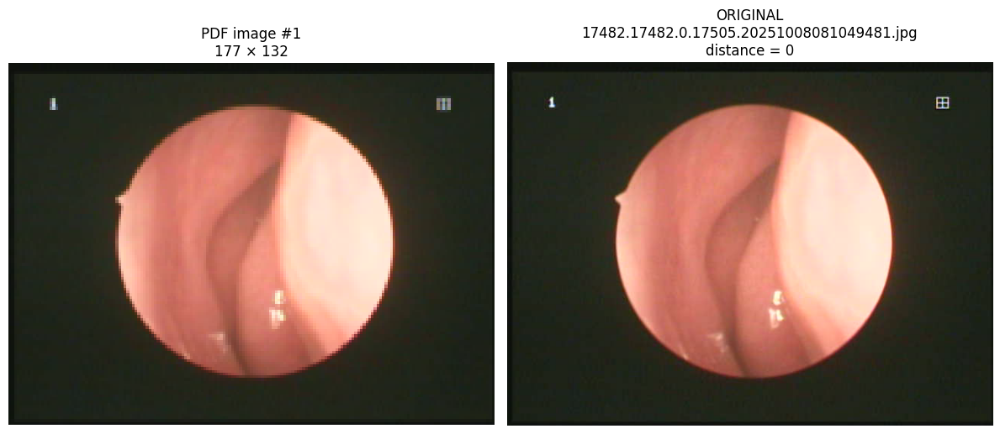

Original: 17482.17482.0.17505.20251008081049481.jpg
Datetime: 2025-10-08 08:10:49
pHash distance: 0
----------------------------------------------------------------------------------------------------


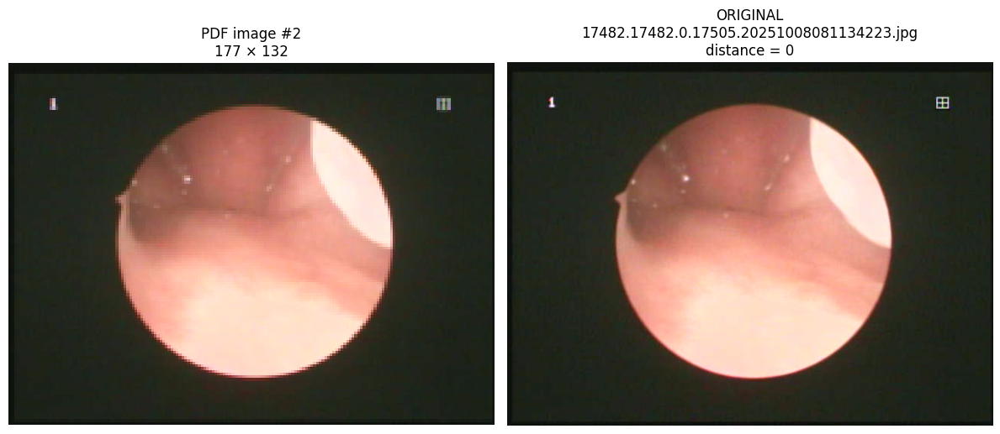

Original: 17482.17482.0.17505.20251008081134223.jpg
Datetime: 2025-10-08 08:11:34
pHash distance: 0
----------------------------------------------------------------------------------------------------


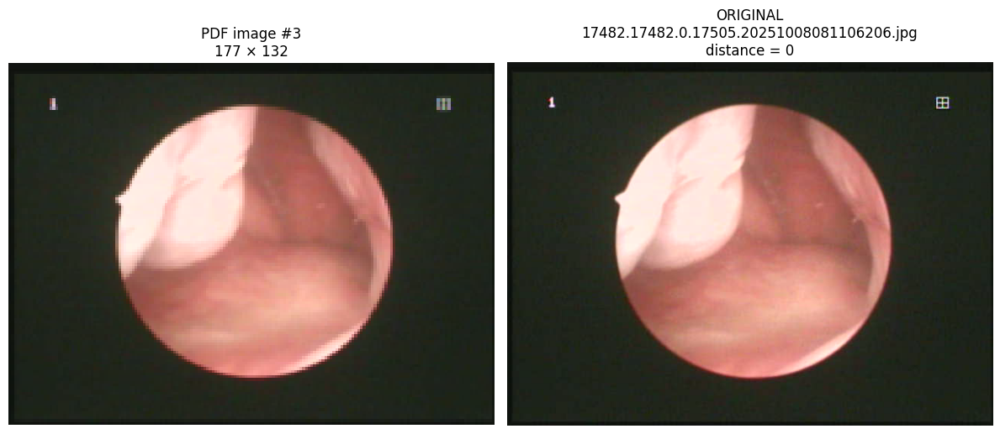

Original: 17482.17482.0.17505.20251008081106206.jpg
Datetime: 2025-10-08 08:11:06
pHash distance: 0
----------------------------------------------------------------------------------------------------


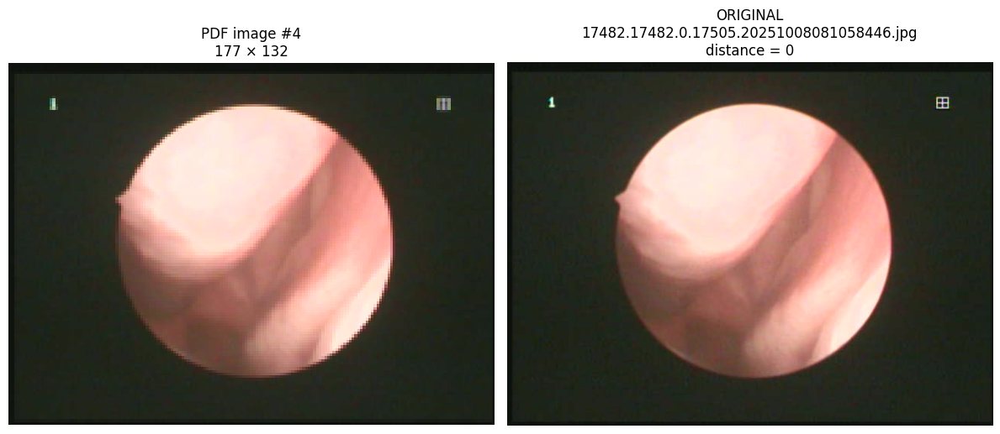

Original: 17482.17482.0.17505.20251008081058446.jpg
Datetime: 2025-10-08 08:10:58
pHash distance: 0
----------------------------------------------------------------------------------------------------


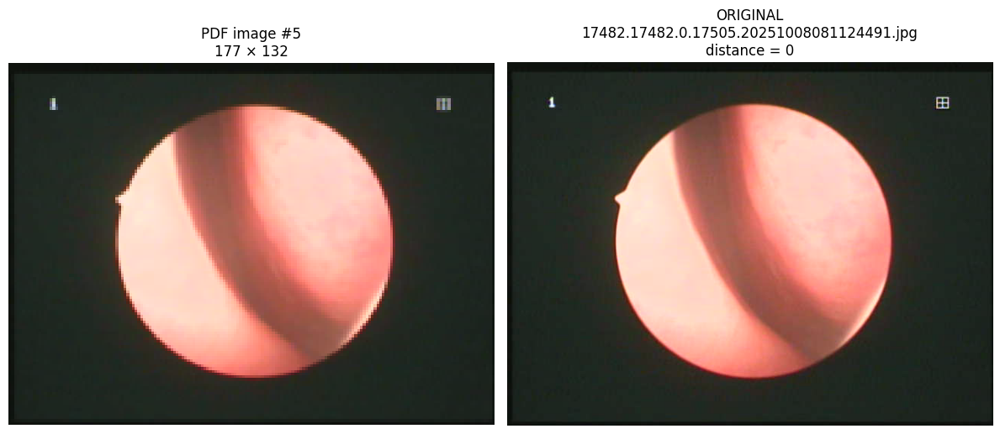

Original: 17482.17482.0.17505.20251008081124491.jpg
Datetime: 2025-10-08 08:11:24
pHash distance: 0
----------------------------------------------------------------------------------------------------


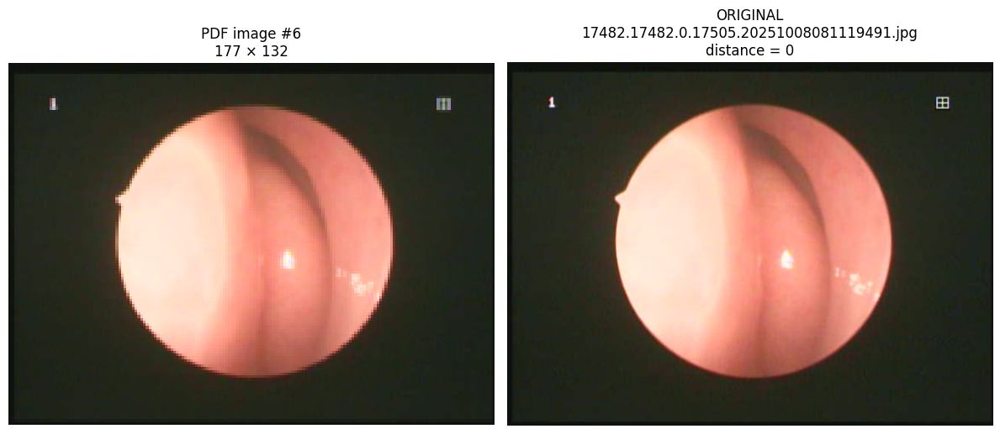

Original: 17482.17482.0.17505.20251008081119491.jpg
Datetime: 2025-10-08 08:11:19
pHash distance: 0
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 3/7
########################################################################################################################
Mean distance: 0.0
Max distance: 0
Mean margin: 15.5
CASE: 10009.10009.0.10023
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN VĂN LIÊM (MŨI) 1982 2024 03 02.pdf
PDF images found: 4


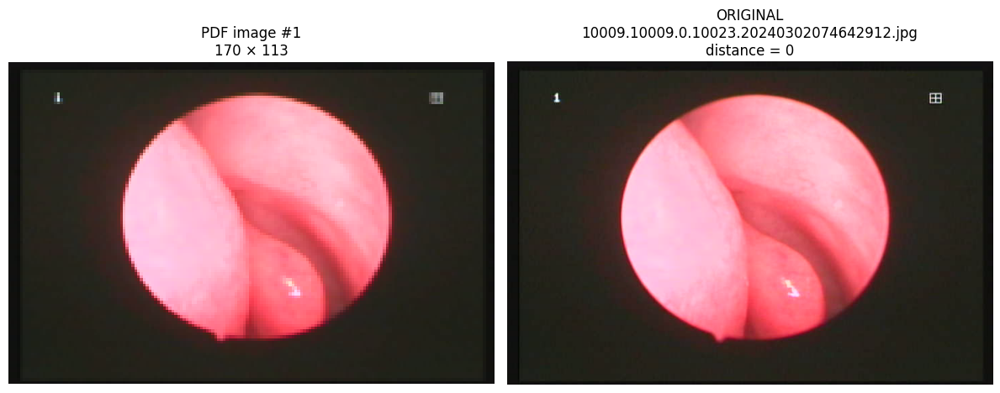

Original: 10009.10009.0.10023.20240302074642912.jpg
Datetime: 2024-03-02 07:46:42
pHash distance: 0
----------------------------------------------------------------------------------------------------


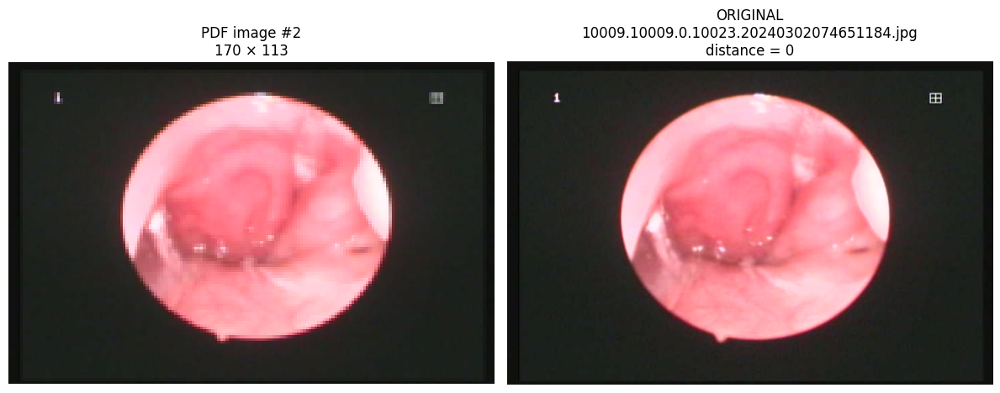

Original: 10009.10009.0.10023.20240302074651184.jpg
Datetime: 2024-03-02 07:46:51
pHash distance: 0
----------------------------------------------------------------------------------------------------


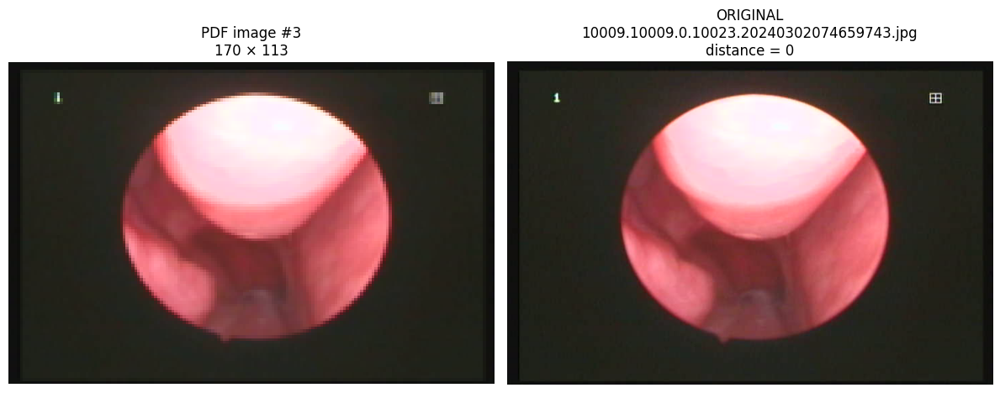

Original: 10009.10009.0.10023.20240302074659743.jpg
Datetime: 2024-03-02 07:46:59
pHash distance: 0
----------------------------------------------------------------------------------------------------


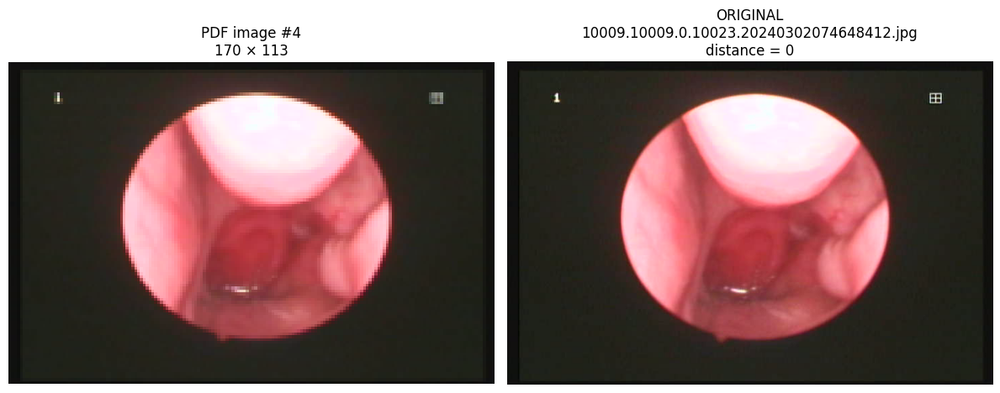

Original: 10009.10009.0.10023.20240302074648412.jpg
Datetime: 2024-03-02 07:46:48
pHash distance: 0
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 4/7
########################################################################################################################
Mean distance: 0.5714285714285714
Max distance: 2
Mean margin: 13.142857142857142
CASE: 10008.10008.0.10022
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/PHẠM THỊ THU HIỀN 1984 2024 03 02.pdf
PDF images found: 7


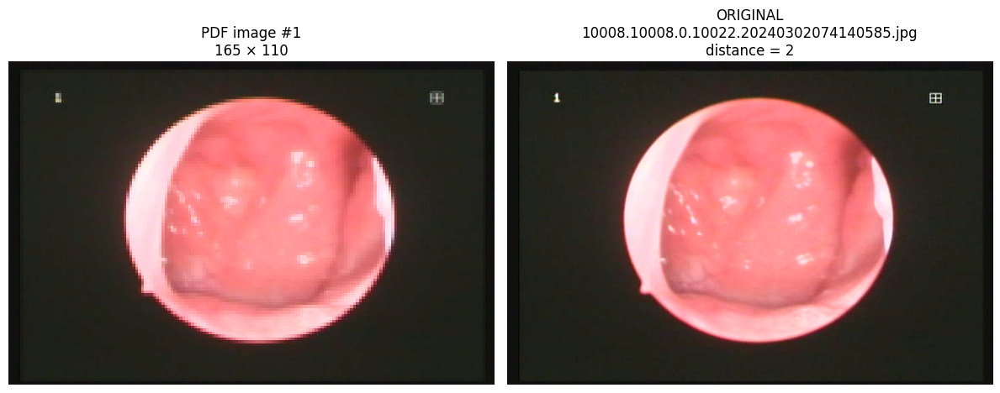

Original: 10008.10008.0.10022.20240302074140585.jpg
Datetime: 2024-03-02 07:41:40
pHash distance: 2
----------------------------------------------------------------------------------------------------


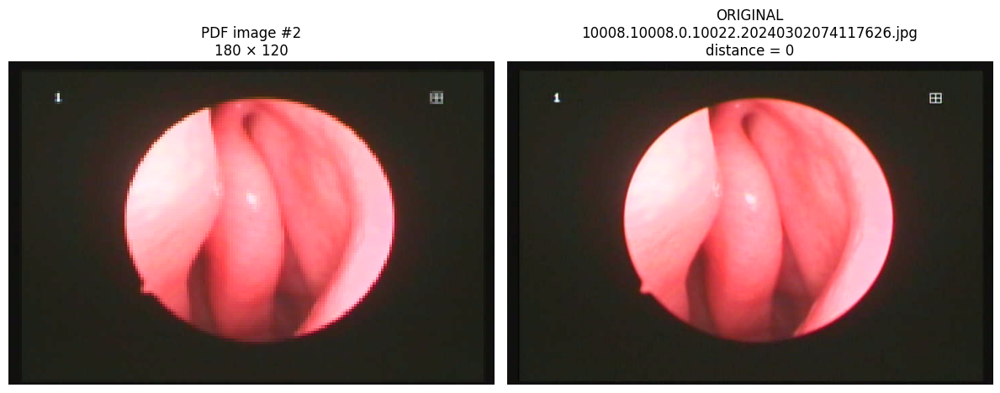

Original: 10008.10008.0.10022.20240302074117626.jpg
Datetime: 2024-03-02 07:41:17
pHash distance: 0
----------------------------------------------------------------------------------------------------


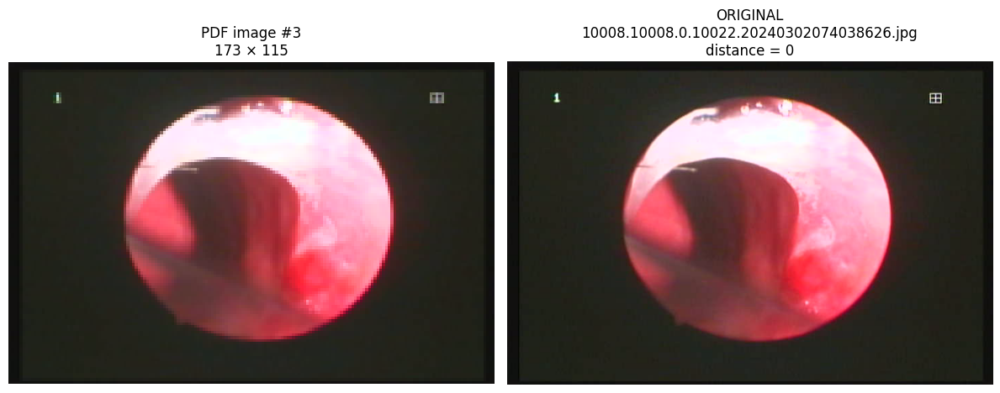

Original: 10008.10008.0.10022.20240302074038626.jpg
Datetime: 2024-03-02 07:40:38
pHash distance: 0
----------------------------------------------------------------------------------------------------


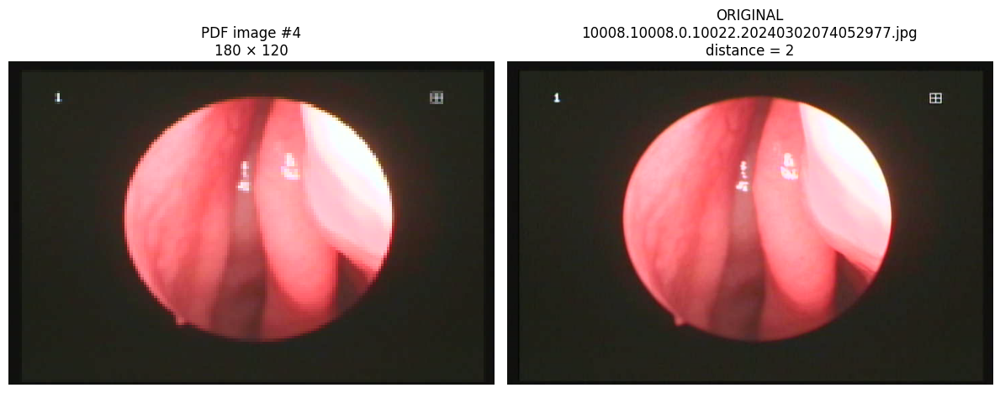

Original: 10008.10008.0.10022.20240302074052977.jpg
Datetime: 2024-03-02 07:40:52
pHash distance: 2
----------------------------------------------------------------------------------------------------


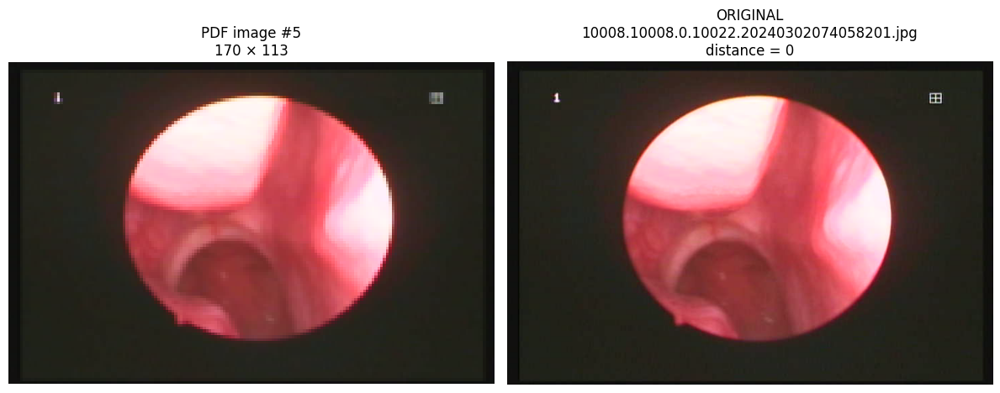

Original: 10008.10008.0.10022.20240302074058201.jpg
Datetime: 2024-03-02 07:40:58
pHash distance: 0
----------------------------------------------------------------------------------------------------


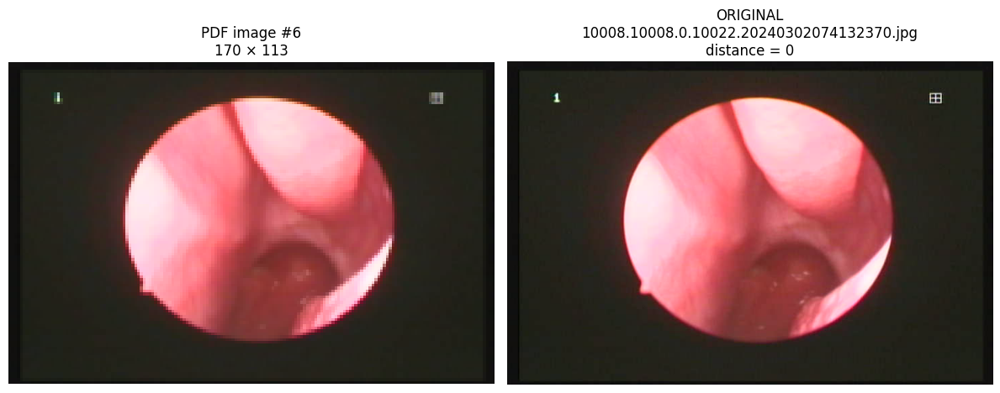

Original: 10008.10008.0.10022.20240302074132370.jpg
Datetime: 2024-03-02 07:41:32
pHash distance: 0
----------------------------------------------------------------------------------------------------


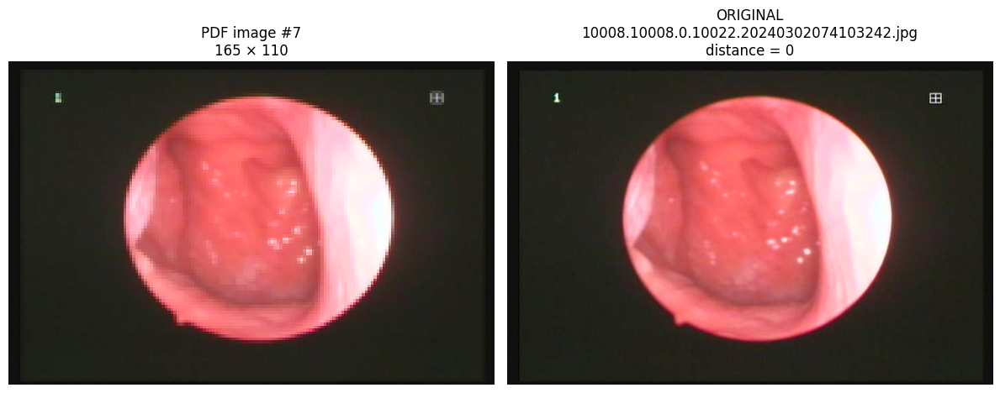

Original: 10008.10008.0.10022.20240302074103242.jpg
Datetime: 2024-03-02 07:41:03
pHash distance: 0
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 5/7
########################################################################################################################
Mean distance: 1.0
Max distance: 2
Mean margin: 29.0
CASE: 17505.17505.0.17530
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 10/2025 10 15/TRẦN KIM SƠN 1970 2025 10 15.pdf
PDF images found: 2


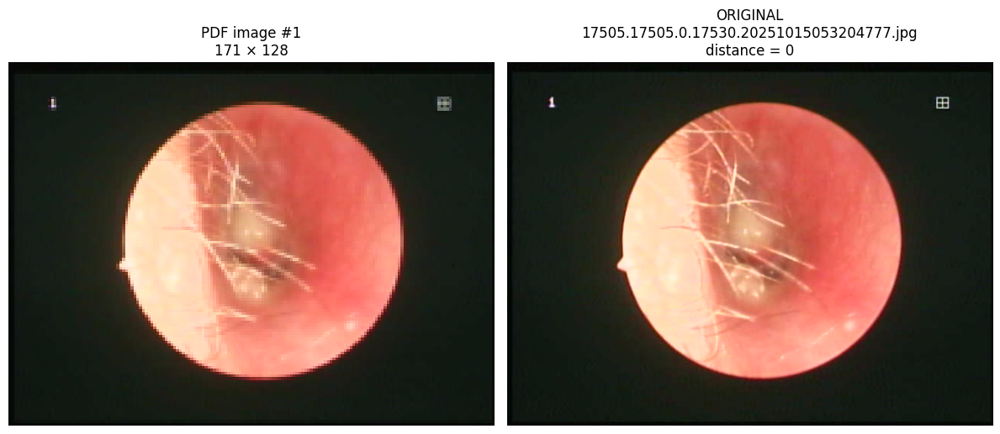

Original: 17505.17505.0.17530.20251015053204777.jpg
Datetime: 2025-10-15 05:32:04
pHash distance: 0
----------------------------------------------------------------------------------------------------


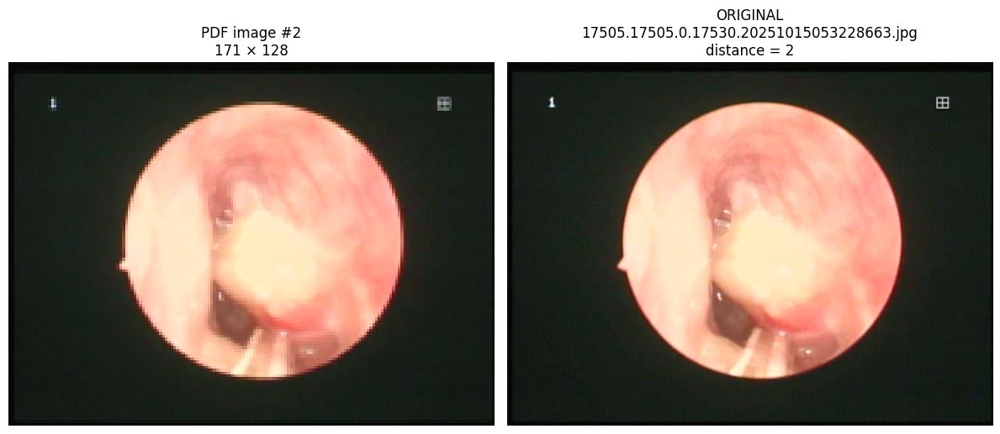

Original: 17505.17505.0.17530.20251015053228663.jpg
Datetime: 2025-10-15 05:32:28
pHash distance: 2
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 6/7
########################################################################################################################
Mean distance: 1.1428571428571428
Max distance: 2
Mean margin: 11.714285714285714
CASE: 10011.10011.0.10025
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/TRẦN MINH ĐỨC 2017 2024 03 02.pdf
PDF images found: 7


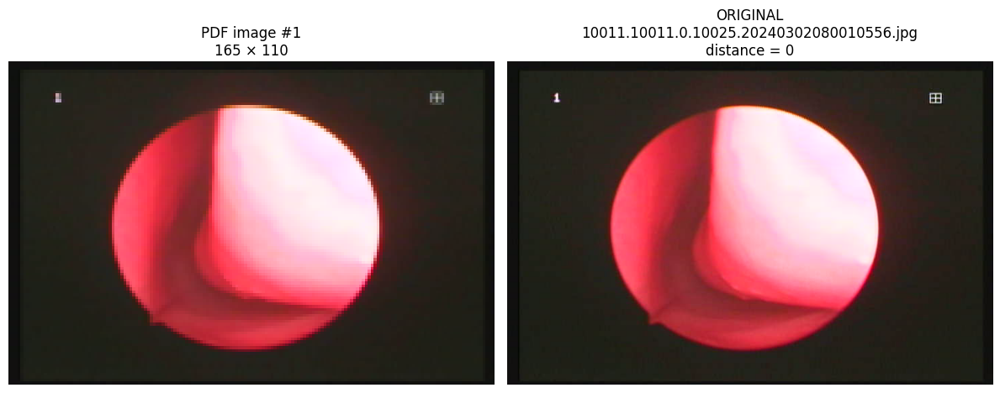

Original: 10011.10011.0.10025.20240302080010556.jpg
Datetime: 2024-03-02 08:00:10
pHash distance: 0
----------------------------------------------------------------------------------------------------


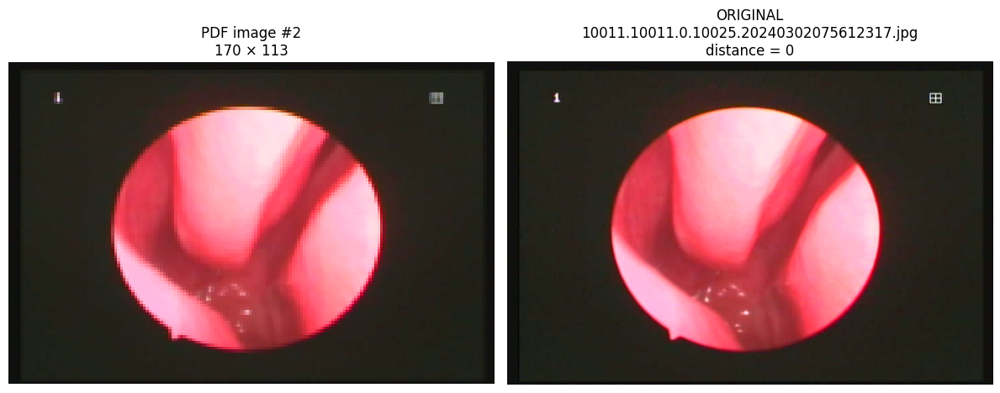

Original: 10011.10011.0.10025.20240302075612317.jpg
Datetime: 2024-03-02 07:56:12
pHash distance: 0
----------------------------------------------------------------------------------------------------


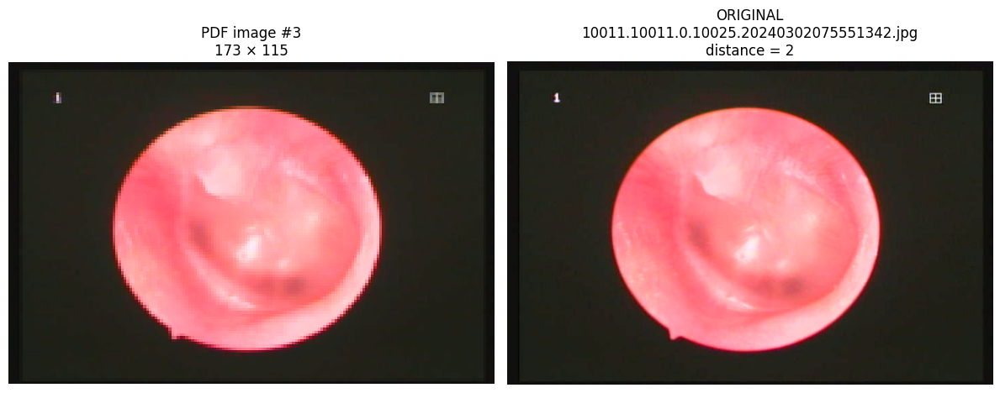

Original: 10011.10011.0.10025.20240302075551342.jpg
Datetime: 2024-03-02 07:55:51
pHash distance: 2
----------------------------------------------------------------------------------------------------


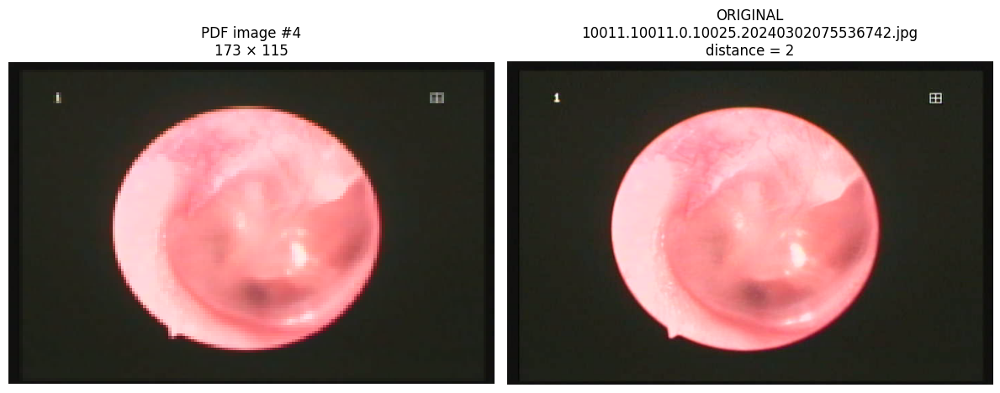

Original: 10011.10011.0.10025.20240302075536742.jpg
Datetime: 2024-03-02 07:55:36
pHash distance: 2
----------------------------------------------------------------------------------------------------


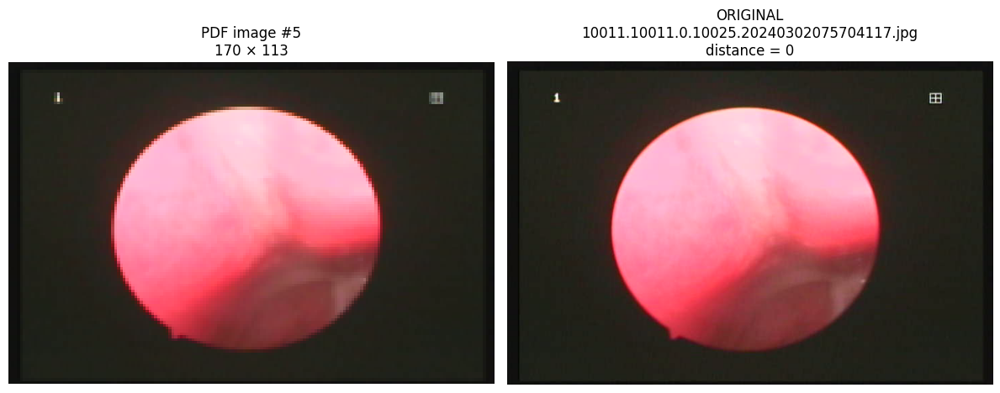

Original: 10011.10011.0.10025.20240302075704117.jpg
Datetime: 2024-03-02 07:57:04
pHash distance: 0
----------------------------------------------------------------------------------------------------


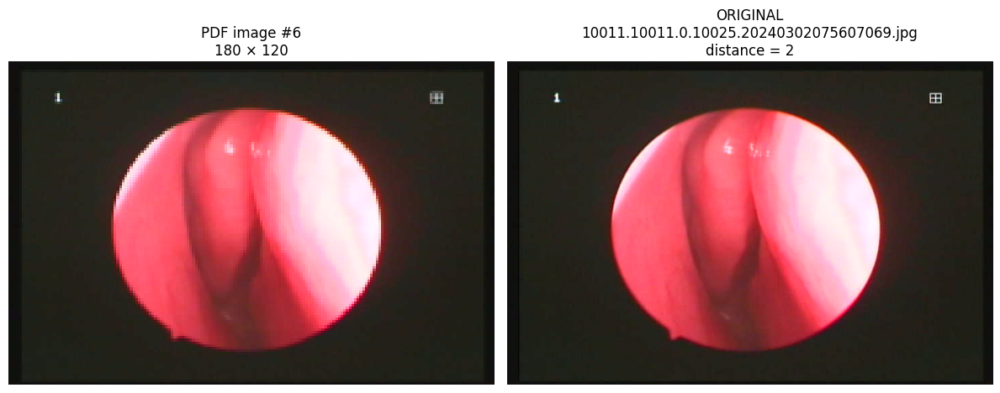

Original: 10011.10011.0.10025.20240302075607069.jpg
Datetime: 2024-03-02 07:56:07
pHash distance: 2
----------------------------------------------------------------------------------------------------


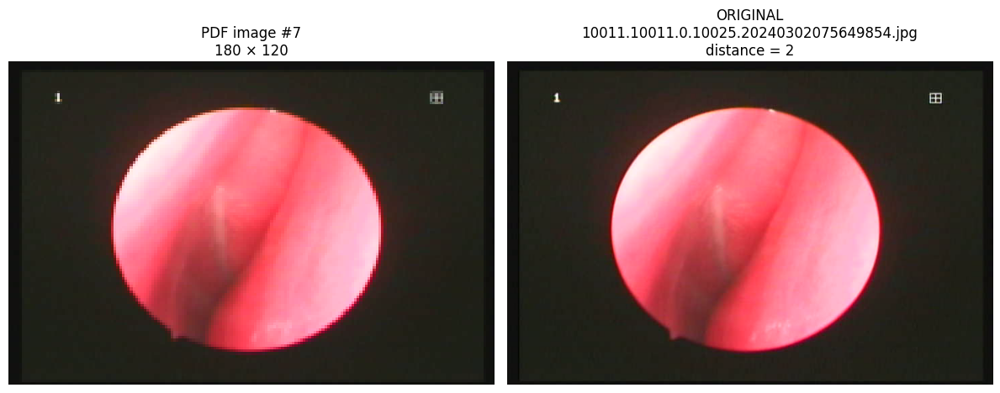

Original: 10011.10011.0.10025.20240302075649854.jpg
Datetime: 2024-03-02 07:56:49
pHash distance: 2
----------------------------------------------------------------------------------------------------



########################################################################################################################
AUDIT CASE 7/7
########################################################################################################################
Mean distance: 17.142857142857142
Max distance: 28
Mean margin: 2.0
CASE: 10971.10971.0.10986
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 5/2024 05 16/VÕ BẢO TRÍ 2015 2024 05 16.pdf
PDF images found: 7


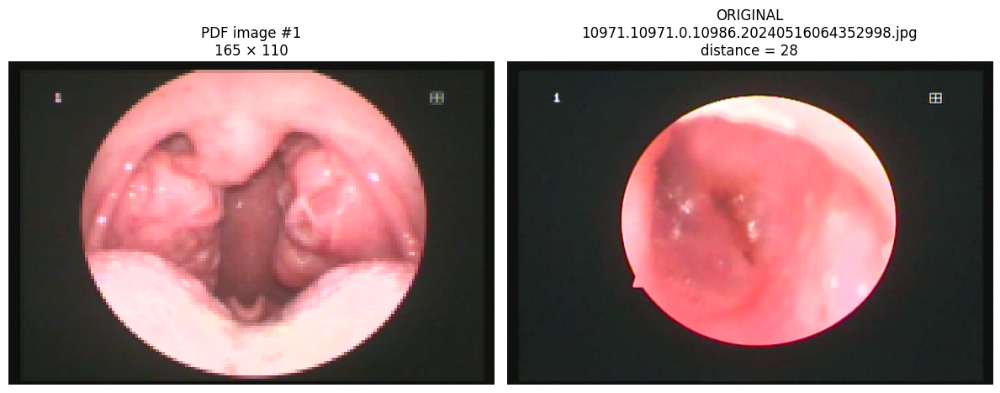

Original: 10971.10971.0.10986.20240516064352998.jpg
Datetime: 2024-05-16 06:43:52
pHash distance: 28
----------------------------------------------------------------------------------------------------


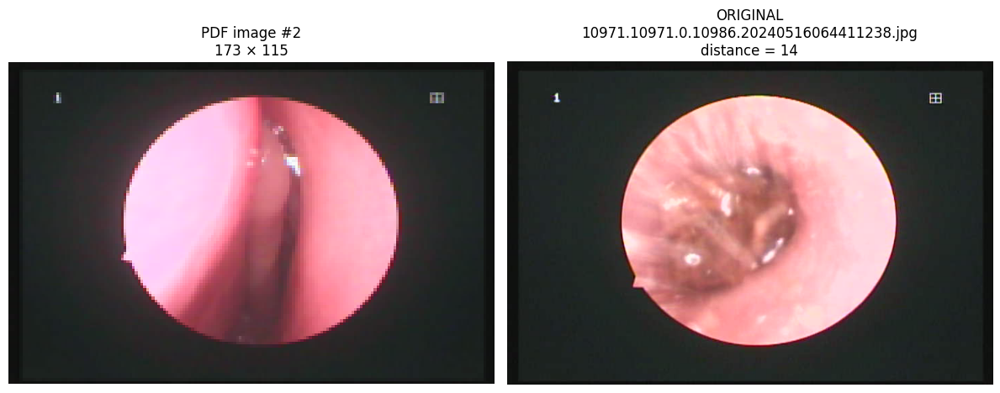

Original: 10971.10971.0.10986.20240516064411238.jpg
Datetime: 2024-05-16 06:44:11
pHash distance: 14
----------------------------------------------------------------------------------------------------


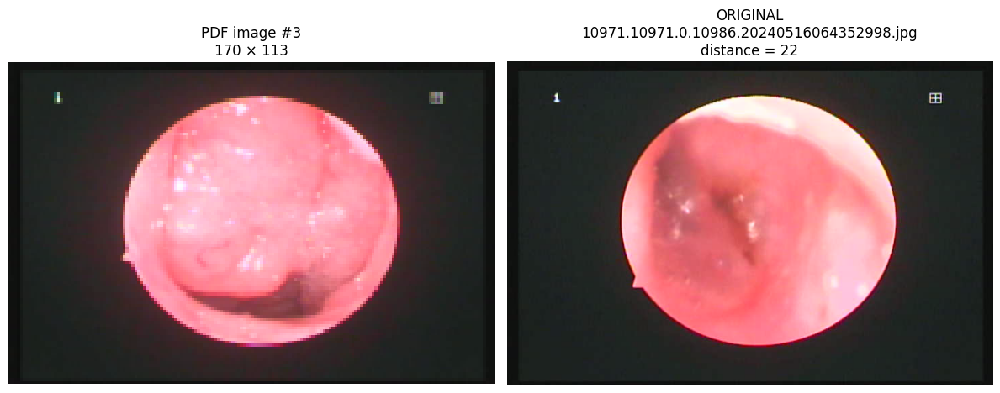

Original: 10971.10971.0.10986.20240516064352998.jpg
Datetime: 2024-05-16 06:43:52
pHash distance: 22
----------------------------------------------------------------------------------------------------


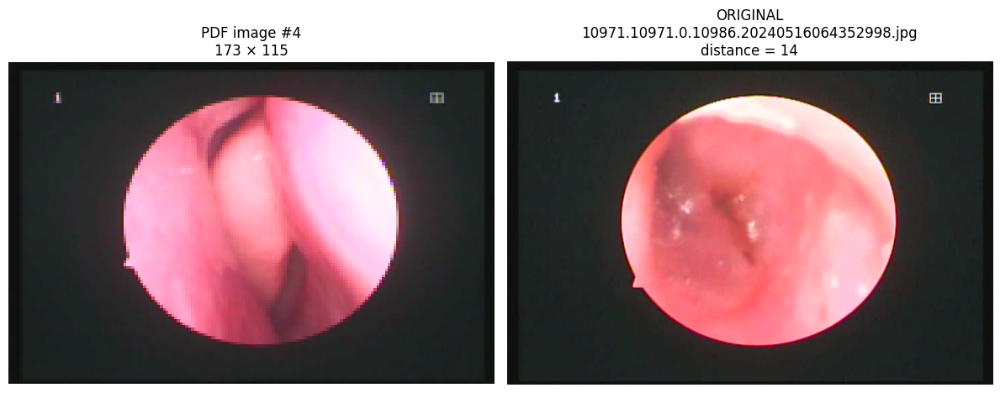

Original: 10971.10971.0.10986.20240516064352998.jpg
Datetime: 2024-05-16 06:43:52
pHash distance: 14
----------------------------------------------------------------------------------------------------


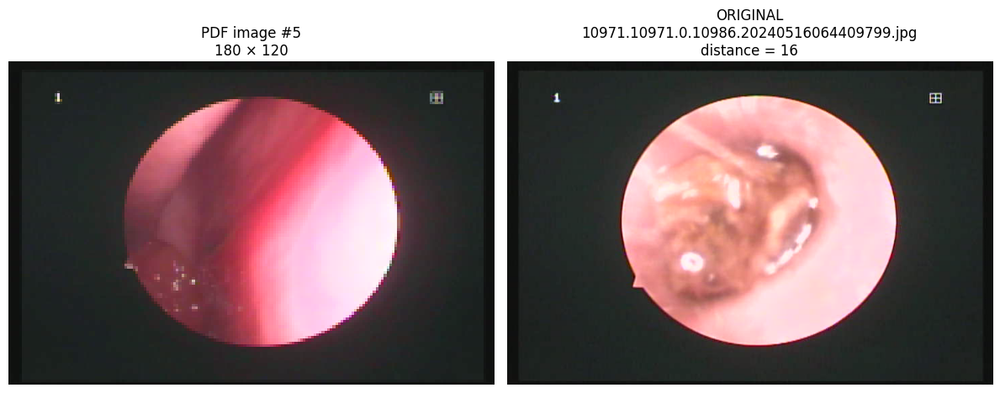

Original: 10971.10971.0.10986.20240516064409799.jpg
Datetime: 2024-05-16 06:44:09
pHash distance: 16
----------------------------------------------------------------------------------------------------


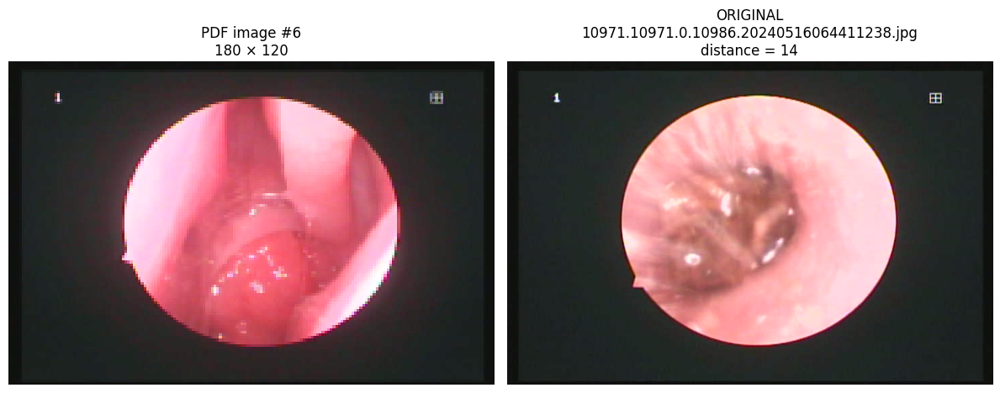

Original: 10971.10971.0.10986.20240516064411238.jpg
Datetime: 2024-05-16 06:44:11
pHash distance: 14
----------------------------------------------------------------------------------------------------


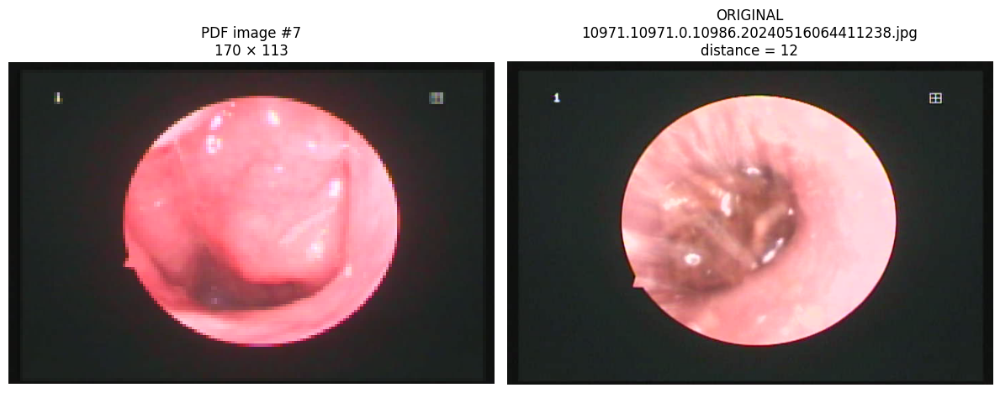

Original: 10971.10971.0.10986.20240516064411238.jpg
Datetime: 2024-05-16 06:44:11
pHash distance: 12
----------------------------------------------------------------------------------------------------


In [64]:
# ============================================
# RUN VISUAL AUDIT
# ============================================

for i, row in audit_cases.iterrows():

    print("\n\n")
    print("#" * 120)
    print(
        f"AUDIT CASE {i+1}/{len(audit_cases)}"
    )
    print("#" * 120)

    print(
        "Mean distance:",
        row["mean_distance"]
    )

    print(
        "Max distance:",
        row["max_distance"]
    )

    print(
        "Mean margin:",
        row["mean_margin"]
    )

    show_audit_case(
        row["parent_folder"],
        row["candidate_pdf"]
    )

In [11]:
# ============================================
# PROJECTNOISOI — PRODUCTION PIPELINE
# CELL 1: SETUP & CHECKPOINTS
# ============================================

from pathlib import Path
import pandas as pd
import numpy as np
import fitz
import imagehash
import io
import json
import os
import ast
import time

from PIL import Image
from tqdm.auto import tqdm

# --------------------------------------------
# Google Drive paths
# --------------------------------------------

IMAGE_ROOT = Path(
    "/content/drive/MyDrive/ImageLocal/ImageLocal"
)

PDF_ROOT = Path(
    "/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày"
)

OUTPUT_DIR = Path(
    "/content/drive/MyDrive/NoiSoi_Matching"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# --------------------------------------------
# Production checkpoints
# --------------------------------------------

PDF_INDEX_FILE = (
    OUTPUT_DIR / "pdf_index.csv"
)

CASE_CANDIDATES_FILE = (
    OUTPUT_DIR / "case_candidates.csv"
)

ORIGINAL_PHASH_FILE = (
    OUTPUT_DIR / "original_image_phash.csv"
)

PDF_PHASH_FILE = (
    OUTPUT_DIR / "pdf_thumbnail_phash.csv"
)

MATCHING_FILE = (
    OUTPUT_DIR / "matching_results.csv"
)

REVIEW_FILE = (
    OUTPUT_DIR / "review_cases.csv"
)

PROGRESS_FILE = (
    OUTPUT_DIR / "progress.json"
)

LOG_DIR = OUTPUT_DIR / "logs"
LOG_DIR.mkdir(
    parents=True,
    exist_ok=True
)

# --------------------------------------------
# Print environment
# --------------------------------------------

print("=" * 70)
print("ProjectNoiSoi — Production Matching")
print("=" * 70)

print("\nImage root:")
print(IMAGE_ROOT)
print("Exists:", IMAGE_ROOT.exists())

print("\nPDF root:")
print(PDF_ROOT)
print("Exists:", PDF_ROOT.exists())

print("\nOutput:")
print(OUTPUT_DIR)

print("\nExisting checkpoints:")

for f in [
    OUTPUT_DIR / "image_index.csv",
    OUTPUT_DIR / "pilot_matching_results.csv",
    PDF_INDEX_FILE,
    CASE_CANDIDATES_FILE,
    ORIGINAL_PHASH_FILE,
    PDF_PHASH_FILE,
    MATCHING_FILE,
    REVIEW_FILE,
    PROGRESS_FILE,
]:
    print(
        f"{'✓' if f.exists() else '—'} "
        f"{f.name}"
    )

ProjectNoiSoi — Production Matching

Image root:
/content/drive/MyDrive/ImageLocal/ImageLocal
Exists: True

PDF root:
/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày
Exists: True

Output:
/content/drive/MyDrive/NoiSoi_Matching

Existing checkpoints:
✓ image_index.csv
✓ pilot_matching_results.csv
✓ pdf_index.csv
✓ case_candidates.csv
✓ original_image_phash.csv
✓ pdf_thumbnail_phash.csv
— matching_results.csv
— review_cases.csv
— progress.json


In [5]:
# ============================================
# CELL 2 — VERIFY EXISTING INDEXES
# ============================================

# Load existing indexes
pdf_df = pd.read_csv(PDF_INDEX_FILE)
case_candidates = pd.read_csv(CASE_CANDIDATES_FILE)

print("=" * 70)
print("PDF INDEX")
print("=" * 70)

print("Rows:", len(pdf_df))
print("Columns:", pdf_df.columns.tolist())

if "date" in pdf_df.columns:
    pdf_df["date"] = pd.to_datetime(
        pdf_df["date"],
        errors="coerce"
    )

print(
    "PDFs with valid date:",
    pdf_df["date"].notna().sum()
    if "date" in pdf_df.columns else "N/A"
)

print(
    "PDFs without date:",
    pdf_df["date"].isna().sum()
    if "date" in pdf_df.columns else "N/A"
)

display(pdf_df.head(5))


print("\n" + "=" * 70)
print("CASE CANDIDATES")
print("=" * 70)

print("Rows:", len(case_candidates))
print("Columns:", case_candidates.columns.tolist())

print(
    "Unique cases:",
    case_candidates["parent_folder"].nunique()
)

if "candidate_pdf" in case_candidates.columns:
    print(
        "Unique candidate PDFs:",
        case_candidates["candidate_pdf"].nunique()
    )

display(case_candidates.head(10))

PDF INDEX
Rows: 21257
Columns: ['pdf_path', 'pdf_name', 'folder', 'date', 'year']
PDFs with valid date: 21241
PDFs without date: 16


,pdf_path,pdf_name,folder,date,year
0,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Văn Đức 2018 09 19.pdf,2018 09 19,2018-09-19,2018.0
1,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Phạm Văn Đức 2018 09 19.pdf,2018 09 19,2018-09-19,2018.0
2,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Đinh Văn Toàn 2018 09 19.pdf,2018 09 19,2018-09-19,2018.0
3,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Nguyễn Thị Ngọc Minh 2018 09 19.pdf,2018 09 19,2018-09-19,2018.0
4,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,Võ Ngọc Hà Thư 2018 09 19.pdf,2018 09 19,2018-09-19,2018.0



CASE CANDIDATES
Rows: 133309
Columns: ['parent_folder', 'first_datetime', 'last_datetime', 'num_images', 'num_dates', 'first_date', 'last_date', 'candidate_date', 'candidate_pdf', 'candidate_status']
Unique cases: 8150
Unique candidate PDFs: 8063


,parent_folder,first_datetime,last_datetime,num_images,num_dates,first_date,last_date,candidate_date,candidate_pdf,candidate_status
0,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
1,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
2,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
3,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
4,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
5,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
6,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
7,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
8,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
9,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending


In [6]:
# ============================================
# CELL 3 — NORMALIZE PDF INDEX + CASE CANDIDATES
# ============================================

import re
from datetime import datetime

# ------------------------------------------------
# 1. Robust date parser from PDF FOLDER PATH
# ------------------------------------------------

def parse_date_from_folder(folder):
    """
    Parse date from folder name.

    Expected examples:
        2018 09 19
        2024-03-12
        2023-09-01
    """

    if pd.isna(folder):
        return pd.NaT

    s = str(folder).strip()

    # YYYY MM DD
    m = re.search(
        r"\b(20\d{2})\s+(\d{1,2})\s+(\d{1,2})\b",
        s
    )

    if m:
        y, mo, d = map(int, m.groups())

        try:
            return pd.Timestamp(
                year=y,
                month=mo,
                day=d
            )
        except:
            pass

    # YYYY-MM-DD
    m = re.search(
        r"\b(20\d{2})-(\d{1,2})-(\d{1,2})\b",
        s
    )

    if m:
        y, mo, d = map(int, m.groups())

        try:
            return pd.Timestamp(
                year=y,
                month=mo,
                day=d
            )
        except:
            pass

    return pd.NaT


# ------------------------------------------------
# 2. Repair PDF index
# ------------------------------------------------

pdf_df = pd.read_csv(PDF_INDEX_FILE)

print("Original PDF index:", len(pdf_df))

# Date comes from folder path, NOT filename
pdf_df["date"] = pdf_df["folder"].apply(
    parse_date_from_folder
)

pdf_df["year"] = pdf_df["date"].dt.year

print(
    "Valid dates:",
    pdf_df["date"].notna().sum()
)

print(
    "Missing dates:",
    pdf_df["date"].isna().sum()
)

# Keep useful columns
pdf_df = pdf_df[
    [
        "pdf_path",
        "pdf_name",
        "folder",
        "date",
        "year"
    ]
].copy()

# Save normalized PDF index
pdf_df.to_csv(
    PDF_INDEX_FILE,
    index=False
)

print("\nSaved:", PDF_INDEX_FILE)


# ------------------------------------------------
# 3. Load image index
# ------------------------------------------------

image_df = pd.read_csv(
    OUTPUT_DIR / "image_index.csv"
)

print(
    "\nImage index rows:",
    len(image_df)
)

# Reconstruct parent_folder if needed
if "parent_folder" not in image_df.columns:

    image_df["parent_folder"] = (
        image_df["image_path"]
        .apply(
            lambda x: Path(x).parent.name
        )
    )

# Normalize dates
image_df["date"] = pd.to_datetime(
    image_df["date"],
    errors="coerce"
)

image_df["date_only"] = (
    image_df["date"]
    .dt.strftime("%Y-%m-%d")
)


# ------------------------------------------------
# 4. Build PDF lookup by date
# ------------------------------------------------

pdf_by_date = {}

for date, group in pdf_df[
    pdf_df["date"].notna()
].groupby("date"):

    key = date.strftime("%Y-%m-%d")

    pdf_by_date[key] = group[
        "pdf_path"
    ].tolist()


# ------------------------------------------------
# 5. Build CASE × PDF candidate table
# ------------------------------------------------

case_rows = []

for parent_folder, group in tqdm(
    image_df.groupby("parent_folder"),
    total=image_df["parent_folder"].nunique(),
    desc="Building case candidates"
):

    dates = sorted(
        group["date_only"]
        .dropna()
        .unique()
    )

    first_datetime = group["date"].min()
    last_datetime = group["date"].max()

    # --------------------------------------------
    # Candidate PDFs from ALL dates in this case
    # --------------------------------------------

    candidates = []

    for d in dates:
        candidates.extend(
            pdf_by_date.get(d, [])
        )

    # remove duplicates while preserving order
    candidates = list(
        dict.fromkeys(candidates)
    )

    # --------------------------------------------
    # One row per case × candidate PDF
    # --------------------------------------------

    if candidates:

        for pdf_path in candidates:

            pdf_date = (
                pdf_df.loc[
                    pdf_df["pdf_path"] == pdf_path,
                    "date"
                ].iloc[0]
            )

            case_rows.append({
                "parent_folder": parent_folder,
                "first_datetime": first_datetime,
                "last_datetime": last_datetime,
                "num_images": len(group),
                "num_dates": len(dates),
                "first_date": dates[0] if dates else None,
                "last_date": dates[-1] if dates else None,
                "candidate_date": (
                    pdf_date.strftime("%Y-%m-%d")
                    if pd.notna(pdf_date)
                    else None
                ),
                "candidate_pdf": pdf_path,
                "candidate_status": "pending"
            })

    else:

        # Keep cases with NO candidate PDF
        case_rows.append({
            "parent_folder": parent_folder,
            "first_datetime": first_datetime,
            "last_datetime": last_datetime,
            "num_images": len(group),
            "num_dates": len(dates),
            "first_date": dates[0] if dates else None,
            "last_date": dates[-1] if dates else None,
            "candidate_date": None,
            "candidate_pdf": None,
            "candidate_status": "NO_CANDIDATE"
        })


case_candidates_prod = pd.DataFrame(
    case_rows
)

# ------------------------------------------------
# 6. Save production candidate table
# ------------------------------------------------

case_candidates_prod.to_csv(
    CASE_CANDIDATES_FILE,
    index=False
)

print("\n" + "=" * 70)
print("PRODUCTION CANDIDATES")
print("=" * 70)

print(
    "Rows:",
    len(case_candidates_prod)
)

print(
    "Unique cases:",
    case_candidates_prod[
        "parent_folder"
    ].nunique()
)

print(
    "Cases with candidate PDFs:",
    case_candidates_prod.loc[
        case_candidates_prod["candidate_pdf"].notna(),
        "parent_folder"
    ].nunique()
)

print(
    "Cases with NO candidate:",
    case_candidates_prod.loc[
        case_candidates_prod["candidate_pdf"].isna(),
        "parent_folder"
    ].nunique()
)

print(
    "Unique candidate PDFs:",
    case_candidates_prod[
        "candidate_pdf"
    ].nunique()
)

print("\nCandidate count distribution:")

candidate_counts = (
    case_candidates_prod
    .groupby("parent_folder")["candidate_pdf"]
    .count()
)

print(
    candidate_counts.describe()
)

print("\nSample:")
display(
    case_candidates_prod.head(10)
)

Original PDF index: 21257
Valid dates: 21241
Missing dates: 16

Saved: /content/drive/MyDrive/NoiSoi_Matching/pdf_index.csv

Image index rows: 81786


Building case candidates:   0%|          | 0/8150 [00:00<?, ?it/s]


PRODUCTION CANDIDATES
Rows: 133309
Unique cases: 8150
Cases with candidate PDFs: 8127
Cases with NO candidate: 23
Unique candidate PDFs: 8063

Candidate count distribution:
count    8150.000000
mean       16.354110
std         5.854497
min         0.000000
25%        12.000000
50%        16.000000
75%        20.000000
max        34.000000
Name: candidate_pdf, dtype: float64

Sample:


,parent_folder,first_datetime,last_datetime,num_images,num_dates,first_date,last_date,candidate_date,candidate_pdf,candidate_status
0,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
1,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
2,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
3,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
4,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
5,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
6,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
7,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
8,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending
9,10000.10000.0.10014,2024-03-02,2024-03-02,9,1,2024-03-02,2024-03-02,2024-03-02,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,pending


In [7]:
# ============================================
# CELL 4 — ORIGINAL IMAGE pHASH CACHE
# ============================================

import imagehash
from PIL import Image
import pandas as pd
import numpy as np
from pathlib import Path
from tqdm.auto import tqdm
import time
import os

PHASH_BATCH_SIZE = 500

IMAGE_PHASH_FILE = OUTPUT_DIR / "original_image_phash.csv"


# ------------------------------------------------
# Load image index
# ------------------------------------------------

image_df = pd.read_csv(
    OUTPUT_DIR / "image_index.csv"
)

print("Images in index:", len(image_df))

# Reconstruct parent_folder if necessary
if "parent_folder" not in image_df.columns:
    image_df["parent_folder"] = (
        image_df["image_path"]
        .apply(lambda x: Path(x).parent.name)
    )


# ------------------------------------------------
# Load existing hash cache
# ------------------------------------------------

if IMAGE_PHASH_FILE.exists():

    phash_df = pd.read_csv(
        IMAGE_PHASH_FILE
    )

    print(
        "Existing cached hashes:",
        len(phash_df)
    )

else:

    phash_df = pd.DataFrame(
        columns=[
            "image_path",
            "parent_folder",
            "image_name",
            "datetime",
            "date",
            "phash",
            "status",
            "error"
        ]
    )

    print("No existing pHash cache.")


# ------------------------------------------------
# Determine images still needing hash
# ------------------------------------------------

cached_paths = set(
    phash_df.loc[
        phash_df["status"].isin(
            ["success", "error"]
        ),
        "image_path"
    ].astype(str)
)

todo_df = image_df[
    ~image_df["image_path"].astype(str).isin(
        cached_paths
    )
].copy()

print(
    "Images remaining:",
    len(todo_df)
)

print(
    "Already processed:",
    len(cached_paths)
)


# ------------------------------------------------
# Hash function
# ------------------------------------------------

def compute_phash(image_path):

    try:

        with Image.open(image_path) as img:

            # Convert consistently
            img = img.convert("RGB")

            h = imagehash.phash(img)

        return str(h), "success", ""

    except Exception as e:

        return (
            None,
            "error",
            repr(e)
        )


# ------------------------------------------------
# Incremental processing
# ------------------------------------------------

new_rows = []

start_time = time.time()

for i, row in enumerate(
    tqdm(
        todo_df.itertuples(index=False),
        total=len(todo_df),
        desc="Computing original image pHash"
    )
):

    image_path = str(row.image_path)

    phash, status, error = compute_phash(
        image_path
    )

    new_rows.append({
        "image_path": image_path,
        "parent_folder": row.parent_folder,
        "image_name": row.image_name,
        "datetime": row.datetime,
        "date": row.date,
        "phash": phash,
        "status": status,
        "error": error
    })


    # --------------------------------------------
    # Save every batch
    # --------------------------------------------

    if (
        len(new_rows) >= PHASH_BATCH_SIZE
        or i == len(todo_df) - 1
    ):

        batch_df = pd.DataFrame(
            new_rows
        )

        phash_df = pd.concat(
            [
                phash_df,
                batch_df
            ],
            ignore_index=True
        )

        # Remove accidental duplicates
        phash_df = (
            phash_df
            .drop_duplicates(
                subset=["image_path"],
                keep="last"
            )
        )

        # Atomic-ish save
        temp_file = (
            IMAGE_PHASH_FILE
            .with_suffix(".tmp.csv")
        )

        phash_df.to_csv(
            temp_file,
            index=False
        )

        os.replace(
            temp_file,
            IMAGE_PHASH_FILE
        )

        print(
            f"\nCheckpoint saved: "
            f"{len(phash_df):,} rows"
        )

        new_rows = []


elapsed = time.time() - start_time


# ------------------------------------------------
# Final verification
# ------------------------------------------------

phash_df = pd.read_csv(
    IMAGE_PHASH_FILE
)

print("\n" + "=" * 70)
print("ORIGINAL IMAGE pHASH CACHE")
print("=" * 70)

print(
    "Total cached:",
    len(phash_df)
)

print(
    "Success:",
    (phash_df["status"] == "success").sum()
)

print(
    "Errors:",
    (phash_df["status"] == "error").sum()
)

print(
    "Unique images:",
    phash_df["image_path"].nunique()
)

print(
    "Elapsed this run:",
    round(elapsed / 60, 2),
    "minutes"
)

print(
    "\nSaved to:",
    IMAGE_PHASH_FILE
)

display(
    phash_df.head()
)

Images in index: 81786
Existing cached hashes: 80500
Images remaining: 1286
Already processed: 80500


/tmp/ipykernel_1328/2676897075.py:43: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  phash_df = pd.read_csv(


Computing original image pHash:   0%|          | 0/1286 [00:00<?, ?it/s]


Checkpoint saved: 81,000 rows

Checkpoint saved: 81,500 rows

Checkpoint saved: 81,786 rows

ORIGINAL IMAGE pHASH CACHE
Total cached: 81786
Success: 81784
Errors: 2
Unique images: 81786
Elapsed this run: 21.26 minutes

Saved to: /content/drive/MyDrive/NoiSoi_Matching/original_image_phash.csv


/tmp/ipykernel_1328/2676897075.py:221: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  phash_df = pd.read_csv(


,image_path,parent_folder,image_name,datetime,date,phash,status,error
0,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150,10136.10136.0.10150.20240312062148207.jpg,2024-03-12 06:21:48,2024-03-12,9eed6992254d6631,success,NaN
1,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150,10136.10136.0.10150.20240312062200704.jpg,2024-03-12 06:22:00,2024-03-12,9a996966653326dc,success,NaN
2,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150,10136.10136.0.10150.20240312062224039.jpg,2024-03-12 06:22:24,2024-03-12,869b796d3164e632,success,NaN
3,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150,10136.10136.0.10150.20240312062229247.jpg,2024-03-12 06:22:29,2024-03-12,8799786665647636,success,NaN
4,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,10136.10136.0.10150,10136.10136.0.10150.20240312062238671.jpg,2024-03-12 06:22:38,2024-03-12,9e9a796565906633,success,NaN


08 sep 23:22
\
.
.
.
.
.
.
.

..
.
.
.

.

.
.
.
.
.
.
|||||


.
.
.
.
.
.
.
.
.
.
.
.
.
.
.








||||

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# ============================================
# VERIFY ORIGINAL pHASH CHECKPOINT
# ============================================

import pandas as pd
from pathlib import Path

IMAGE_PHASH_FILE = (
    Path("/content/drive/MyDrive/NoiSoi_Matching")
    / "original_image_phash.csv"
)

phash_df = pd.read_csv(
    IMAGE_PHASH_FILE,
    low_memory=False
)

print("=" * 70)
print("ORIGINAL IMAGE pHASH CHECKPOINT")
print("=" * 70)

print("Rows:", len(phash_df))
print("Unique images:", phash_df["image_path"].nunique())

print(
    "Success:",
    (phash_df["status"] == "success").sum()
)

print(
    "Errors:",
    (phash_df["status"] == "error").sum()
)

print("\nErrors:")
display(
    phash_df[
        phash_df["status"] == "error"
    ][
        [
            "image_path",
            "parent_folder",
            "error"
        ]
    ]
)

ORIGINAL IMAGE pHASH CHECKPOINT
Rows: 81786
Unique images: 81786
Success: 81784
Errors: 0

Errors:


,image_path,parent_folder,error


In [8]:
# ============================================
# CELL 5 — INSPECT 2 FAILED ORIGINAL IMAGES
# ============================================

from pathlib import Path
from PIL import Image, UnidentifiedImageError
import pandas as pd
import os

IMAGE_PHASH_FILE = (
    OUTPUT_DIR / "original_image_phash.csv"
)

phash_df = pd.read_csv(
    IMAGE_PHASH_FILE,
    low_memory=False
)

error_df = phash_df[
    phash_df["status"] == "error"
].copy()

print("Number of failed images:", len(error_df))

for _, row in error_df.iterrows():

    path = Path(row["image_path"])

    print("\n" + "=" * 70)
    print("PATH:")
    print(path)

    print("\nExists:", path.exists())

    if path.exists():

        print(
            "File size:",
            path.stat().st_size,
            "bytes"
        )

        print(
            "Extension:",
            path.suffix
        )

        # ----------------------------------------
        # PIL test
        # ----------------------------------------

        try:

            with Image.open(path) as img:

                print(
                    "PIL format:",
                    img.format
                )

                print(
                    "PIL size:",
                    img.size
                )

                print(
                    "PIL mode:",
                    img.mode
                )

                # Verify actual image contents
                img.verify()

                print(
                    "PIL verify: SUCCESS"
                )

        except Exception as e:

            print(
                "PIL test:",
                type(e).__name__,
                str(e)[:300]
            )

        # ----------------------------------------
        # File header
        # ----------------------------------------

        try:

            with open(path, "rb") as f:
                header = f.read(32)

            print(
                "\nFirst 32 bytes:",
                header
            )

        except Exception as e:

            print(
                "Header read error:",
                repr(e)
            )

Number of failed images: 0


In [9]:
# ============================================
# CELL 6 — MARK CORRUPTED ORIGINAL IMAGES
# ============================================

IMAGE_PHASH_FILE = (
    OUTPUT_DIR / "original_image_phash.csv"
)

phash_df = pd.read_csv(
    IMAGE_PHASH_FILE,
    low_memory=False
)

corrupted_paths = [
    "/content/drive/MyDrive/ImageLocal/ImageLocal/"
    "13670.13670.0/13670.13670.0.13689/"
    "13670.13670.0.13689.20241210061045704.jpg",

    "/content/drive/MyDrive/ImageLocal/ImageLocal/"
    "14070.14070.0/14070.14070.0.14089/"
    "14070.14070.0.14089.20250104060629614.jpg",
]

mask = phash_df["image_path"].isin(
    corrupted_paths
)

print("Rows found:", mask.sum())

phash_df.loc[mask, "status"] = "error_corrupted"

phash_df.loc[
    mask,
    "error"
] = "File exists but binary content is not a valid JPEG; header starts with 0x00 bytes."

# Atomic save
temp_file = IMAGE_PHASH_FILE.with_suffix(
    ".tmp.csv"
)

phash_df.to_csv(
    temp_file,
    index=False
)

os.replace(
    temp_file,
    IMAGE_PHASH_FILE
)

print("\nSaved:", IMAGE_PHASH_FILE)

print("\nStatus distribution:")
print(
    phash_df["status"].value_counts()
)

print("\nCorrupted files:")
display(
    phash_df[
        phash_df["status"] == "error_corrupted"
    ][
        [
            "image_path",
            "parent_folder",
            "status",
            "error"
        ]
    ]
)

Rows found: 2

Saved: /content/drive/MyDrive/NoiSoi_Matching/original_image_phash.csv

Status distribution:
status
success            81784
error_corrupted        2
Name: count, dtype: int64

Corrupted files:


,image_path,parent_folder,status,error
31185,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,13670.13670.0.13689,error_corrupted,File exists but binary content is not a valid ...
37404,/content/drive/MyDrive/ImageLocal/ImageLocal/1...,14070.14070.0.14089,error_corrupted,File exists but binary content is not a valid ...


In [12]:
# ============================================
# CELL 7 — PDF THUMBNAIL EXTRACTION + pHASH
# CHECKPOINT / RESUME SAFE
# ============================================

import os
import io
import hashlib
import time
from pathlib import Path

import fitz
import imagehash
import pandas as pd
from PIL import Image, UnidentifiedImageError
from tqdm.auto import tqdm


# ------------------------------------------------
# Paths
# ------------------------------------------------

PDF_THUMB_DIR = OUTPUT_DIR / "pdf_thumbnails"
PDF_THUMB_DIR.mkdir(
    parents=True,
    exist_ok=True
)

PDF_PHASH_FILE = (
    OUTPUT_DIR / "pdf_thumbnail_phash.csv"
)

PDF_THUMB_BATCH_SIZE = 25


# ------------------------------------------------
# Load PDF index
# ------------------------------------------------

pdf_df = pd.read_csv(
    PDF_INDEX_FILE,
    low_memory=False
)

print(
    "PDFs in index:",
    len(pdf_df)
)

print(
    "PDF index columns:",
    pdf_df.columns.tolist()
)


# ------------------------------------------------
# Load existing PDF thumbnail cache
# ------------------------------------------------

if PDF_PHASH_FILE.exists():

    pdf_phash_df = pd.read_csv(
        PDF_PHASH_FILE,
        low_memory=False
    )

    print(
        "Existing thumbnail rows:",
        len(pdf_phash_df)
    )

else:

    pdf_phash_df = pd.DataFrame(
        columns=[
            "pdf_path",
            "image_idx",
            "page",
            "xref",
            "width",
            "height",
            "image_ext",
            "thumbnail_path",
            "phash",
            "status",
            "error"
        ]
    )

    print(
        "No existing PDF thumbnail cache."
    )


# ------------------------------------------------
# Determine which PDFs are already completed
# ------------------------------------------------

completed_pdf_status = (
    pdf_phash_df
    .groupby("pdf_path")["status"]
    .apply(
        lambda x:
        any(
            s in {"success", "no_images", "error"}
            for s in x.astype(str)
        )
    )
)

completed_pdfs = set(
    completed_pdf_status[
        completed_pdf_status
    ].index.astype(str)
)

todo_pdf_df = pdf_df[
    ~pdf_df["pdf_path"].astype(str).isin(
        completed_pdfs
    )
].copy()

print(
    "\nAlready processed PDFs:",
    len(completed_pdfs)
)

print(
    "PDFs remaining:",
    len(todo_pdf_df)
)


# ------------------------------------------------
# Stable thumbnail filename
# ------------------------------------------------

def thumbnail_filename(
    pdf_path,
    image_idx
):
    """
    Generate deterministic filename so that
    reruns never create duplicate thumbnails.
    """

    key = (
        str(pdf_path)
        + "::"
        + str(image_idx)
    )

    digest = hashlib.sha1(
        key.encode("utf-8")
    ).hexdigest()

    return (
        PDF_THUMB_DIR
        / f"{digest}.png"
    )


# ------------------------------------------------
# Process one PDF
# ------------------------------------------------

def process_pdf(pdf_path):

    rows = []

    try:

        document = fitz.open(
            pdf_path
        )

        image_idx = 0
        seen_occurrences = set()

        try:

            for page_number, page in enumerate(
                document,
                start=1
            ):

                images = page.get_images(
                    full=True
                )

                for image_info in images:

                    xref = image_info[0]

                    # Avoid extracting the same
                    # xref repeatedly within one PDF.
                    occurrence_key = (
                        page_number,
                        xref
                    )

                    if occurrence_key in seen_occurrences:
                        continue

                    seen_occurrences.add(
                        occurrence_key
                    )

                    try:

                        extracted = (
                            document.extract_image(
                                xref
                            )
                        )

                        payload = extracted[
                            "image"
                        ]

                        ext = extracted.get(
                            "ext",
                            "png"
                        )

                        with Image.open(
                            io.BytesIO(payload)
                        ) as image:

                            width, height = (
                                image.size
                            )

                            # --------------------------------
                            # Ignore tiny decorative assets
                            # --------------------------------

                            if (
                                width < 120
                                or height < 90
                            ):
                                continue

                            image_rgb = image.convert(
                                "RGB"
                            )

                            phash = imagehash.phash(
                                image_rgb
                            )

                            thumbnail_path = (
                                thumbnail_filename(
                                    pdf_path,
                                    image_idx
                                )
                            )

                            # Save normalized thumbnail
                            image_rgb.save(
                                thumbnail_path,
                                format="PNG"
                            )

                            rows.append({
                                "pdf_path": str(
                                    pdf_path
                                ),
                                "image_idx": image_idx,
                                "page": page_number,
                                "xref": xref,
                                "width": width,
                                "height": height,
                                "image_ext": ext,
                                "thumbnail_path": str(
                                    thumbnail_path
                                ),
                                "phash": str(phash),
                                "status": "success",
                                "error": ""
                            })

                            image_idx += 1

                    except Exception as e:

                        # Record extraction errors but
                        # continue with other images.
                        rows.append({
                            "pdf_path": str(
                                pdf_path
                            ),
                            "image_idx": image_idx,
                            "page": page_number,
                            "xref": xref,
                            "width": None,
                            "height": None,
                            "image_ext": None,
                            "thumbnail_path": "",
                            "phash": None,
                            "status": "image_error",
                            "error": repr(e)
                        })

                        image_idx += 1

        finally:

            document.close()


        # --------------------------------------------
        # PDF contained no usable endoscopy images
        # --------------------------------------------

        if not rows:

            rows.append({
                "pdf_path": str(pdf_path),
                "image_idx": -1,
                "page": None,
                "xref": None,
                "width": None,
                "height": None,
                "image_ext": None,
                "thumbnail_path": "",
                "phash": None,
                "status": "no_images",
                "error": ""
            })


        return rows


    except Exception as e:

        return [{
            "pdf_path": str(pdf_path),
            "image_idx": -1,
            "page": None,
            "xref": None,
            "width": None,
            "height": None,
            "image_ext": None,
            "thumbnail_path": "",
            "phash": None,
            "status": "error",
            "error": repr(e)
        }]


# ------------------------------------------------
# Incremental processing
# ------------------------------------------------

new_rows = []

start_time = time.time()

for i, row in enumerate(
    tqdm(
        todo_pdf_df.itertuples(
            index=False
        ),
        total=len(todo_pdf_df),
        desc="Extracting PDF thumbnails"
    ),
    start=1
):

    pdf_path = str(
        row.pdf_path
    )

    result_rows = process_pdf(
        pdf_path
    )

    new_rows.extend(
        result_rows
    )


    # --------------------------------------------
    # Save every N PDFs
    # --------------------------------------------

    if (
        i % PDF_THUMB_BATCH_SIZE == 0
        or i == len(todo_pdf_df)
    ):

        batch_df = pd.DataFrame(
            new_rows
        )

        pdf_phash_df = pd.concat(
            [
                pdf_phash_df,
                batch_df
            ],
            ignore_index=True
        )

        # Remove accidental duplicate
        # PDF/image records.
        pdf_phash_df = (
            pdf_phash_df
            .drop_duplicates(
                subset=[
                    "pdf_path",
                    "image_idx"
                ],
                keep="last"
            )
        )

        temp_file = (
            PDF_PHASH_FILE
            .with_suffix(
                ".tmp.csv"
            )
        )

        pdf_phash_df.to_csv(
            temp_file,
            index=False
        )

        os.replace(
            temp_file,
            PDF_PHASH_FILE
        )

        print(
            f"\nCheckpoint saved: "
            f"{i:,}/{len(todo_pdf_df):,} PDFs "
            f"| {len(pdf_phash_df):,} thumbnail rows"
        )

        new_rows = []


elapsed = (
    time.time() - start_time
)


# ------------------------------------------------
# Final verification
# ------------------------------------------------

pdf_phash_df = pd.read_csv(
    PDF_PHASH_FILE,
    low_memory=False
)

print("\n" + "=" * 70)
print("PDF THUMBNAIL pHASH CACHE")
print("=" * 70)

print(
    "Total rows:",
    len(pdf_phash_df)
)

print(
    "Unique PDFs:",
    pdf_phash_df[
        "pdf_path"
    ].nunique()
)

print(
    "Successful thumbnails:",
    (
        pdf_phash_df["status"]
        == "success"
    ).sum()
)

print(
    "PDFs with no usable images:",
    (
        pdf_phash_df["status"]
        == "no_images"
    ).sum()
)

print(
    "Image extraction errors:",
    (
        pdf_phash_df["status"]
        == "image_error"
    ).sum()
)

print(
    "PDF-level errors:",
    (
        pdf_phash_df["status"]
        == "error"
    ).sum()
)

print(
    "\nStatus distribution:"
)

print(
    pdf_phash_df[
        "status"
    ].value_counts(
        dropna=False
    )
)

print(
    "\nElapsed:",
    round(
        elapsed / 60,
        2
    ),
    "minutes"
)

print(
    "\nSaved:",
    PDF_PHASH_FILE
)

PDFs in index: 21257
PDF index columns: ['pdf_path', 'pdf_name', 'folder', 'date', 'year']
Existing thumbnail rows: 13639

Already processed PDFs: 2275
PDFs remaining: 18982


Extracting PDF thumbnails:   0%|          | 0/18982 [00:00<?, ?it/s]


Checkpoint saved: 25/18,982 PDFs | 13,775 thumbnail rows

Checkpoint saved: 50/18,982 PDFs | 13,921 thumbnail rows

Checkpoint saved: 75/18,982 PDFs | 14,067 thumbnail rows

Checkpoint saved: 100/18,982 PDFs | 14,234 thumbnail rows

Checkpoint saved: 125/18,982 PDFs | 14,388 thumbnail rows

Checkpoint saved: 150/18,982 PDFs | 14,537 thumbnail rows

Checkpoint saved: 175/18,982 PDFs | 14,694 thumbnail rows

Checkpoint saved: 200/18,982 PDFs | 14,847 thumbnail rows

Checkpoint saved: 225/18,982 PDFs | 14,998 thumbnail rows

Checkpoint saved: 250/18,982 PDFs | 15,182 thumbnail rows

Checkpoint saved: 275/18,982 PDFs | 15,336 thumbnail rows

Checkpoint saved: 300/18,982 PDFs | 15,501 thumbnail rows

Checkpoint saved: 325/18,982 PDFs | 15,645 thumbnail rows

Checkpoint saved: 350/18,982 PDFs | 15,814 thumbnail rows

Checkpoint saved: 375/18,982 PDFs | 15,978 thumbnail rows

Checkpoint saved: 400/18,982 PDFs | 16,126 thumbnail rows

Checkpoint saved: 425/18,982 PDFs | 16,271 thumbnail rows


In [4]:
# ============================================================
# CELL 8 — MATCH ORIGINAL IMAGES ↔ PDF THUMBNAILS
# Checkpoint / Resume safe
# ============================================================

import os
import json
import time
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

OUTPUT_DIR = "/content/drive/MyDrive/NoiSoi_Matching"

IMAGE_INDEX_FILE = os.path.join(
    OUTPUT_DIR, "image_index.csv"
)

ORIGINAL_PHASH_FILE = os.path.join(
    OUTPUT_DIR, "original_image_phash.csv"
)

PDF_INDEX_FILE = os.path.join(
    OUTPUT_DIR, "pdf_index.csv"
)

CASE_CANDIDATES_FILE = os.path.join(
    OUTPUT_DIR, "case_candidates.csv"
)

PDF_PHASH_FILE = os.path.join(
    OUTPUT_DIR, "pdf_thumbnail_phash.csv"
)

MATCHING_FILE = os.path.join(
    OUTPUT_DIR, "matching_results.csv"
)

PROGRESS_FILE = os.path.join(
    OUTPUT_DIR, "progress.json"
)

os.makedirs(OUTPUT_DIR, exist_ok=True)

print("OUTPUT_DIR:", OUTPUT_DIR)
print()


# ------------------------------------------------------------
# 2. LOAD DATA
# ------------------------------------------------------------

print("Loading image index...")
image_index = pd.read_csv(
    IMAGE_INDEX_FILE,
    low_memory=False
)

print("Loading original image pHash...")
original_phash = pd.read_csv(
    ORIGINAL_PHASH_FILE,
    low_memory=False
)

print("Loading case candidates...")
case_candidates = pd.read_csv(
    CASE_CANDIDATES_FILE,
    low_memory=False
)

print("Loading PDF thumbnail pHash...")
pdf_phash = pd.read_csv(
    PDF_PHASH_FILE,
    low_memory=False
)

print()
print("Loaded:")
print("  image_index:", len(image_index))
print("  original_phash:", len(original_phash))
print("  case_candidates:", len(case_candidates))
print("  pdf_phash:", len(pdf_phash))


# ------------------------------------------------------------
# 3. BASIC CLEANING
# ------------------------------------------------------------

# Only valid original hashes
original_phash["phash"] = original_phash["phash"].astype(str)

original_valid = original_phash[
    original_phash["status"].eq("success")
    & original_phash["phash"].notna()
    & original_phash["phash"].ne("nan")
].copy()

# Only successful PDF thumbnail hashes
pdf_valid = pdf_phash[
    pdf_phash["status"].eq("success")
    & pdf_phash["phash"].notna()
    & pdf_phash["phash"].ne("nan")
].copy()

print()
print("Valid original hashes:", len(original_valid))
print("Valid PDF thumbnail hashes:", len(pdf_valid))


# ------------------------------------------------------------
# 4. HELPER: HAMMING DISTANCE BETWEEN HEX pHASHES
# ------------------------------------------------------------

HEX_BITS = {
    h: bin(int(h, 16)).count("1")
    for h in "0123456789abcdef"
}

def phash_distance(a, b):
    """
    Hamming distance between two hexadecimal pHash strings.
    Standard pHash is 64-bit -> distance range 0..64.
    """
    if not isinstance(a, str) or not isinstance(b, str):
        return np.nan

    if len(a) != len(b):
        return np.nan

    return sum(
        HEX_BITS.get(x.lower(), 0) ^
        HEX_BITS.get(y.lower(), 0)
        for x, y in zip(a, b)
    )

OUTPUT_DIR: /content/drive/MyDrive/NoiSoi_Matching

Loading image index...
Loading original image pHash...
Loading case candidates...
Loading PDF thumbnail pHash...

Loaded:
  image_index: 81786
  original_phash: 81786
  case_candidates: 133309
  pdf_phash: 111482

Valid original hashes: 81784
Valid PDF thumbnail hashes: 111476


In [5]:
# ============================================================
# CELL 8B — PREPARE LOOKUPS + RESUME
# ============================================================

# ------------------------------------------------------------
# 5. ORIGINAL IMAGE LOOKUP BY CASE
# ------------------------------------------------------------

# parent_folder -> list of (image_path, phash)
original_by_case = {}

for row in original_valid.itertuples(index=False):

    parent = row.parent_folder

    if parent not in original_by_case:
        original_by_case[parent] = []

    original_by_case[parent].append({
        "image_path": row.image_path,
        "phash": row.phash,
        "datetime": row.datetime,
        "image_name": row.image_name
    })

print("Original cases with valid hashes:",
      len(original_by_case))


# ------------------------------------------------------------
# 6. PDF THUMBNAILS LOOKUP
# ------------------------------------------------------------

pdf_by_path = {}

for row in pdf_valid.itertuples(index=False):

    pdf_path = row.pdf_path

    if pdf_path not in pdf_by_path:
        pdf_by_path[pdf_path] = []

    pdf_by_path[pdf_path].append({
        "image_idx": row.image_idx,
        "page": row.page,
        "xref": row.xref,
        "phash": row.phash,
        "thumbnail_path": row.thumbnail_path,
        "width": row.width,
        "height": row.height
    })

print("PDFs with valid thumbnails:",
      len(pdf_by_path))


# ------------------------------------------------------------
# 7. CASE → CANDIDATE PDFs
# ------------------------------------------------------------

candidate_by_case = {}

for row in case_candidates.itertuples(index=False):

    case = row.parent_folder
    pdf = row.candidate_pdf

    if pd.isna(pdf) or pdf == "None":
        continue

    if case not in candidate_by_case:
        candidate_by_case[case] = []

    candidate_by_case[case].append(pdf)

# Remove duplicate candidate PDFs per case
for case in candidate_by_case:
    candidate_by_case[case] = list(
        dict.fromkeys(candidate_by_case[case])
    )

print("Cases with candidate PDFs:",
      len(candidate_by_case))


# ------------------------------------------------------------
# 8. RESUME EXISTING RESULTS
# ------------------------------------------------------------

if os.path.exists(MATCHING_FILE):

    matching_results = pd.read_csv(
        MATCHING_FILE,
        low_memory=False
    )

    completed_cases = set(
        matching_results["parent_folder"]
        .dropna()
        .astype(str)
        .unique()
    )

    print()
    print("Existing matching results:", len(matching_results))
    print("Already completed cases:", len(completed_cases))

else:

    matching_results = pd.DataFrame()
    completed_cases = set()

    print()
    print("No previous matching_results.csv found.")


all_cases = sorted(
    case_candidates["parent_folder"]
    .dropna()
    .astype(str)
    .unique()
)

remaining_cases = [
    c for c in all_cases
    if c not in completed_cases
]

print()
print("=" * 70)
print("MATCHING RESUME STATUS")
print("=" * 70)
print("Total cases:", len(all_cases))
print("Completed:", len(completed_cases))
print("Remaining:", len(remaining_cases))

Original cases with valid hashes: 8150
PDFs with valid thumbnails: 21251
Cases with candidate PDFs: 8127

No previous matching_results.csv found.

MATCHING RESUME STATUS
Total cases: 8150
Completed: 0
Remaining: 8150


In [6]:
# ============================================================
# CELL 8C — MATCHING ENGINE
# ============================================================

CHECKPOINT_EVERY = 25


def save_matching_checkpoint(df):
    """
    Save atomically so a runtime disconnect does not
    leave a half-written CSV.
    """

    tmp_file = MATCHING_FILE + ".tmp"

    df.to_csv(
        tmp_file,
        index=False,
        encoding="utf-8-sig"
    )

    os.replace(tmp_file, MATCHING_FILE)


def calculate_candidate_score(case, pdf_path):
    """
    Match all PDF thumbnails against all original images
    in the corresponding case folder.

    For each PDF thumbnail:
        choose nearest original image.

    Then aggregate distances and margins.
    """

    originals = original_by_case.get(case, [])
    thumbnails = pdf_by_path.get(pdf_path, [])

    if len(originals) == 0:
        return {
            "parent_folder": case,
            "candidate_pdf": pdf_path,
            "status": "NO_ORIGINAL_HASH"
        }

    if len(thumbnails) == 0:
        return {
            "parent_folder": case,
            "candidate_pdf": pdf_path,
            "status": "NO_PDF_THUMBNAILS"
        }

    distances = []
    margins = []
    best_images = []

    for thumb in thumbnails:

        thumb_hash = thumb["phash"]

        dists = []

        for orig in originals:

            d = phash_distance(
                thumb_hash,
                orig["phash"]
            )

            if not np.isnan(d):
                dists.append(
                    (d, orig["image_path"])
                )

        if not dists:
            continue

        dists.sort(key=lambda x: x[0])

        best_distance = dists[0][0]
        best_image = dists[0][1]

        second_distance = (
            dists[1][0]
            if len(dists) > 1
            else np.nan
        )

        margin = (
            second_distance - best_distance
            if not np.isnan(second_distance)
            else np.nan
        )

        distances.append(best_distance)
        margins.append(margin)
        best_images.append(best_image)

    if not distances:

        return {
            "parent_folder": case,
            "candidate_pdf": pdf_path,
            "status": "NO_VALID_MATCHES"
        }

    distances = np.array(distances, dtype=float)
    margins = np.array(margins, dtype=float)

    unique_best = len(set(best_images))

    num_thumbnails = len(distances)

    result = {
        "parent_folder": case,
        "candidate_pdf": pdf_path,

        "status": "success",

        "num_thumbnails": num_thumbnails,

        "mean_distance": float(
            np.mean(distances)
        ),

        "median_distance": float(
            np.median(distances)
        ),

        "max_distance": float(
            np.max(distances)
        ),

        "mean_margin": float(
            np.nanmean(margins)
        ),

        "min_margin": float(
            np.nanmin(margins)
        ),

        "num_exact_matches": int(
            np.sum(distances == 0)
        ),

        "num_distance_le_2": int(
            np.sum(distances <= 2)
        ),

        "num_distance_le_4": int(
            np.sum(distances <= 4)
        ),

        "num_distance_le_6": int(
            np.sum(distances <= 6)
        ),

        "num_unique_best_originals": unique_best,

        "unique_match_ratio": float(
            unique_best / num_thumbnails
        ),

        # Save selected originals as a compact audit trail
        "best_original_images": " || ".join(
            best_images
        )
    }

    return result


# ------------------------------------------------------------
# 9. PROCESS CASES
# ------------------------------------------------------------

new_results = []

start_time = time.time()

for case_idx, case in enumerate(
    tqdm(
        remaining_cases,
        desc="Matching cases"
    ),
    start=1
):

    try:

        candidate_pdfs = candidate_by_case.get(
            case, []
        )

        # No candidate PDF
        if not candidate_pdfs:

            new_results.append({
                "parent_folder": case,
                "candidate_pdf": None,
                "status": "NO_CANDIDATE"
            })

        else:

            for pdf_path in candidate_pdfs:

                result = calculate_candidate_score(
                    case,
                    pdf_path
                )

                new_results.append(result)

    except Exception as e:

        new_results.append({
            "parent_folder": case,
            "candidate_pdf": None,
            "status": "CASE_ERROR",
            "error": repr(e)
        })

    # --------------------------------------------------------
    # CHECKPOINT
    # --------------------------------------------------------

    if (
        case_idx % CHECKPOINT_EVERY == 0
        or case_idx == len(remaining_cases)
    ):

        new_df = pd.DataFrame(new_results)

        if len(matching_results) > 0:

            combined = pd.concat(
                [
                    matching_results,
                    new_df
                ],
                ignore_index=True
            )

        else:

            combined = new_df.copy()

        # Deduplicate case/PDF
        if "candidate_pdf" in combined.columns:

            combined = combined.drop_duplicates(
                subset=[
                    "parent_folder",
                    "candidate_pdf"
                ],
                keep="last"
            )

        save_matching_checkpoint(combined)

        matching_results = combined

        new_results = []

        # Progress JSON
        progress = {
            "stage": "matching",
            "completed_cases": int(
                len(
                    matching_results[
                        "parent_folder"
                    ].dropna().unique()
                )
            ),
            "total_cases": int(len(all_cases)),
            "timestamp": time.strftime(
                "%Y-%m-%d %H:%M:%S"
            )
        }

        with open(
            PROGRESS_FILE,
            "w",
            encoding="utf-8"
        ) as f:

            json.dump(
                progress,
                f,
                ensure_ascii=False,
                indent=2
            )

        print(
            f"\nCheckpoint: "
            f"{progress['completed_cases']}/"
            f"{progress['total_cases']} cases"
        )


elapsed = time.time() - start_time

print()
print("=" * 70)
print("MATCHING COMPLETE")
print("=" * 70)
print("Rows:", len(matching_results))
print(
    "Cases:",
    matching_results["parent_folder"].nunique()
)
print(
    "Elapsed:",
    round(elapsed / 60, 2),
    "minutes"
)
print("Saved:", MATCHING_FILE)

Matching cases:   0%|          | 0/8150 [00:00<?, ?it/s]


Checkpoint: 25/8150 cases

Checkpoint: 50/8150 cases

Checkpoint: 75/8150 cases

Checkpoint: 100/8150 cases

Checkpoint: 125/8150 cases

Checkpoint: 150/8150 cases

Checkpoint: 175/8150 cases

Checkpoint: 200/8150 cases

Checkpoint: 225/8150 cases

Checkpoint: 250/8150 cases

Checkpoint: 275/8150 cases

Checkpoint: 300/8150 cases

Checkpoint: 325/8150 cases

Checkpoint: 350/8150 cases

Checkpoint: 375/8150 cases

Checkpoint: 400/8150 cases


/tmp/ipykernel_7003/1056458902.py:135: RuntimeWarning: Mean of empty slice
  np.nanmean(margins)
/tmp/ipykernel_7003/1056458902.py:139: RuntimeWarning: All-NaN slice encountered
  np.nanmin(margins)



Checkpoint: 425/8150 cases

Checkpoint: 450/8150 cases

Checkpoint: 475/8150 cases

Checkpoint: 500/8150 cases

Checkpoint: 525/8150 cases

Checkpoint: 550/8150 cases

Checkpoint: 575/8150 cases

Checkpoint: 600/8150 cases

Checkpoint: 625/8150 cases

Checkpoint: 650/8150 cases

Checkpoint: 675/8150 cases

Checkpoint: 700/8150 cases

Checkpoint: 725/8150 cases

Checkpoint: 750/8150 cases

Checkpoint: 775/8150 cases

Checkpoint: 800/8150 cases

Checkpoint: 825/8150 cases

Checkpoint: 850/8150 cases

Checkpoint: 875/8150 cases

Checkpoint: 900/8150 cases

Checkpoint: 925/8150 cases

Checkpoint: 950/8150 cases

Checkpoint: 975/8150 cases

Checkpoint: 1000/8150 cases

Checkpoint: 1025/8150 cases

Checkpoint: 1050/8150 cases

Checkpoint: 1075/8150 cases

Checkpoint: 1100/8150 cases

Checkpoint: 1125/8150 cases

Checkpoint: 1150/8150 cases

Checkpoint: 1175/8150 cases

Checkpoint: 1200/8150 cases

Checkpoint: 1225/8150 cases

Checkpoint: 1250/8150 cases

Checkpoint: 1275/8150 cases

Checkpo

In [8]:
# ============================================================
# CELL 9 — BEST CANDIDATE + RUNNER-UP + CANDIDATE GAP
# FIXED VERSION
# ============================================================

import os
import numpy as np
import pandas as pd

OUTPUT_DIR = "/content/drive/MyDrive/NoiSoi_Matching"

MATCHING_FILE = os.path.join(
    OUTPUT_DIR,
    "matching_results.csv"
)

BEST_FILE = os.path.join(
    OUTPUT_DIR,
    "best_candidate_per_case.csv"
)

# ------------------------------------------------------------
# 1. LOAD
# ------------------------------------------------------------

df = pd.read_csv(
    MATCHING_FILE,
    low_memory=False
)

print("Loaded matching results:", len(df))
print("Unique cases:", df["parent_folder"].nunique())

# ------------------------------------------------------------
# 2. ONLY SUCCESSFUL CANDIDATES
# ------------------------------------------------------------

scored = df[
    (df["status"] == "success")
    & df["mean_distance"].notna()
].copy()

print("Scored candidate-PDF rows:", len(scored))


# ------------------------------------------------------------
# 3. RANK CANDIDATES WITHIN EACH CASE
# ------------------------------------------------------------

scored = scored.sort_values(
    [
        "parent_folder",
        "mean_distance",
        "median_distance",
        "max_distance"
    ],
    ascending=True
)

scored["candidate_rank"] = (
    scored
    .groupby("parent_folder")
    .cumcount() + 1
)


# ------------------------------------------------------------
# 4. BEST CANDIDATE
# ------------------------------------------------------------

best = scored[
    scored["candidate_rank"] == 1
].copy()

best = best.rename(
    columns={
        "candidate_pdf": "best_pdf",

        # FIX: num_thumbnails was missing before
        "num_thumbnails": "best_num_thumbnails",

        "mean_distance": "best_mean_distance",
        "median_distance": "best_median_distance",
        "max_distance": "best_max_distance",
        "mean_margin": "best_mean_margin",
        "min_margin": "best_min_margin",

        "num_exact_matches": "best_num_exact_matches",
        "num_distance_le_2": "best_num_distance_le_2",
        "num_distance_le_4": "best_num_distance_le_4",
        "num_distance_le_6": "best_num_distance_le_6",

        "num_unique_best_originals":
            "best_num_unique_best_originals",

        "unique_match_ratio":
            "best_unique_match_ratio",
    }
)


# ------------------------------------------------------------
# 5. RUNNER-UP
# ------------------------------------------------------------

runner = scored[
    scored["candidate_rank"] == 2
][[
    "parent_folder",
    "candidate_pdf",
    "mean_distance",
    "median_distance",
    "max_distance"
]].copy()

runner = runner.rename(
    columns={
        "candidate_pdf": "runner_up_pdf",
        "mean_distance": "runner_up_mean_distance",
        "median_distance": "runner_up_median_distance",
        "max_distance": "runner_up_max_distance"
    }
)


# ------------------------------------------------------------
# 6. MERGE
# ------------------------------------------------------------

best = best.merge(
    runner,
    on="parent_folder",
    how="left"
)


# ------------------------------------------------------------
# 7. CANDIDATE GAP
# ------------------------------------------------------------

best["candidate_gap"] = (
    best["runner_up_mean_distance"]
    - best["best_mean_distance"]
)


# ------------------------------------------------------------
# 8. NUMBER OF SCORED CANDIDATES
# ------------------------------------------------------------

candidate_counts = (
    scored
    .groupby("parent_folder")
    .size()
    .rename("num_scored_candidates")
    .reset_index()
)

best = best.merge(
    candidate_counts,
    on="parent_folder",
    how="left"
)


# ------------------------------------------------------------
# 9. QUALITY RATIOS
# ------------------------------------------------------------

best["exact_match_ratio"] = (
    best["best_num_exact_matches"]
    / best["best_num_thumbnails"]
)

best["distance_le_2_ratio"] = (
    best["best_num_distance_le_2"]
    / best["best_num_thumbnails"]
)

best["distance_le_4_ratio"] = (
    best["best_num_distance_le_4"]
    / best["best_num_thumbnails"]
)


# ------------------------------------------------------------
# 10. CASES WITH NO SCORABLE PDF
# ------------------------------------------------------------

all_cases = set(
    df["parent_folder"]
    .dropna()
    .astype(str)
)

scored_cases = set(
    best["parent_folder"]
    .astype(str)
)

no_score_cases = sorted(
    all_cases - scored_cases
)

print()
print("=" * 70)
print("WINNER ANALYSIS")
print("=" * 70)

print("Total cases:", len(all_cases))
print("Cases with scored winner:", len(best))
print("Cases without scored winner:", len(no_score_cases))


# ------------------------------------------------------------
# 11. SAVE
# ------------------------------------------------------------

best = best.sort_values(
    "parent_folder"
)

best.to_csv(
    BEST_FILE,
    index=False,
    encoding="utf-8-sig"
)

print()
print("Saved:")
print(BEST_FILE)


# ------------------------------------------------------------
# 12. BEST MEAN DISTANCE
# ------------------------------------------------------------

print()
print("=" * 70)
print("BEST MEAN DISTANCE")
print("=" * 70)

print(
    best["best_mean_distance"].describe()
)

print()
print("Threshold distribution:")

for t in [0, 1, 2, 4, 6, 8, 10, 12]:

    n = (
        best["best_mean_distance"] <= t
    ).sum()

    print(
        f"mean_distance <= {t:2d}: "
        f"{n:,}/{len(best):,} "
        f"({100*n/len(best):.1f}%)"
    )


# ------------------------------------------------------------
# 13. CANDIDATE GAP
# ------------------------------------------------------------

print()
print("=" * 70)
print("CANDIDATE GAP")
print("=" * 70)

print(
    best["candidate_gap"].describe()
)

for t in [0, 1, 2, 4, 6, 8, 10]:

    n = (
        best["candidate_gap"] >= t
    ).sum()

    print(
        f"gap >= {t:2d}: "
        f"{n:,}/{len(best):,} "
        f"({100*n/len(best):.1f}%)"
    )


# ------------------------------------------------------------
# 14. UNIQUE MATCH RATIO
# ------------------------------------------------------------

print()
print("=" * 70)
print("UNIQUE MATCH RATIO")
print("=" * 70)

print(
    best["best_unique_match_ratio"].describe()
)


# ------------------------------------------------------------
# 15. WEAKEST WINNERS
# ------------------------------------------------------------

print()
print("=" * 70)
print("20 WEAKEST WINNERS")
print("=" * 70)

weakest = best.sort_values(
    [
        "best_mean_distance",
        "candidate_gap"
    ],
    ascending=[
        False,
        True
    ]
).head(20)

display(
    weakest[
        [
            "parent_folder",
            "best_pdf",
            "num_scored_candidates",
            "best_num_thumbnails",
            "best_mean_distance",
            "best_median_distance",
            "best_max_distance",
            "best_mean_margin",
            "candidate_gap",
            "best_num_exact_matches",
            "best_num_distance_le_2",
            "best_num_distance_le_4",
            "best_unique_match_ratio"
        ]
    ]
)


# ------------------------------------------------------------
# 16. MOST AMBIGUOUS CASES
# ------------------------------------------------------------

print()
print("=" * 70)
print("20 MOST AMBIGUOUS CASES")
print("=" * 70)

ambiguous = (
    best[
        best["candidate_gap"].notna()
    ]
    .sort_values(
        [
            "candidate_gap",
            "best_mean_distance"
        ],
        ascending=[
            True,
            True
        ]
    )
    .head(20)
)

display(
    ambiguous[
        [
            "parent_folder",
            "best_pdf",
            "runner_up_pdf",
            "num_scored_candidates",
            "best_mean_distance",
            "runner_up_mean_distance",
            "candidate_gap",
            "best_mean_margin",
            "best_unique_match_ratio"
        ]
    ]
)

print()
print("=" * 70)
print("CELL 9 COMPLETE")
print("=" * 70)

Loaded matching results: 133309
Unique cases: 8150
Scored candidate-PDF rows: 133286

WINNER ANALYSIS
Total cases: 8150
Cases with scored winner: 8127
Cases without scored winner: 23

Saved:
/content/drive/MyDrive/NoiSoi_Matching/best_candidate_per_case.csv

BEST MEAN DISTANCE
count    8127.000000
mean        0.446364
std         1.349879
min         0.000000
25%         0.000000
50%         0.000000
75%         0.500000
max        32.000000
Name: best_mean_distance, dtype: float64

Threshold distribution:
mean_distance <=  0: 5,047/8,127 (62.1%)
mean_distance <=  1: 7,432/8,127 (91.4%)
mean_distance <=  2: 7,923/8,127 (97.5%)
mean_distance <=  4: 7,985/8,127 (98.3%)
mean_distance <=  6: 8,016/8,127 (98.6%)
mean_distance <=  8: 8,059/8,127 (99.2%)
mean_distance <= 10: 8,098/8,127 (99.6%)
mean_distance <= 12: 8,109/8,127 (99.8%)

CANDIDATE GAP
count    8089.000000
mean        5.871035
std         1.751869
min         0.000000
25%         5.000000
50%         5.750000
75%         6.75000

,parent_folder,best_pdf,num_scored_candidates,best_num_thumbnails,best_mean_distance,best_median_distance,best_max_distance,best_mean_margin,candidate_gap,best_num_exact_matches,best_num_distance_le_2,best_num_distance_le_4,best_unique_match_ratio
6251,16405.16405.0.16427,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,7,6.0,32.000000,32.0,32.0,0.00,0.000000,0.0,0.0,0.0,0.166667
6292,16447.16447.0.16469,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,21,6.0,32.000000,32.0,32.0,0.00,0.000000,0.0,0.0,0.0,0.166667
7756,17974.17974.0.17999,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,6,6.0,20.666667,21.0,26.0,NaN,0.190476,0.0,0.0,0.0,0.166667
5157,15283.15283.0.15303,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,16,6.0,17.666667,19.0,20.0,NaN,1.333333,0.0,0.0,0.0,0.166667
1757,11798.11798.0.11815,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,22,3.0,17.333333,16.0,20.0,NaN,0.416667,0.0,0.0,0.0,0.333333
7208,17392.17392.0.17415,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,15,2.0,17.000000,17.0,18.0,0.00,0.333333,0.0,0.0,0.0,0.500000
2787,12853.12853.0.12871,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,20,8.0,16.750000,16.0,22.0,NaN,0.250000,0.0,0.0,0.0,0.125000
363,10373.10373.0.10387,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,19,8.0,16.250000,16.0,20.0,4.25,0.250000,0.0,0.0,0.0,0.250000
7319,17510.17510.0.17535,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,1,2.0,16.000000,16.0,18.0,4.00,NaN,0.0,0.0,0.0,0.500000
560,10572.10572.0.10587,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,14,4.0,15.500000,15.0,18.0,3.50,0.500000,0.0,0.0,0.0,0.500000



20 MOST AMBIGUOUS CASES


,parent_folder,best_pdf,runner_up_pdf,num_scored_candidates,best_mean_distance,runner_up_mean_distance,candidate_gap,best_mean_margin,best_unique_match_ratio
124,10127.10127.0.10141,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,18,0.0,0.0,0.0,8.000000,1.0
1217,11247.11247.0.11263,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,13,0.0,0.0,0.0,7.000000,1.0
2778,12844.12844.0.12862,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,17,0.0,0.0,0.0,5.333333,1.0
2951,13020.13020.0.13038,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,10,0.0,0.0,0.0,6.500000,1.0
3201,13277.13277.0.13296,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,12,0.0,0.0,0.0,15.500000,1.0
3280,13358.13358.0.13377,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,21,0.0,0.0,0.0,6.500000,1.0
3353,13432.13432.0.13451,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,31,0.0,0.0,0.0,8.000000,1.0
3624,13706.13706.0.13725,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,21,0.0,0.0,0.0,8.500000,1.0
3770,13858.13858.0.13877,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,26,0.0,0.0,0.0,4.000000,0.5
4156,14257.14257.0.14276,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi...,12,0.0,0.0,0.0,7.000000,1.0



CELL 9 COMPLETE


In [9]:
# ============================================================
# CELL 10 — STRATIFIED VISUAL AUDIT
#
# Purpose:
#   Select representative cases from different matching regimes
#   and generate visual audit sheets.
#
# No GPU required.
# ============================================================

import os
import math
import random
import numpy as np
import pandas as pd

from PIL import Image, ImageOps, ImageDraw, ImageFont

# ------------------------------------------------------------
# 1. PATHS
# ------------------------------------------------------------

OUTPUT_DIR = "/content/drive/MyDrive/NoiSoi_Matching"

BEST_FILE = os.path.join(
    OUTPUT_DIR,
    "best_candidate_per_case.csv"
)

PDF_PHASH_FILE = os.path.join(
    OUTPUT_DIR,
    "pdf_thumbnail_phash.csv"
)

ORIGINAL_PHASH_FILE = os.path.join(
    OUTPUT_DIR,
    "original_image_phash.csv"
)

AUDIT_DIR = os.path.join(
    OUTPUT_DIR,
    "audit"
)

AUDIT_MANIFEST = os.path.join(
    AUDIT_DIR,
    "audit_manifest.csv"
)

os.makedirs(AUDIT_DIR, exist_ok=True)


# ------------------------------------------------------------
# 2. LOAD
# ------------------------------------------------------------

best = pd.read_csv(
    BEST_FILE,
    low_memory=False
)

pdf_phash = pd.read_csv(
    PDF_PHASH_FILE,
    low_memory=False
)

original_phash = pd.read_csv(
    ORIGINAL_PHASH_FILE,
    low_memory=False
)

print("Best cases:", len(best))
print("PDF thumbnails:", len(pdf_phash))
print("Original hashes:", len(original_phash))


# ------------------------------------------------------------
# 3. VALID ORIGINAL IMAGES
# ------------------------------------------------------------

original_valid = original_phash[
    (original_phash["status"] == "success")
    & original_phash["phash"].notna()
].copy()

original_valid["phash"] = (
    original_valid["phash"].astype(str)
)


# ------------------------------------------------------------
# 4. pHASH DISTANCE
# ------------------------------------------------------------

def phash_distance(a, b):

    if not isinstance(a, str) or not isinstance(b, str):
        return np.nan

    if len(a) != len(b):
        return np.nan

    try:
        return (
            int(a, 16) ^ int(b, 16)
        ).bit_count()
    except:
        return np.nan


# ------------------------------------------------------------
# 5. LOOKUP ORIGINALS BY CASE
# ------------------------------------------------------------

original_by_case = {}

for row in original_valid.itertuples(index=False):

    case = row.parent_folder

    if case not in original_by_case:
        original_by_case[case] = []

    original_by_case[case].append({
        "image_path": row.image_path,
        "phash": row.phash,
        "datetime": row.datetime
    })


# ------------------------------------------------------------
# 6. PDF THUMBNAILS BY PDF
# ------------------------------------------------------------

pdf_success = pdf_phash[
    (pdf_phash["status"] == "success")
    & pdf_phash["phash"].notna()
].copy()

pdf_success["phash"] = (
    pdf_success["phash"].astype(str)
)

pdf_by_path = {}

for row in pdf_success.itertuples(index=False):

    pdf_path = row.pdf_path

    if pdf_path not in pdf_by_path:
        pdf_by_path[pdf_path] = []

    pdf_by_path[pdf_path].append({
        "image_idx": row.image_idx,
        "page": row.page,
        "xref": row.xref,
        "phash": row.phash,
        "thumbnail_path": row.thumbnail_path
    })


# ------------------------------------------------------------
# 7. SELECT AUDIT CASES
# ------------------------------------------------------------

# We deliberately use several regimes rather than only
# the strongest/weakest cases.

best = best.copy()

# Make sure numeric columns are numeric
numeric_cols = [
    "best_mean_distance",
    "best_median_distance",
    "best_max_distance",
    "best_mean_margin",
    "candidate_gap",
    "best_unique_match_ratio",
]

for col in numeric_cols:
    best[col] = pd.to_numeric(
        best[col],
        errors="coerce"
    )


selected = []


def add_cases(df_subset, category, n=6):

    if len(df_subset) == 0:
        return

    # deterministic selection
    sample = (
        df_subset
        .sort_values(
            [
                "best_mean_distance",
                "candidate_gap"
            ],
            ascending=[True, False],
            na_position="last"
        )
        .head(n)
        .copy()
    )

    for _, row in sample.iterrows():

        selected.append({
            "parent_folder":
                row["parent_folder"],

            "best_pdf":
                row["best_pdf"],

            "category":
                category,

            "best_mean_distance":
                row["best_mean_distance"],

            "best_median_distance":
                row["best_median_distance"],

            "best_max_distance":
                row["best_max_distance"],

            "best_mean_margin":
                row["best_mean_margin"],

            "candidate_gap":
                row["candidate_gap"],

            "best_unique_match_ratio":
                row["best_unique_match_ratio"],

            "num_scored_candidates":
                row["num_scored_candidates"],
        })


# ------------------------------------------------------------
# A. VERY STRONG
# ------------------------------------------------------------

add_cases(
    best[
        (best["best_mean_distance"] <= 0)
        & (best["candidate_gap"] >= 6)
        & (best["best_unique_match_ratio"] >= 0.75)
    ],
    "very_strong",
    6
)


# ------------------------------------------------------------
# B. STRONG BUT NOT PERFECT
# ------------------------------------------------------------

add_cases(
    best[
        (best["best_mean_distance"] <= 2)
        & (best["candidate_gap"] >= 2)
        & (best["best_unique_match_ratio"] >= 0.75)
    ],
    "strong",
    6
)


# ------------------------------------------------------------
# C. AMBIGUOUS
# ------------------------------------------------------------

add_cases(
    best[
        best["candidate_gap"].notna()
        & (best["candidate_gap"] <= 1)
        & (best["best_mean_distance"] <= 2)
    ],
    "ambiguous",
    6
)


# ------------------------------------------------------------
# D. WEAK
# ------------------------------------------------------------

add_cases(
    best[
        best["best_mean_distance"] > 6
    ],
    "weak",
    6
)


# ------------------------------------------------------------
# E. LOW UNIQUE MATCH RATIO
# ------------------------------------------------------------

add_cases(
    best[
        best["best_unique_match_ratio"] < 0.5
    ],
    "low_unique_ratio",
    6
)


# ------------------------------------------------------------
# F. VERY WEAK
# ------------------------------------------------------------

add_cases(
    best[
        best["best_mean_distance"] > 12
    ],
    "very_weak",
    6
)


# ------------------------------------------------------------
# 8. REMOVE DUPLICATES
# ------------------------------------------------------------

audit = pd.DataFrame(selected)

audit = (
    audit
    .drop_duplicates(
        subset=["parent_folder"],
        keep="first"
    )
    .reset_index(drop=True)
)

print()
print("=" * 70)
print("AUDIT SAMPLE")
print("=" * 70)

print("Selected unique cases:", len(audit))

print()
print(
    audit["category"].value_counts()
)


# ------------------------------------------------------------
# 9. SAVE MANIFEST
# ------------------------------------------------------------

audit.to_csv(
    AUDIT_MANIFEST,
    index=False,
    encoding="utf-8-sig"
)

print()
print("Saved manifest:")
print(AUDIT_MANIFEST)


# ------------------------------------------------------------
# 10. IMAGE HELPERS
# ------------------------------------------------------------

def load_image(path, max_size=400):

    try:

        img = Image.open(path).convert("RGB")

        img.thumbnail(
            (max_size, max_size),
            Image.Resampling.LANCZOS
        )

        return img

    except Exception:

        return None


def make_label(
    text,
    width,
    height=45
):

    img = Image.new(
        "RGB",
        (width, height),
        "white"
    )

    draw = ImageDraw.Draw(img)

    # Default font is intentionally used so that
    # the cell works without extra font dependencies.
    try:
        font = ImageFont.load_default()
    except:
        font = None

    draw.text(
        (8, 8),
        text[:120],
        fill="black",
        font=font
    )

    return img


# ------------------------------------------------------------
# 11. BUILD AUDIT SHEET FOR ONE PDF
# ------------------------------------------------------------

def build_audit_sheet(
    case,
    pdf_path,
    output_path,
    title=""
):

    originals = original_by_case.get(
        case,
        []
    )

    thumbnails = pdf_by_path.get(
        pdf_path,
        []
    )

    if not originals or not thumbnails:

        return False

    rows = []

    for thumb in thumbnails:

        thumb_hash = thumb["phash"]

        candidates = []

        for orig in originals:

            d = phash_distance(
                thumb_hash,
                orig["phash"]
            )

            if not np.isnan(d):

                candidates.append(
                    (
                        d,
                        orig
                    )
                )

        if not candidates:
            continue

        candidates.sort(
            key=lambda x: x[0]
        )

        best_distance, best_orig = (
            candidates[0]
        )

        second_distance = (
            candidates[1][0]
            if len(candidates) > 1
            else np.nan
        )

        margin = (
            second_distance - best_distance
            if not np.isnan(second_distance)
            else np.nan
        )

        rows.append({
            "thumbnail": thumb,
            "original": best_orig,
            "distance": best_distance,
            "margin": margin
        })


    if not rows:
        return False


    # --------------------------------------------------------
    # CONTACT SHEET
    # --------------------------------------------------------

    CELL_W = 500
    IMG_W = 240
    IMG_H = 220
    LABEL_H = 55
    ROW_H = IMG_H + LABEL_H

    header_h = 100

    sheet_w = CELL_W * 2
    sheet_h = header_h + ROW_H * len(rows)

    sheet = Image.new(
        "RGB",
        (sheet_w, sheet_h),
        "white"
    )

    draw = ImageDraw.Draw(sheet)

    try:
        font = ImageFont.load_default()
    except:
        font = None

    # Header
    header_text = (
        f"{title}\n"
        f"CASE: {case}\n"
        f"PDF: {os.path.basename(pdf_path)}"
    )

    draw.text(
        (10, 10),
        header_text,
        fill="black",
        font=font
    )


    # --------------------------------------------------------
    # EACH MATCH
    # --------------------------------------------------------

    for i, item in enumerate(rows):

        y = (
            header_h
            + i * ROW_H
        )

        # PDF thumbnail
        pdf_img = load_image(
            item["thumbnail"]["thumbnail_path"],
            IMG_W
        )

        # Original selected by pHash
        orig_img = load_image(
            item["original"]["image_path"],
            IMG_W
        )

        if pdf_img is None:
            pdf_img = Image.new(
                "RGB",
                (IMG_W, IMG_H),
                "white"
            )

        if orig_img is None:
            orig_img = Image.new(
                "RGB",
                (IMG_W, IMG_H),
                "white"
            )


        # Center vertically
        x1 = 10
        x2 = CELL_W + 10

        yy1 = y + 5
        yy2 = y + 5

        sheet.paste(
            pdf_img,
            (
                x1,
                yy1
            )
        )

        sheet.paste(
            orig_img,
            (
                x2,
                yy2
            )
        )


        # Labels
        distance = item["distance"]
        margin = item["margin"]

        pdf_label = (
            f"PDF thumbnail #{i+1}\n"
            f"pHash distance = {distance}"
        )

        orig_name = os.path.basename(
            item["original"]["image_path"]
        )

        orig_label = (
            f"Matched original\n"
            f"distance = {distance}, "
            f"margin = {margin}"
        )

        label1 = make_label(
            pdf_label,
            CELL_W - 20,
            LABEL_H
        )

        label2 = make_label(
            orig_label,
            CELL_W - 20,
            LABEL_H
        )

        sheet.paste(
            label1,
            (5, y + IMG_H + 5)
        )

        sheet.paste(
            label2,
            (CELL_W + 5, y + IMG_H + 5)
        )


        # Vertical divider
        draw.line(
            (
                CELL_W,
                y,
                CELL_W,
                y + ROW_H
            ),
            fill="black",
            width=1
        )


    sheet.save(
        output_path,
        "JPEG",
        quality=90
    )

    return True


# ------------------------------------------------------------
# 12. GENERATE AUDIT SHEETS
# ------------------------------------------------------------

print()
print("=" * 70)
print("GENERATING VISUAL AUDIT")
print("=" * 70)

generated = 0
failed = 0

for row in audit.itertuples(index=False):

    case = row.parent_folder
    pdf_path = row.best_pdf
    category = row.category

    category_dir = os.path.join(
        AUDIT_DIR,
        category
    )

    os.makedirs(
        category_dir,
        exist_ok=True
    )

    safe_case = (
        str(case)
        .replace("/", "_")
        .replace("\\", "_")
    )

    output_path = os.path.join(
        category_dir,
        f"{safe_case}_BEST.jpg"
    )

    ok = build_audit_sheet(
        case=case,
        pdf_path=pdf_path,
        output_path=output_path,
        title=category.upper()
    )

    if ok:
        generated += 1
    else:
        failed += 1


print()
print("Generated:", generated)
print("Failed:", failed)
print()
print("Audit folder:")
print(AUDIT_DIR)

Best cases: 8127
PDF thumbnails: 111482
Original hashes: 81786

AUDIT SAMPLE
Selected unique cases: 30

category
very_strong         6
ambiguous           6
weak                6
low_unique_ratio    6
very_weak           6
Name: count, dtype: int64

Saved manifest:
/content/drive/MyDrive/NoiSoi_Matching/audit/audit_manifest.csv

GENERATING VISUAL AUDIT

Generated: 30
Failed: 0

Audit folder:
/content/drive/MyDrive/NoiSoi_Matching/audit


In [10]:
# ============================================================
# CELL 11 — BOUNDARY AUDIT
#
# Goal:
#   Sample cases around important pHash-distance boundaries
#   and candidate-gap boundaries.
#
# This cell DOES NOT modify matching_results.csv.
# ============================================================

import os
import numpy as np
import pandas as pd

OUTPUT_DIR = "/content/drive/MyDrive/NoiSoi_Matching"

BEST_FILE = os.path.join(
    OUTPUT_DIR,
    "best_candidate_per_case.csv"
)

AUDIT_DIR = os.path.join(
    OUTPUT_DIR,
    "boundary_audit"
)

MANIFEST_FILE = os.path.join(
    AUDIT_DIR,
    "boundary_audit_manifest.csv"
)

os.makedirs(AUDIT_DIR, exist_ok=True)

# ------------------------------------------------------------
# 1. LOAD
# ------------------------------------------------------------

best = pd.read_csv(
    BEST_FILE,
    low_memory=False
)

numeric_cols = [
    "best_mean_distance",
    "best_median_distance",
    "best_max_distance",
    "best_mean_margin",
    "candidate_gap",
    "best_unique_match_ratio"
]

for col in numeric_cols:
    best[col] = pd.to_numeric(
        best[col],
        errors="coerce"
    )

print("Total cases:", len(best))


# ------------------------------------------------------------
# 2. HELPER
# ------------------------------------------------------------

selected = []


def select_boundary(
    subset,
    category,
    n=5
):
    """
    Select representative cases from a boundary region.

    Preference:
      - spread across the subset
      - deterministic
      - avoid selecting the same case repeatedly
    """

    subset = subset.copy()

    if len(subset) == 0:
        print(f"{category}: 0 available")
        return

    # Sort by mean distance first
    subset = subset.sort_values(
        [
            "best_mean_distance",
            "candidate_gap"
        ],
        ascending=[
            True,
            True
        ],
        na_position="last"
    )

    # Evenly sample through the sorted subset
    if len(subset) <= n:
        sample = subset
    else:
        positions = np.linspace(
            0,
            len(subset) - 1,
            n
        ).round().astype(int)

        sample = subset.iloc[
            positions
        ]

    for _, row in sample.iterrows():

        selected.append({
            "parent_folder":
                row["parent_folder"],

            "best_pdf":
                row["best_pdf"],

            "category":
                category,

            "best_mean_distance":
                row["best_mean_distance"],

            "best_median_distance":
                row["best_median_distance"],

            "best_max_distance":
                row["best_max_distance"],

            "best_mean_margin":
                row["best_mean_margin"],

            "candidate_gap":
                row["candidate_gap"],

            "best_unique_match_ratio":
                row["best_unique_match_ratio"],

            "num_scored_candidates":
                row["num_scored_candidates"],

            "best_num_thumbnails":
                row["best_num_thumbnails"]
        })


# ------------------------------------------------------------
# 3. DISTANCE = 0
# ------------------------------------------------------------

select_boundary(
    best[
        best["best_mean_distance"] == 0
    ],
    "distance_0",
    5
)


# ------------------------------------------------------------
# 4. DISTANCE 0–2
# ------------------------------------------------------------

select_boundary(
    best[
        (best["best_mean_distance"] > 0)
        & (best["best_mean_distance"] <= 2)
    ],
    "distance_0_2",
    5
)


# ------------------------------------------------------------
# 5. DISTANCE 2–4
# ------------------------------------------------------------

select_boundary(
    best[
        (best["best_mean_distance"] > 2)
        & (best["best_mean_distance"] <= 4)
    ],
    "distance_2_4",
    5
)


# ------------------------------------------------------------
# 6. DISTANCE 4–6
# ------------------------------------------------------------

select_boundary(
    best[
        (best["best_mean_distance"] > 4)
        & (best["best_mean_distance"] <= 6)
    ],
    "distance_4_6",
    5
)


# ------------------------------------------------------------
# 7. DISTANCE 6–12
# ------------------------------------------------------------

select_boundary(
    best[
        (best["best_mean_distance"] > 6)
        & (best["best_mean_distance"] <= 12)
    ],
    "distance_6_12",
    5
)


# ------------------------------------------------------------
# 8. DISTANCE > 12
# ------------------------------------------------------------

select_boundary(
    best[
        best["best_mean_distance"] > 12
    ],
    "distance_gt12",
    5
)


# ------------------------------------------------------------
# 9. GAP ≈ 0
# ------------------------------------------------------------

select_boundary(
    best[
        best["candidate_gap"].notna()
        & (best["candidate_gap"] <= 0.01)
    ],
    "gap_zero",
    5
)


# ------------------------------------------------------------
# 10. LOW UNIQUE MATCH RATIO
# ------------------------------------------------------------

select_boundary(
    best[
        best["best_unique_match_ratio"] < 0.5
    ],
    "low_unique_ratio",
    5
)


# ------------------------------------------------------------
# 11. REMOVE DUPLICATES
# ------------------------------------------------------------

audit = pd.DataFrame(selected)

audit = (
    audit
    .drop_duplicates(
        subset=["parent_folder"],
        keep="first"
    )
    .reset_index(drop=True)
)

print()
print("=" * 70)
print("BOUNDARY AUDIT SAMPLE")
print("=" * 70)

print("Unique cases selected:", len(audit))

print()
print(
    audit["category"].value_counts()
)


# ------------------------------------------------------------
# 12. SAVE MANIFEST
# ------------------------------------------------------------

audit.to_csv(
    MANIFEST_FILE,
    index=False,
    encoding="utf-8-sig"
)

print()
print("Manifest saved:")
print(MANIFEST_FILE)

display(
    audit[
        [
            "category",
            "parent_folder",
            "best_mean_distance",
            "best_max_distance",
            "best_mean_margin",
            "candidate_gap",
            "best_unique_match_ratio",
            "num_scored_candidates",
            "best_num_thumbnails"
        ]
    ].sort_values(
        [
            "category",
            "best_mean_distance"
        ]
    )
)

Total cases: 8127

BOUNDARY AUDIT SAMPLE
Unique cases selected: 37

category
distance_0          5
distance_0_2        5
distance_2_4        5
distance_4_6        5
distance_6_12       5
distance_gt12       5
low_unique_ratio    4
gap_zero            3
Name: count, dtype: int64

Manifest saved:
/content/drive/MyDrive/NoiSoi_Matching/boundary_audit/boundary_audit_manifest.csv


,category,parent_folder,best_mean_distance,best_max_distance,best_mean_margin,candidate_gap,best_unique_match_ratio,num_scored_candidates,best_num_thumbnails
0,distance_0,10127.10127.0.10141,0.000000,0.0,8.000000,0.000000,1.000000,18,4.0
1,distance_0,13922.13922.0.13941,0.000000,0.0,8.500000,5.333333,1.000000,19,8.0
2,distance_0,17371.17371.0.17394,0.000000,0.0,8.500000,6.000000,1.000000,10,8.0
3,distance_0,18302.18302.0.18327,0.000000,0.0,6.333333,7.000000,1.000000,9,6.0
4,distance_0,18107.18107.0.18132,0.000000,0.0,4.666667,NaN,1.000000,1,6.0
5,distance_0_2,13872.13872.0.13891,0.250000,2.0,7.500000,1.750000,1.000000,26,8.0
6,distance_0_2,12483.12483.0.12501,0.500000,4.0,7.000000,4.500000,1.000000,18,8.0
7,distance_0_2,13756.13756.0.13775,0.666667,4.0,8.333333,5.333333,1.000000,25,6.0
8,distance_0_2,11474.11474.0.11491,1.000000,4.0,9.500000,5.500000,1.000000,14,4.0
9,distance_0_2,17505.17505.0.17530,2.000000,4.0,3.000000,NaN,0.500000,1,2.0


In [11]:
# ============================================================
# CELL 12 — FINAL MAPPING v1 / CONFIDENCE CLASSIFICATION
#
# Input:
#   best_candidate_per_case.csv
#
# Output:
#   final_mapping_v1.csv
#
# IMPORTANT:
#   - Does NOT recompute pHash
#   - Does NOT modify previous checkpoints
#   - Keeps all raw matching scores
# ============================================================

import os
import numpy as np
import pandas as pd

OUTPUT_DIR = "/content/drive/MyDrive/NoiSoi_Matching"

INPUT_FILE = os.path.join(
    OUTPUT_DIR,
    "best_candidate_per_case.csv"
)

OUTPUT_FILE = os.path.join(
    OUTPUT_DIR,
    "final_mapping_v1.csv"
)

# ------------------------------------------------------------
# 1. LOAD
# ------------------------------------------------------------

df = pd.read_csv(
    INPUT_FILE,
    low_memory=False
)

print("=" * 70)
print("LOADED BEST CANDIDATES")
print("=" * 70)

print("Rows:", len(df))
print("Columns:", len(df.columns))

# ------------------------------------------------------------
# 2. NUMERIC COLUMNS
# ------------------------------------------------------------

numeric_cols = [
    "best_num_thumbnails",
    "best_mean_distance",
    "best_median_distance",
    "best_max_distance",
    "best_mean_margin",
    "candidate_gap",
    "best_num_exact_matches",
    "best_num_distance_le_2",
    "best_num_distance_le_4",
    "best_unique_match_ratio",
]

for col in numeric_cols:
    if col in df.columns:
        df[col] = pd.to_numeric(
            df[col],
            errors="coerce"
        )

# ------------------------------------------------------------
# 3. CREATE / REPAIR DERIVED RATIOS
# ------------------------------------------------------------

# Number of thumbnails
if "best_num_thumbnails" not in df.columns:
    raise ValueError(
        "Missing required column: best_num_thumbnails"
    )

n = df["best_num_thumbnails"].replace(
    0,
    np.nan
)

# Exact match ratio
if (
    "best_num_exact_matches" in df.columns
):
    df["best_exact_match_ratio"] = (
        df["best_num_exact_matches"] / n
    )
else:
    df["best_exact_match_ratio"] = np.nan


# Distance <= 2 ratio
if (
    "best_num_distance_le_2" in df.columns
):
    df["best_distance_le_2_ratio"] = (
        df["best_num_distance_le_2"] / n
    )
else:
    df["best_distance_le_2_ratio"] = np.nan


# Distance <= 4 ratio
if (
    "best_num_distance_le_4" in df.columns
):
    df["best_distance_le_4_ratio"] = (
        df["best_num_distance_le_4"] / n
    )
else:
    df["best_distance_le_4_ratio"] = np.nan


# ------------------------------------------------------------
# 4. HANDLE CASE STATUS
# ------------------------------------------------------------

# Candidate PDF may be None / NaN for 23 cases
has_pdf = (
    df["best_pdf"].notna()
    &
    (
        df["best_pdf"].astype(str).str.lower()
        != "none"
    )
)

# ------------------------------------------------------------
# 5. CONFIDENCE RULES v1
# ------------------------------------------------------------
#
# HIGH:
#   Strong visual-matching signals.
#
#   mean distance <= 2
#   AND unique match ratio >= 0.75
#   AND (
#        max distance <= 6
#        OR mean distance == 0
#       )
#
# MEDIUM:
#   Reasonably plausible but not strong enough for automatic HIGH.
#
#   mean distance <= 6
#   AND unique match ratio >= 0.50
#
# REVIEW:
#   Everything else.
#
# NO_CANDIDATE:
#   No PDF candidate found.
#
# NOTE:
#   These are operational confidence labels,
#   NOT measured accuracy percentages.
# ------------------------------------------------------------

df["confidence"] = "REVIEW"

# NO CANDIDATE
df.loc[
    ~has_pdf,
    "confidence"
] = "NO_CANDIDATE"


# ------------------------------------------------------------
# HIGH
# ------------------------------------------------------------

high_mask = (
    has_pdf
    &
    (df["best_mean_distance"] <= 2)
    &
    (df["best_unique_match_ratio"] >= 0.75)
    &
    (
        (df["best_max_distance"] <= 6)
        |
        (df["best_mean_distance"] == 0)
    )
)

df.loc[
    high_mask,
    "confidence"
] = "HIGH"


# ------------------------------------------------------------
# MEDIUM
# ------------------------------------------------------------

medium_mask = (
    has_pdf
    &
    ~high_mask
    &
    (df["best_mean_distance"] <= 6)
    &
    (df["best_unique_match_ratio"] >= 0.50)
)

df.loc[
    medium_mask,
    "confidence"
] = "MEDIUM"


# ------------------------------------------------------------
# 6. ADD EXPLANATION / FLAGS
# ------------------------------------------------------------

df["needs_review"] = (
    df["confidence"].isin(
        ["REVIEW", "NO_CANDIDATE"]
    )
)

# Useful diagnostic flags

df["flag_high_distance"] = (
    df["best_mean_distance"] > 12
)

df["flag_low_unique_ratio"] = (
    df["best_unique_match_ratio"] < 0.50
)

df["flag_low_candidate_gap"] = (
    df["candidate_gap"].notna()
    &
    (df["candidate_gap"] < 1)
)

df["flag_many_duplicate_matches"] = (
    df["best_unique_match_ratio"] < 0.50
)

# ------------------------------------------------------------
# 7. ORDER COLUMNS
# ------------------------------------------------------------

preferred_columns = [
    "parent_folder",
    "best_pdf",
    "confidence",
    "needs_review",

    # candidate information
    "num_scored_candidates",
    "candidate_gap",

    # thumbnail information
    "best_num_thumbnails",

    # core pHash scores
    "best_mean_distance",
    "best_median_distance",
    "best_max_distance",
    "best_mean_margin",

    # matching diversity
    "best_unique_match_ratio",

    # derived ratios
    "best_exact_match_ratio",
    "best_distance_le_2_ratio",
    "best_distance_le_4_ratio",

    # raw counts
    "best_num_exact_matches",
    "best_num_distance_le_2",
    "best_num_distance_le_4",

    # diagnostic flags
    "flag_high_distance",
    "flag_low_unique_ratio",
    "flag_low_candidate_gap",
    "flag_many_duplicate_matches",
]

# Keep only columns that actually exist
ordered = [
    col
    for col in preferred_columns
    if col in df.columns
]

remaining = [
    col
    for col in df.columns
    if col not in ordered
]

df = df[
    ordered + remaining
]

# ------------------------------------------------------------
# 8. SAVE ATOMICALLY
# ------------------------------------------------------------

TEMP_FILE = OUTPUT_FILE + ".tmp"

df.to_csv(
    TEMP_FILE,
    index=False,
    encoding="utf-8-sig"
)

os.replace(
    TEMP_FILE,
    OUTPUT_FILE
)

# ------------------------------------------------------------
# 9. SUMMARY
# ------------------------------------------------------------

print()
print("=" * 70)
print("FINAL MAPPING v1")
print("=" * 70)

print()
print("Confidence distribution:")

print(
    df["confidence"]
    .value_counts(dropna=False)
)

print()
print("Percentages:")

print(
    (
        df["confidence"]
        .value_counts(normalize=True)
        .mul(100)
        .round(2)
    )
)

# ------------------------------------------------------------
# 10. IMPORTANT DIAGNOSTICS
# ------------------------------------------------------------

print()
print("=" * 70)
print("DIAGNOSTICS")
print("=" * 70)

print(
    "HIGH:",
    (df["confidence"] == "HIGH").sum()
)

print(
    "MEDIUM:",
    (df["confidence"] == "MEDIUM").sum()
)

print(
    "REVIEW:",
    (df["confidence"] == "REVIEW").sum()
)

print(
    "NO_CANDIDATE:",
    (df["confidence"] == "NO_CANDIDATE").sum()
)

print()
print(
    "HIGH + MEDIUM:",
    df["confidence"].isin(
        ["HIGH", "MEDIUM"]
    ).sum()
)

print(
    "REVIEW + NO_CANDIDATE:",
    df["confidence"].isin(
        ["REVIEW", "NO_CANDIDATE"]
    ).sum()
)

# ------------------------------------------------------------
# 11. SHOW DISTRIBUTION BY CONFIDENCE
# ------------------------------------------------------------

print()
print("=" * 70)
print("MEAN DISTANCE BY CONFIDENCE")
print("=" * 70)

print(
    df.groupby("confidence")[
        [
            "best_mean_distance",
            "best_max_distance",
            "best_mean_margin",
            "best_unique_match_ratio",
        ]
    ]
    .agg(
        ["count", "mean", "median", "min", "max"]
    )
)

# ------------------------------------------------------------
# 12. SHOW WORST HIGH / MEDIUM CASES
# ------------------------------------------------------------

print()
print("=" * 70)
print("WORST HIGH CASES")
print("=" * 70)

display(
    df[
        df["confidence"] == "HIGH"
    ]
    .sort_values(
        [
            "best_mean_distance",
            "best_unique_match_ratio"
        ],
        ascending=[
            False,
            True
        ]
    )
    [
        [
            "parent_folder",
            "best_mean_distance",
            "best_max_distance",
            "best_mean_margin",
            "best_unique_match_ratio",
            "candidate_gap",
            "best_num_thumbnails",
        ]
    ]
    .head(20)
)

print()
print("=" * 70)
print("WORST MEDIUM CASES")
print("=" * 70)

display(
    df[
        df["confidence"] == "MEDIUM"
    ]
    .sort_values(
        [
            "best_mean_distance",
            "best_unique_match_ratio"
        ],
        ascending=[
            False,
            True
        ]
    )
    [
        [
            "parent_folder",
            "best_mean_distance",
            "best_max_distance",
            "best_mean_margin",
            "best_unique_match_ratio",
            "candidate_gap",
            "best_num_thumbnails",
        ]
    ]
    .head(20)
)

print()
print("=" * 70)
print("SAVED")
print("=" * 70)

print(OUTPUT_FILE)

LOADED BEST CANDIDATES
Rows: 8127
Columns: 26

FINAL MAPPING v1

Confidence distribution:
confidence
HIGH      7610
MEDIUM     394
REVIEW     123
Name: count, dtype: int64

Percentages:
confidence
HIGH      93.64
MEDIUM     4.85
REVIEW     1.51
Name: proportion, dtype: float64

DIAGNOSTICS
HIGH: 7610
MEDIUM: 394
REVIEW: 123
NO_CANDIDATE: 0

HIGH + MEDIUM: 8004
REVIEW + NO_CANDIDATE: 123

MEAN DISTANCE BY CONFIDENCE
           best_mean_distance                                 \
                        count      mean    median  min   max   
confidence                                                     
HIGH                     7610  0.247361  0.000000  0.0   2.0   
MEDIUM                    394  1.565204  1.250000  0.0   6.0   
REVIEW                    123  9.174700  8.333333  0.0  32.0   

           best_max_distance                              best_mean_margin  \
                       count       mean median  min   max            count   
confidence                              

,parent_folder,best_mean_distance,best_max_distance,best_mean_margin,best_unique_match_ratio,candidate_gap,best_num_thumbnails
4627,14741.14741.0.14760,2.0,6.0,6.333333,0.833333,4.000000,6.0
4668,14785.14785.0.14804,2.0,6.0,7.333333,0.833333,5.600000,6.0
17,10017.10017.0.10031,2.0,4.0,6.000000,1.000000,3.000000,2.0
84,10084.10084.0.10098,2.0,4.0,3.000000,1.000000,3.750000,4.0
113,10116.10116.0.10130,2.0,6.0,5.333333,1.000000,5.000000,3.0
115,10118.10118.0.10132,2.0,4.0,4.000000,1.000000,3.500000,2.0
347,10356.10356.0.10370,2.0,6.0,11.333333,1.000000,10.500000,3.0
477,10488.10488.0.10502,2.0,4.0,8.000000,1.000000,4.500000,2.0
536,10548.10548.0.10563,2.0,4.0,10.000000,1.000000,4.000000,2.0
577,10589.10589.0.10604,2.0,6.0,5.333333,1.000000,4.000000,3.0



WORST MEDIUM CASES


,parent_folder,best_mean_distance,best_max_distance,best_mean_margin,best_unique_match_ratio,candidate_gap,best_num_thumbnails
631,10646.10646.0.10661,6.000000,6.0,2.000000,0.500000,1.000000,2.0
7321,17512.17512.0.17537,6.000000,8.0,3.000000,0.500000,NaN,2.0
8008,18233.18233.0.18258,6.000000,8.0,4.666667,0.666667,1.000000,3.0
1483,11515.11515.0.11532,6.000000,6.0,3.000000,1.000000,2.000000,2.0
2952,13021.13021.0.13039,6.000000,8.0,2.000000,1.000000,0.000000,4.0
1216,11246.11246.0.11262,5.750000,8.0,2.000000,0.500000,1.250000,8.0
6651,16812.16812.0.16834,5.750000,12.0,2.250000,0.500000,0.250000,8.0
7880,18099.18099.0.18124,5.750000,10.0,2.500000,0.875000,NaN,8.0
7377,17569.17569.0.17594,5.714286,8.0,0.571429,0.857143,2.785714,7.0
6107,16257.16257.0.16278,5.500000,10.0,1.750000,0.625000,0.000000,8.0



SAVED
/content/drive/MyDrive/NoiSoi_Matching/final_mapping_v1.csv


In [12]:
# ============================================================
# CELL 13 — PDF TEXT EXTRACTION PILOT
# ============================================================

import os
import re
import pandas as pd
import fitz
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MAPPING_FILE = os.path.join(BASE, "final_mapping_v1.csv")
OUT_DIR = os.path.join(BASE, "report_text_pilot")
OUT_CSV = os.path.join(BASE, "report_text_pilot.csv")

os.makedirs(OUT_DIR, exist_ok=True)

# ------------------------------------------------------------
# 1. Load mapping
# ------------------------------------------------------------

df = pd.read_csv(MAPPING_FILE)

print("Mapping rows:", len(df))
print(df["confidence"].value_counts(dropna=False))

high = df[df["confidence"] == "HIGH"].copy()

print("\nHIGH cases:", len(high))

# ------------------------------------------------------------
# 2. Remove duplicates by PDF
# ------------------------------------------------------------

high = high.drop_duplicates(subset=["best_pdf"]).copy()

print("Unique HIGH PDFs:", len(high))

# Pilot only
pilot = high.head(100).copy()

print("Pilot PDFs:", len(pilot))

# ------------------------------------------------------------
# 3. Extract PDF text
# ------------------------------------------------------------

results = []

for _, row in tqdm(
    pilot.iterrows(),
    total=len(pilot),
    desc="Extracting PDF text"
):

    pdf_path = row["best_pdf"]

    result = {
        "parent_folder": row["parent_folder"],
        "pdf_path": pdf_path,
        "confidence": row["confidence"],
        "text_status": None,
        "num_pages": None,
        "text_length": 0,
        "text_file": None,
        "error": None,
    }

    try:
        doc = fitz.open(pdf_path)

        result["num_pages"] = len(doc)

        pages = []

        for page_idx, page in enumerate(doc):
            text = page.get_text("text")
            pages.append(
                f"\n===== PAGE {page_idx + 1} =====\n{text}"
            )

        full_text = "\n".join(pages)

        result["text_length"] = len(full_text)
        result["text_status"] = (
            "ok" if full_text.strip() else "empty"
        )

        # Stable filename based on case ID
        safe_id = re.sub(
            r"[^A-Za-z0-9_.-]",
            "_",
            str(row["parent_folder"])
        )

        text_file = os.path.join(
            OUT_DIR,
            safe_id + ".txt"
        )

        with open(
            text_file,
            "w",
            encoding="utf-8"
        ) as f:
            f.write(full_text)

        result["text_file"] = text_file

        doc.close()

    except Exception as e:
        result["text_status"] = "error"
        result["error"] = repr(e)

    results.append(result)


# ------------------------------------------------------------
# 4. Save checkpoint/result
# ------------------------------------------------------------

out = pd.DataFrame(results)

out.to_csv(
    OUT_CSV,
    index=False,
    encoding="utf-8-sig"
)

print("\n========================================")
print("DONE")
print("========================================")
print("Rows:", len(out))
print("\nStatus:")
print(out["text_status"].value_counts(dropna=False))

print("\nText length:")
print(out["text_length"].describe())

print("\nSaved:")
print(OUT_CSV)
print(OUT_DIR)

Mapping rows: 8127
confidence
HIGH      7610
MEDIUM     394
REVIEW     123
Name: count, dtype: int64

HIGH cases: 7610
Unique HIGH PDFs: 7609
Pilot PDFs: 100


Extracting PDF text:   0%|          | 0/100 [00:00<?, ?it/s]


DONE
Rows: 100

Status:
text_status
ok    100
Name: count, dtype: int64

Text length:
count    100.000000
mean     659.570000
std       55.341594
min      517.000000
25%      615.250000
50%      656.500000
75%      696.500000
max      816.000000
Name: text_length, dtype: float64

Saved:
/content/drive/MyDrive/NoiSoi_Matching/report_text_pilot.csv
/content/drive/MyDrive/NoiSoi_Matching/report_text_pilot


In [13]:
# ============================================================
# CELL 14 — INSPECT EXTRACTED REPORTS
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

df_text = pd.read_csv(
    os.path.join(BASE, "report_text_pilot.csv")
)

print(df_text[
    [
        "parent_folder",
        "confidence",
        "text_status",
        "num_pages",
        "text_length"
    ]
].head(20).to_string(index=False))


# ------------------------------------------------------------
# Show first usable report
# ------------------------------------------------------------

sample = df_text[
    df_text["text_status"] == "ok"
].iloc[0]

print("\n")
print("=" * 80)
print("CASE:", sample["parent_folder"])
print("PDF:", sample["pdf_path"])
print("=" * 80)

with open(
    sample["text_file"],
    "r",
    encoding="utf-8"
) as f:
    text = f.read()

print(text[:12000])

      parent_folder confidence text_status  num_pages  text_length
10000.10000.0.10014       HIGH          ok          1          610
10001.10001.0.10015       HIGH          ok          1          665
10002.10002.0.10016       HIGH          ok          1          621
10003.10003.0.10017       HIGH          ok          1          592
10004.10004.0.10018       HIGH          ok          1          590
10005.10005.0.10019       HIGH          ok          1          589
10006.10006.0.10020       HIGH          ok          1          640
10007.10007.0.10021       HIGH          ok          1          638
10009.10009.0.10023       HIGH          ok          1          596
10010.10010.0.10024       HIGH          ok          1          734
10011.10011.0.10025       HIGH          ok          1          714
10012.10012.0.10026       HIGH          ok          1          674
10013.10013.0.10027       HIGH          ok          1          656
10014.10014.0.10028       HIGH          ok          1         

In [14]:
# ============================================================
# CELL 15 — DISCOVER REPORT STRUCTURE
# ============================================================

import os
import re
import pandas as pd
from collections import Counter

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

TEXT_CSV = os.path.join(BASE, "report_text_pilot.csv")

df = pd.read_csv(TEXT_CSV)

# ------------------------------------------------------------
# Load all extracted texts
# ------------------------------------------------------------

texts = []

for _, row in df[df["text_status"] == "ok"].iterrows():

    try:
        with open(
            row["text_file"],
            "r",
            encoding="utf-8"
        ) as f:
            text = f.read()

        texts.append({
            "parent_folder": row["parent_folder"],
            "text": text
        })

    except Exception:
        pass

print("Usable reports:", len(texts))


# ------------------------------------------------------------
# Candidate medical section headings
# ------------------------------------------------------------

heading_patterns = [
    r"TAI\s*PHẢI",
    r"TAI\s*TRÁI",
    r"TAI",
    r"HỐC\s*MŨI",
    r"HỌNG\s*MŨI",
    r"VA",
    r"HỌNG\s*MIỆNG",
    r"HỌNG\s*THANH\s*QUẢN",
    r"THANH\s*QUẢN",
    r"THỰC\s*QUẢN",
    r"KẾT\s*QUẢ\s*NỘI\s*SOI",
    r"MÔ\s*TẢ",
    r"KẾT\s*LUẬN",
    r"CHẨN\s*ĐOÁN",
    r"ĐỀ\s*NGHỊ",
    r"ĐỀ\s*XUẤT",
    r"NHẬN\s*XÉT",
]


# ------------------------------------------------------------
# Count headings
# ------------------------------------------------------------

counter = Counter()

for item in texts:

    text = item["text"].upper()

    for pattern in heading_patterns:

        if re.search(
            r"\b" + pattern + r"\s*:",
            text
        ):
            counter[pattern] += 1


print("\n========================================")
print("HEADING FREQUENCY")
print("========================================")

for pattern, count in counter.most_common():

    print(f"{pattern:30s} {count}")


# ------------------------------------------------------------
# Show section-like lines from all reports
# ------------------------------------------------------------

print("\n")
print("=" * 80)
print("SECTION-LIKE LINES")
print("=" * 80)

section_lines = Counter()

for item in texts:

    for raw_line in item["text"].splitlines():

        line = raw_line.strip()

        if not line:
            continue

        # Remove trailing spaces
        line_upper = line.upper()

        # Detect short uppercase heading-like lines
        if (
            len(line) <= 80
            and (
                line_upper.startswith("TAI ")
                or line_upper.startswith("HỐC ")
                or line_upper.startswith("HỌNG ")
                or line_upper.startswith("KẾT ")
                or line_upper.startswith("ĐỀ ")
                or line_upper.startswith("CHẨN ")
                or line_upper.startswith("MÔ TẢ")
            )
        ):
            section_lines[line] += 1


for line, count in section_lines.most_common(100):

    print(f"{count:4d} | {line}")

Usable reports: 100

HEADING FREQUENCY
KẾT\s*QUẢ\s*NỘI\s*SOI          100
KẾT\s*LUẬN                     100
ĐỀ\s*NGHỊ                      100
HỐC\s*MŨI                      86
HỌNG\s*MŨI                     79
TAI                            61
HỌNG\s*MIỆNG                   10
HỌNG\s*THANH\s*QUẢN            6
THANH\s*QUẢN                   6


SECTION-LIKE LINES
 100 | KẾT QUẢ NỘI SOI:
 100 | MÔ TẢ
 100 | ĐỀ NGHỊ :
  86 | HỐC MŨI:
  30 | HỌNG MŨI:   đọng nhầy trắng
  10 | KẾT LUẬN:       VIÊM MŨI MẠN
   9 | KẾT LUẬN:       VIÊM MŨI
   8 | HỌNG MŨI:   đọng nhầy trắng + VA độ II
   8 | KẾT LUẬN:       VIÊM MŨI MẠN + VA
   8 | HỌNG MŨI:   đọng nhầy trắng + VA độ III
   6 | HỌNG THANH QUẢN:
   6 | HỌNG MIỆNG:
   6 | HỌNG MŨI:   lỗ vòi nhĩ 2 bên thoáng sạch
   5 | KẾT LUẬN:  HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI
   3 | HỌNG MŨI:   VA độ II
   3 | KẾT LUẬN:     VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.
   3 | KẾT LUẬN:       HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI TAI
   3 | KẾT

In [15]:
# ============================================================
# CELL 16 — STRUCTURED REPORT PARSER V1
# ============================================================

import os
import re
import json
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

TEXT_CSV = os.path.join(BASE, "report_text_pilot.csv")
OUT_CSV = os.path.join(BASE, "structured_report_pilot.csv")

df = pd.read_csv(TEXT_CSV)


# ============================================================
# 1. Utilities
# ============================================================

def clean_text(s):
    if s is None:
        return ""

    s = str(s)

    # Normalize whitespace but preserve line structure elsewhere
    s = s.replace("\r", "\n")
    s = re.sub(r"[ \t]+", " ", s)

    return s.strip()


def clean_value(s):
    if not s:
        return ""

    s = clean_text(s)

    # Remove leading/trailing punctuation/spaces
    s = re.sub(r"^[\s:;\-]+", "", s)
    s = re.sub(r"[\s]+$", "", s)

    return s.strip()


# ============================================================
# 2. Metadata parser
# ============================================================

def parse_metadata(text):

    result = {
        "ho_ten": "",
        "nam_sinh": "",
        "gioi_tinh": "",
        "dia_chi": "",
        "ly_do_noi_soi": ""
    }

    # Họ tên + năm sinh
    m = re.search(
        r"Họ và tên\s*:\s*(.*?)\s+Năm sinh\s*:\s*(\d{4})",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:
        result["ho_ten"] = clean_value(m.group(1))
        result["nam_sinh"] = m.group(2)

    # Giới tính
    m = re.search(
        r"Giới tính\s*:\s*(.*?)(?=\n\s*-\s*Địa chỉ|\n\s*-\s*Lý do|\n|$)",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:
        value = clean_value(m.group(1))

        # Handle line-break formatting
        value = value.split("\n")[0].strip()

        if value:
            result["gioi_tinh"] = value

    # Địa chỉ
    m = re.search(
        r"Địa chỉ\s*:\s*(.*?)(?=\n\s*-\s*Lý do nội soi|\n\s*KẾT QUẢ|\n|$)",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:
        result["dia_chi"] = clean_value(m.group(1))

    # Lý do nội soi
    m = re.search(
        r"Lý do nội soi\s*:\s*(.*?)(?=\n\s*KẾT QUẢ NỘI SOI|\n|$)",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:
        result["ly_do_noi_soi"] = clean_value(m.group(1))

    return result


# ============================================================
# 3. Section definitions
# ============================================================

SECTION_PATTERNS = {
    "tai": [
        r"TAI\s*PHẢI",
        r"TAI\s*TRÁI",
        r"TAI"
    ],

    "hoc_mui": [
        r"HỐC\s*MŨI"
    ],

    "hong_mui": [
        r"HỌNG\s*MŨI"
    ],

    "hong_mieng": [
        r"HỌNG\s*MIỆNG"
    ],

    "hong_thanh_quan": [
        r"HỌNG\s*THANH\s*QUẢN",
        r"THANH\s*QUẢN"
    ],

    "ket_luan": [
        r"KẾT\s*LUẬN",
        r"CHẨN\s*ĐOÁN"
    ],

    "phan_biet": [
        r"CHẨN\s*ĐOÁN\s*PHÂN\s*BIỆT",
        r"PHÂN\s*BIỆT"
    ],

    "de_nghi": [
        r"ĐỀ\s*NGHỊ",
        r"ĐỀ\s*XUẤT"
    ]
}


# ============================================================
# 4. Find section markers
# ============================================================

def find_sections(text):

    lines = text.splitlines()

    found = []

    for idx, raw_line in enumerate(lines):

        line = raw_line.strip()

        if not line:
            continue

        upper = line.upper()

        # Do not confuse "KẾT QUẢ NỘI SOI"
        # with actual report sections
        if "KẾT QUẢ NỘI SOI" in upper:
            continue

        matched_section = None
        matched_start = None
        matched_end = None

        for section_name, patterns in SECTION_PATTERNS.items():

            for pattern in patterns:

                m = re.search(
                    pattern + r"\s*:",
                    upper
                )

                if m:
                    matched_section = section_name
                    matched_start = m.start()
                    matched_end = m.end()
                    break

            if matched_section:
                break

        if matched_section:

            # Everything after ":" on same line
            same_line_content = line[matched_end:].strip()

            found.append({
                "section": matched_section,
                "line_idx": idx,
                "content": same_line_content
            })

    return found


# ============================================================
# 5. Extract sections
# ============================================================

def parse_sections(text):

    lines = text.splitlines()

    markers = find_sections(text)

    result = {
        "tai": "",
        "hoc_mui": "",
        "hong_mui": "",
        "hong_thanh_quan": "",
        "hong_mieng": "",
        "ket_luan": "",
        "phan_biet": "",
        "de_nghi": ""
    }

    if not markers:
        return result

    for i, marker in enumerate(markers):

        section = marker["section"]
        start_line = marker["line_idx"]

        # Next recognized section
        if i + 1 < len(markers):
            end_line = markers[i + 1]["line_idx"]
        else:
            end_line = len(lines)

        collected = []

        # Content on same line
        if marker["content"]:
            collected.append(marker["content"])

        # Content on following lines
        for j in range(start_line + 1, end_line):

            line = lines[j].strip()

            if not line:
                continue

            # Stop obvious footer/signature content
            if line.startswith("Ngày ") and "tháng" in line:
                break

            if line.startswith("Bác sĩ nội soi"):
                break

            if line.startswith("Lưu ý:"):
                break

            if line.startswith("BS "):
                break

            collected.append(line)

        content = "\n".join(collected)
        content = clean_value(content)

        # If a section appears multiple times, preserve both
        if result[section]:
            result[section] += "\n" + content
        else:
            result[section] = content

    return result


# ============================================================
# 6. Parse one report
# ============================================================

def parse_report(text):

    metadata = parse_metadata(text)
    sections = parse_sections(text)

    result = {
        **metadata,
        **sections
    }

    return result


# ============================================================
# 7. Run pilot
# ============================================================

records = []

for _, row in df[df["text_status"] == "ok"].iterrows():

    try:
        with open(
            row["text_file"],
            "r",
            encoding="utf-8"
        ) as f:
            text = f.read()

        parsed = parse_report(text)

        parsed["parent_folder"] = row["parent_folder"]
        parsed["pdf_path"] = row["pdf_path"]
        parsed["parse_status"] = "ok"

        records.append(parsed)

    except Exception as e:

        records.append({
            "parent_folder": row["parent_folder"],
            "pdf_path": row["pdf_path"],
            "parse_status": "error",
            "parse_error": repr(e)
        })


# ============================================================
# 8. Save
# ============================================================

structured = pd.DataFrame(records)

columns = [
    "parent_folder",
    "pdf_path",
    "parse_status",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi"
]

for col in columns:
    if col not in structured.columns:
        structured[col] = ""

structured = structured[columns]

structured.to_csv(
    OUT_CSV,
    index=False,
    encoding="utf-8-sig"
)

print("========================================")
print("PARSER V1 COMPLETE")
print("========================================")
print("Rows:", len(structured))

print("\nParse status:")
print(structured["parse_status"].value_counts())

print("\nField coverage:")
for col in columns[3:]:
    nonempty = (
        structured[col]
        .fillna("")
        .astype(str)
        .str.strip()
        .ne("")
        .sum()
    )

    pct = nonempty / len(structured) * 100

    print(
        f"{col:22s} "
        f"{nonempty:3d}/{len(structured)} "
        f"({pct:5.1f}%)"
    )

print("\nSaved:")
print(OUT_CSV)

PARSER V1 COMPLETE
Rows: 100

Parse status:
parse_status
ok    100
Name: count, dtype: int64

Field coverage:
ho_ten                 100/100 (100.0%)
nam_sinh               100/100 (100.0%)
gioi_tinh               91/100 ( 91.0%)
dia_chi                100/100 (100.0%)
ly_do_noi_soi          100/100 (100.0%)
tai                     61/100 ( 61.0%)
hoc_mui                 86/100 ( 86.0%)
hong_mui                79/100 ( 79.0%)
hong_thanh_quan          6/100 (  6.0%)
hong_mieng              10/100 ( 10.0%)
ket_luan               100/100 (100.0%)
phan_biet                0/100 (  0.0%)
de_nghi                  0/100 (  0.0%)

Saved:
/content/drive/MyDrive/NoiSoi_Matching/structured_report_pilot.csv


In [16]:
# ============================================================
# CELL 17 — INSPECT PARSER OUTPUT
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

FILE = os.path.join(
    BASE,
    "structured_report_pilot.csv"
)

df = pd.read_csv(FILE)

pd.set_option("display.max_colwidth", 100)

print(df[
    [
        "parent_folder",
        "ho_ten",
        "nam_sinh",
        "gioi_tinh",
        "ly_do_noi_soi",
        "tai",
        "hoc_mui",
        "hong_mui",
        "hong_mieng",
        "hong_thanh_quan",
        "ket_luan",
        "phan_biet",
        "de_nghi"
    ]
].head(20).to_string(index=False))

      parent_folder                 ho_ten  nam_sinh gioi_tinh    ly_do_noi_soi                                                                            tai                                                                                                                                                                hoc_mui                   hong_mui                                               hong_mieng                                                                                                                                    hong_thanh_quan                                                   ket_luan  phan_biet  de_nghi
10000.10000.0.10014 NGUYỄN TRƯƠNG TẤN SANG      2015       Nam      HỈ MŨI LỎNG                                                                            NaN                                                                                Cuốn mũi: hồng, xuất tiết nhầy trong.\nKhe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trắng                  VA độ III            

In [17]:
# ============================================================
# CELL 17 — DETAILED PDF THUMBNAIL ↔ ORIGINAL IMAGE MATCHES
# ============================================================

import os
import pandas as pd
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MAPPING_FILE = os.path.join(
    BASE, "final_mapping_v1.csv"
)

PDF_HASH_FILE = os.path.join(
    BASE, "pdf_thumbnail_phash.csv"
)

ORIGINAL_HASH_FILE = os.path.join(
    BASE, "original_image_phash.csv"
)

OUT_FILE = os.path.join(
    BASE, "image_pair_matches.csv"
)


# ============================================================
# 1. Load data
# ============================================================

mapping = pd.read_csv(MAPPING_FILE)
pdf_hash = pd.read_csv(PDF_HASH_FILE)
orig_hash = pd.read_csv(ORIGINAL_HASH_FILE)

print("Mapping:", len(mapping))
print("PDF thumbnail hashes:", len(pdf_hash))
print("Original image hashes:", len(orig_hash))


# ============================================================
# 2. Normalize columns
# ============================================================

for df in [mapping, pdf_hash, orig_hash]:

    for col in df.columns:
        if df[col].dtype == "object":
            df[col] = df[col].fillna("").astype(str)


# Check required columns
required_mapping = ["parent_folder", "best_pdf"]
required_pdf = ["pdf_path", "image_idx", "phash"]
required_orig = ["image_path", "phash"]

for col in required_mapping:
    if col not in mapping.columns:
        raise ValueError(
            f"Missing mapping column: {col}"
        )

for col in required_pdf:
    if col not in pdf_hash.columns:
        raise ValueError(
            f"Missing PDF hash column: {col}"
        )

for col in required_orig:
    if col not in orig_hash.columns:
        raise ValueError(
            f"Missing original hash column: {col}"
        )


# ============================================================
# 3. Use HIGH cases only
# ============================================================

high = mapping[
    mapping["confidence"] == "HIGH"
].copy()

high = high.drop_duplicates(
    subset=["parent_folder"]
)

print("\nHIGH cases:", len(high))


# ============================================================
# 4. Build original-image lookup
# ============================================================

orig_hash["phash"] = (
    orig_hash["phash"]
    .fillna("")
    .astype(str)
    .str.strip()
)

# Keep only usable hashes
orig_hash = orig_hash[
    orig_hash["phash"].str.len() > 0
].copy()


# ============================================================
# 5. Hamming distance
# ============================================================

def phash_distance(a, b):

    try:
        return (
            int(a, 16) ^ int(b, 16)
        ).bit_count()

    except Exception:
        return 999


# ============================================================
# 6. Process each HIGH case
# ============================================================

records = []

for _, case in tqdm(
    high.iterrows(),
    total=len(high),
    desc="Building image-level matches"
):

    parent_folder = case["parent_folder"]
    pdf_path = case["best_pdf"]

    # --------------------------------------------------------
    # PDF thumbnails belonging to selected PDF
    # --------------------------------------------------------

    pdf_imgs = pdf_hash[
        pdf_hash["pdf_path"] == pdf_path
    ].copy()

    if len(pdf_imgs) == 0:
        continue

    # --------------------------------------------------------
    # Original images belonging to this case
    # --------------------------------------------------------

    # Prefer parent_folder column if available
    if "parent_folder" in orig_hash.columns:

        originals = orig_hash[
            orig_hash["parent_folder"]
            == parent_folder
        ].copy()

    else:

        # Fallback: filter image_path by parent folder
        originals = orig_hash[
            orig_hash["image_path"].str.contains(
                str(parent_folder),
                regex=False
            )
        ].copy()

    if len(originals) == 0:
        continue

    original_hashes = (
        originals["phash"]
        .tolist()
    )

    original_paths = (
        originals["image_path"]
        .tolist()
    )

    # --------------------------------------------------------
    # Match every PDF thumbnail
    # --------------------------------------------------------

    for _, pdf_img in pdf_imgs.iterrows():

        pdf_phash = pdf_img["phash"]

        best_distance = 999
        best_path = None

        second_distance = 999

        for orig_phash, orig_path in zip(
            original_hashes,
            original_paths
        ):

            d = phash_distance(
                pdf_phash,
                orig_phash
            )

            if d < best_distance:

                second_distance = best_distance
                best_distance = d
                best_path = orig_path

            elif d < second_distance:

                second_distance = d

        records.append({

            "parent_folder":
                parent_folder,

            "pdf_path":
                pdf_path,

            "pdf_page":
                pdf_img.get("page", ""),

            "pdf_image_idx":
                pdf_img["image_idx"],

            "pdf_thumbnail_phash":
                pdf_phash,

            "original_image":
                best_path,

            "original_image_phash":
                (
                    orig_hash[
                        orig_hash["image_path"]
                        == best_path
                    ]["phash"]
                    .iloc[0]
                    if best_path is not None
                    else ""
                ),

            "phash_distance":
                best_distance,

            "second_best_distance":
                second_distance,

            "match_margin":
                (
                    second_distance - best_distance
                    if second_distance < 999
                    else None
                ),

            "confidence":
                case["confidence"]
        })


# ============================================================
# 7. Save
# ============================================================

pairs = pd.DataFrame(records)

pairs.to_csv(
    OUT_FILE,
    index=False,
    encoding="utf-8-sig"
)


# ============================================================
# 8. Summary
# ============================================================

print("\n========================================")
print("IMAGE-LEVEL MATCHING COMPLETE")
print("========================================")

print("Pair rows:", len(pairs))
print("Cases:", pairs["parent_folder"].nunique())
print("PDFs:", pairs["pdf_path"].nunique())

print("\nDistance distribution:")

print(
    pairs["phash_distance"]
    .describe()
)

print("\nExact matches:")
print(
    (pairs["phash_distance"] == 0).sum()
)

print("Distance <= 2:")
print(
    (pairs["phash_distance"] <= 2).sum()
)

print("Distance > 6:")
print(
    (pairs["phash_distance"] > 6).sum()
)

print("\nSaved:")
print(OUT_FILE)

Mapping: 8127
PDF thumbnail hashes: 111482
Original image hashes: 81786

HIGH cases: 7610


/tmp/ipykernel_7003/2189253689.py:34: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  orig_hash = pd.read_csv(ORIGINAL_HASH_FILE)


Building image-level matches:   0%|          | 0/7610 [00:00<?, ?it/s]


IMAGE-LEVEL MATCHING COMPLETE
Pair rows: 47092
Cases: 7610
PDFs: 7609

Distance distribution:
count    47092.000000
mean         0.151108
std          0.535280
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         18.000000
Name: phash_distance, dtype: float64

Exact matches:
43548
Distance <= 2:
47085
Distance > 6:
1

Saved:
/content/drive/MyDrive/NoiSoi_Matching/image_pair_matches.csv


In [18]:
# ============================================================
# CELL 18 — INSPECT IMAGE-LEVEL MATCHES
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

FILE = os.path.join(
    BASE,
    "image_pair_matches.csv"
)

pairs = pd.read_csv(FILE)

pd.set_option(
    "display.max_colwidth",
    120
)

# ------------------------------------------------------------
# 1. Show strongest / cleanest matches
# ------------------------------------------------------------

print("========================================")
print("EXACT / VERY STRONG MATCHES")
print("========================================")

strong = pairs[
    pairs["phash_distance"] <= 2
].sort_values(
    ["parent_folder", "pdf_image_idx"]
)

print(
    strong[
        [
            "parent_folder",
            "pdf_image_idx",
            "original_image",
            "phash_distance",
            "match_margin"
        ]
    ].head(50).to_string(index=False)
)


# ------------------------------------------------------------
# 2. Show suspicious pairs
# ------------------------------------------------------------

print("\n")
print("========================================")
print("SUSPICIOUS MATCHES")
print("========================================")

weak = pairs[
    pairs["phash_distance"] > 6
].sort_values(
    "phash_distance",
    ascending=False
)

print(
    weak[
        [
            "parent_folder",
            "pdf_path",
            "pdf_image_idx",
            "original_image",
            "phash_distance",
            "match_margin"
        ]
    ].head(50).to_string(index=False)
)

EXACT / VERY STRONG MATCHES
      parent_folder  pdf_image_idx                                                                                                           original_image  phash_distance  match_margin
10000.10000.0.10014              0 /content/drive/MyDrive/ImageLocal/ImageLocal/10000.10000.0/10000.10000.0.10014/10000.10000.0.10014.20240302060541668.jpg               0          14.0
10000.10000.0.10014              1 /content/drive/MyDrive/ImageLocal/ImageLocal/10000.10000.0/10000.10000.0.10014/10000.10000.0.10014.20240302060556523.jpg               0          12.0
10000.10000.0.10014              2 /content/drive/MyDrive/ImageLocal/ImageLocal/10000.10000.0/10000.10000.0.10014/10000.10000.0.10014.20240302060254892.jpg               0          12.0
10000.10000.0.10014              3 /content/drive/MyDrive/ImageLocal/ImageLocal/10000.10000.0/10000.10000.0.10014/10000.10000.0.10014.20240302060721051.jpg               0           4.0
10001.10001.0.10015              0 /conten

In [19]:
# ============================================================
# CELL 19 — VISUAL AUDIT: PDF IMAGE vs ORIGINAL IMAGE
# ============================================================

import os
import io
import base64
import random
import pandas as pd
import numpy as np
import fitz
from PIL import Image, ImageOps, ImageDraw

# ------------------------------------------------------------
# PATHS
# ------------------------------------------------------------
BASE = "/content/drive/MyDrive/NoiSoi_Matching"

PAIR_FILE = os.path.join(BASE, "image_pair_matches.csv")
AUDIT_DIR = os.path.join(BASE, "visual_audit")
HTML_FILE = os.path.join(AUDIT_DIR, "visual_audit.html")

os.makedirs(AUDIT_DIR, exist_ok=True)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------
pairs = pd.read_csv(PAIR_FILE, low_memory=False)

print("Pair rows:", len(pairs))
print("Cases:", pairs["parent_folder"].nunique())

# ------------------------------------------------------------
# CASE-LEVEL SUMMARY
# ------------------------------------------------------------
case_summary = (
    pairs.groupby("parent_folder")
    .agg(
        pdf_path=("pdf_path", "first"),
        num_pdf_images=("pdf_image_idx", "count"),
        mean_distance=("phash_distance", "mean"),
        max_distance=("phash_distance", "max"),
        min_margin=("match_margin", "min"),
        mean_margin=("match_margin", "mean"),
    )
    .reset_index()
)

# ------------------------------------------------------------
# SELECT AUDIT CASES
# ------------------------------------------------------------
rng = np.random.default_rng(42)

selected_cases = []

def sample_cases(df, n):
    if len(df) == 0:
        return []
    n = min(n, len(df))
    idx = rng.choice(len(df), size=n, replace=False)
    return df.iloc[idx]["parent_folder"].tolist()

# 1. EXACT / VERY STRONG
selected_cases += sample_cases(
    case_summary[case_summary["mean_distance"] == 0],
    5
)

# 2. DISTANCE 1–2
selected_cases += sample_cases(
    case_summary[
        (case_summary["mean_distance"] > 0) &
        (case_summary["mean_distance"] <= 2)
    ],
    5
)

# 3. DISTANCE 2–4
selected_cases += sample_cases(
    case_summary[
        (case_summary["mean_distance"] > 2) &
        (case_summary["mean_distance"] <= 4)
    ],
    5
)

# 4. DISTANCE 4–6
selected_cases += sample_cases(
    case_summary[
        (case_summary["mean_distance"] > 4) &
        (case_summary["mean_distance"] <= 6)
    ],
    5
)

# 5. DISTANCE > 6
selected_cases += sample_cases(
    case_summary[case_summary["mean_distance"] > 6],
    5
)

# 6. LOWEST MARGINS
low_margin = case_summary.sort_values(
    ["min_margin", "mean_distance"],
    ascending=[True, False]
)

selected_cases += low_margin.head(5)["parent_folder"].tolist()

# 7. HIGHEST DISTANCE CASES
worst = case_summary.sort_values(
    ["max_distance", "mean_distance"],
    ascending=False
)

selected_cases += worst.head(5)["parent_folder"].tolist()

# Remove duplicates while preserving order
selected_cases = list(dict.fromkeys(selected_cases))

print("\nSelected audit cases:", len(selected_cases))

# ------------------------------------------------------------
# IMAGE HELPERS
# ------------------------------------------------------------
def image_to_base64(img, max_size=(500, 400)):
    img = img.convert("RGB")
    img.thumbnail(max_size)

    buf = io.BytesIO()
    img.save(buf, format="JPEG", quality=88)

    return base64.b64encode(buf.getvalue()).decode("utf-8")


def extract_pdf_image(pdf_path, image_idx):
    """
    Extract the image corresponding to pdf_image_idx
    from the PDF.
    """
    doc = fitz.open(pdf_path)

    found = 0

    for page_num in range(len(doc)):
        page = doc[page_num]

        for img_info in page.get_images(full=True):
            if found == image_idx:
                xref = img_info[0]
                data = doc.extract_image(xref)

                img = Image.open(
                    io.BytesIO(data["image"])
                ).convert("RGB")

                doc.close()
                return img, page_num + 1

            found += 1

    doc.close()
    return None, None


# ------------------------------------------------------------
# BUILD HTML
# ------------------------------------------------------------
html = []

html.append("""
<!DOCTYPE html>
<html>
<head>
<meta charset="utf-8">
<title>ProjectNoiSoi Visual Audit</title>

<style>
body {
    font-family: Arial, sans-serif;
    margin: 30px;
    background: #f5f5f5;
}

h1 {
    margin-bottom: 5px;
}

.case {
    background: white;
    padding: 20px;
    margin-bottom: 30px;
    border-radius: 10px;
    box-shadow: 0 2px 8px rgba(0,0,0,.12);
}

.meta {
    font-size: 14px;
    margin-bottom: 15px;
}

.images {
    display: flex;
    gap: 25px;
    align-items: flex-start;
}

.panel {
    width: 48%;
}

.panel h3 {
    margin-bottom: 8px;
}

.panel img {
    max-width: 100%;
    max-height: 450px;
    border: 1px solid #aaa;
}

.distance {
    font-size: 18px;
    font-weight: bold;
}

.bad {
    color: #b00020;
}

.good {
    color: #146c2e;
}

.medium {
    color: #8a5a00;
}
</style>
</head>

<body>

<h1>ProjectNoiSoi — Visual Audit</h1>
<p>
PDF thumbnail vs original endoscopy image.
Please visually verify whether the two images are the same frame/image.
</p>
""")

audit_counter = 0

for case_id in selected_cases:

    case_rows = pairs[
        pairs["parent_folder"] == case_id
    ].sort_values("pdf_image_idx")

    if len(case_rows) == 0:
        continue

    # --------------------------------------------------------
    # Pick representative image pair(s)
    # Prefer worst distance within this case
    # --------------------------------------------------------
    row = case_rows.sort_values(
        ["phash_distance", "match_margin"],
        ascending=[False, True]
    ).iloc[0]

    pdf_path = row["pdf_path"]
    pdf_idx = int(row["pdf_image_idx"])
    original_path = row["original_image"]

    distance = float(row["phash_distance"])
    margin = float(row["match_margin"])

    # --------------------------------------------------------
    # Extract PDF image
    # --------------------------------------------------------
    try:
        pdf_img, page_num = extract_pdf_image(
            pdf_path,
            pdf_idx
        )
    except Exception as e:
        print("PDF extraction error:", case_id, e)
        continue

    if pdf_img is None:
        print("Could not extract:", case_id, pdf_idx)
        continue

    # --------------------------------------------------------
    # Load original
    # --------------------------------------------------------
    try:
        original_img = Image.open(
            original_path
        ).convert("RGB")
    except Exception as e:
        print("Original image error:", case_id, e)
        continue

    pdf_b64 = image_to_base64(pdf_img)
    orig_b64 = image_to_base64(original_img)

    # --------------------------------------------------------
    # Distance label
    # --------------------------------------------------------
    if distance <= 2:
        cls = "good"
        label = "VERY STRONG"
    elif distance <= 6:
        cls = "medium"
        label = "CHECK"
    else:
        cls = "bad"
        label = "SUSPICIOUS"

    audit_counter += 1

    html.append(f"""
<div class="case">

<h2>Audit #{audit_counter} — {case_id}</h2>

<div class="meta">
<b>PDF:</b> {os.path.basename(pdf_path)}<br>
<b>PDF image index:</b> {pdf_idx}<br>
<b>PDF page:</b> {page_num}<br>
<b>Original:</b> {os.path.basename(original_path)}<br>

<span class="distance {cls}">
pHash distance = {distance:g}
&nbsp;&nbsp; | &nbsp;&nbsp;
match margin = {margin:g}
&nbsp;&nbsp; | &nbsp;&nbsp;
{label}
</span>
</div>

<div class="images">

<div class="panel">
<h3>PDF IMAGE</h3>
<img src="data:image/jpeg;base64,{pdf_b64}">
</div>

<div class="panel">
<h3>ORIGINAL IMAGE</h3>
<img src="data:image/jpeg;base64,{orig_b64}">
</div>

</div>

</div>
""")

html.append("""
</body>
</html>
""")

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------
with open(HTML_FILE, "w", encoding="utf-8") as f:
    f.write("\n".join(html))

print("\n========================================")
print("VISUAL AUDIT CREATED")
print("========================================")
print("Cases:", audit_counter)
print("Saved:")
print(HTML_FILE)

Pair rows: 47092
Cases: 7610

Selected audit cases: 20

VISUAL AUDIT CREATED
Cases: 20
Saved:
/content/drive/MyDrive/NoiSoi_Matching/visual_audit/visual_audit.html


In [20]:
case_id = "13893.13893.0.13912"

case_rows = pairs[
    pairs["parent_folder"] == case_id
].sort_values("pdf_image_idx")

print(case_rows[
    [
        "pdf_image_idx",
        "original_image",
        "phash_distance",
        "match_margin"
    ]
].to_string(index=False))

 pdf_image_idx                                                                                                           original_image  phash_distance  match_margin
             0 /content/drive/MyDrive/ImageLocal/ImageLocal/13893.13893.0/13893.13893.0.13912/13893.13893.0.13912.20241223085706293.jpg              18           2.0
             1 /content/drive/MyDrive/ImageLocal/ImageLocal/13893.13893.0/13893.13893.0.13912/13893.13893.0.13912.20241223085648314.jpg               0          14.0
             2 /content/drive/MyDrive/ImageLocal/ImageLocal/13893.13893.0/13893.13893.0.13912/13893.13893.0.13912.20241223085652786.jpg               0          14.0
             3 /content/drive/MyDrive/ImageLocal/ImageLocal/13893.13893.0/13893.13893.0.13912/13893.13893.0.13912.20241223085706293.jpg               0          16.0
             4 /content/drive/MyDrive/ImageLocal/ImageLocal/13893.13893.0/13893.13893.0.13912/13893.13893.0.13912.20241223085656010.jpg               0          14.0
    

In [22]:
# ============================================================
# CELL 21 — FINAL MAPPING V2 (FIXED)
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

V1_FILE = os.path.join(BASE, "final_mapping_v1.csv")
PAIR_FILE = os.path.join(BASE, "image_pair_matches.csv")
V2_FILE = os.path.join(BASE, "final_mapping_v2.csv")

# Case đã visual-confirmed là sai
EXCLUDE_CASES = {
    "13893.13893.0.13912"
}

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------
mapping = pd.read_csv(V1_FILE, low_memory=False)
pairs = pd.read_csv(PAIR_FILE, low_memory=False)

print("Mapping rows:", len(mapping))
print("Mapping columns:")
print(mapping.columns.tolist())

# ------------------------------------------------------------
# 1. EXCLUDE VISUALLY CONFIRMED BAD CASE
# ------------------------------------------------------------
mapping.loc[
    mapping["parent_folder"].isin(EXCLUDE_CASES),
    "confidence"
] = "REVIEW"

print("\nExcluded confirmed-bad cases:", len(EXCLUDE_CASES))

# ------------------------------------------------------------
# 2. FIND PDFs ASSIGNED TO MULTIPLE HIGH CASES
# ------------------------------------------------------------
high = mapping[
    mapping["confidence"] == "HIGH"
].copy()

pdf_case_counts = (
    high.groupby("best_pdf")["parent_folder"]
    .nunique()
    .reset_index(name="num_cases")
)

shared_pdfs = pdf_case_counts[
    pdf_case_counts["num_cases"] > 1
]["best_pdf"].tolist()

print("\nPDFs assigned to multiple HIGH cases:", len(shared_pdfs))

if len(shared_pdfs) > 0:

    shared_cases = high[
        high["best_pdf"].isin(shared_pdfs)
    ].copy()

    # Chỉ lấy những cột chắc chắn tồn tại
    display_cols = [
        c for c in [
            "parent_folder",
            "best_pdf",
            "best_mean_distance",
            "best_max_distance",
            "best_unique_match_ratio",
            "best_mean_margin"
        ]
        if c in shared_cases.columns
    ]

    print("\nShared PDF assignments:")
    print(
        shared_cases[
            display_cols
        ].sort_values("best_pdf").to_string(index=False)
    )

    # Conservative rule:
    # Nếu một PDF bị gán cho nhiều HIGH cases,
    # đưa toàn bộ các case tranh chấp về REVIEW.
    mapping.loc[
        mapping["parent_folder"].isin(
            shared_cases["parent_folder"]
        ),
        "confidence"
    ] = "REVIEW"

# ------------------------------------------------------------
# 3. SAVE V2
# ------------------------------------------------------------
mapping.to_csv(
    V2_FILE,
    index=False,
    encoding="utf-8-sig"
)

# ------------------------------------------------------------
# 4. SUMMARY
# ------------------------------------------------------------
print("\n========================================")
print("FINAL MAPPING V2")
print("========================================")

counts = mapping["confidence"].value_counts(dropna=False)

print(counts.to_string())

print("\nTotal cases:", len(mapping))
print("HIGH:", (mapping["confidence"] == "HIGH").sum())
print("MEDIUM:", (mapping["confidence"] == "MEDIUM").sum())
print("REVIEW:", (mapping["confidence"] == "REVIEW").sum())

print("\nSaved:")
print(V2_FILE)

Mapping rows: 8127
Mapping columns:
['parent_folder', 'best_pdf', 'confidence', 'needs_review', 'num_scored_candidates', 'candidate_gap', 'best_num_thumbnails', 'best_mean_distance', 'best_median_distance', 'best_max_distance', 'best_mean_margin', 'best_unique_match_ratio', 'best_exact_match_ratio', 'best_distance_le_2_ratio', 'best_distance_le_4_ratio', 'best_num_exact_matches', 'best_num_distance_le_2', 'best_num_distance_le_4', 'flag_high_distance', 'flag_low_unique_ratio', 'flag_low_candidate_gap', 'flag_many_duplicate_matches', 'status', 'best_min_margin', 'best_num_distance_le_6', 'best_num_unique_best_originals', 'best_original_images', 'candidate_rank', 'runner_up_pdf', 'runner_up_mean_distance', 'runner_up_median_distance', 'runner_up_max_distance', 'exact_match_ratio', 'distance_le_2_ratio', 'distance_le_4_ratio']

Excluded confirmed-bad cases: 1

PDFs assigned to multiple HIGH cases: 1

Shared PDF assignments:
      parent_folder                                              

In [24]:
# ============================================================
# CELL 22 — INVESTIGATE SHARED PDF CASES (FIXED)
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

PAIR_FILE = os.path.join(BASE, "image_pair_matches.csv")
IMAGE_INDEX_FILE = os.path.join(BASE, "image_index.csv")

pairs = pd.read_csv(PAIR_FILE, low_memory=False)
image_index = pd.read_csv(IMAGE_INDEX_FILE, low_memory=False)

CASE_A = "11464.11464.0.11481"
CASE_B = "11465.11465.0.11482"

# ------------------------------------------------------------
# DERIVE parent_folder FROM image_path
# ------------------------------------------------------------
image_index["parent_folder"] = (
    image_index["image_path"]
    .astype(str)
    .apply(lambda x: os.path.basename(os.path.dirname(x)))
)

# ------------------------------------------------------------
# CHECK
# ------------------------------------------------------------
print("Image index columns:")
print(image_index.columns.tolist())

print("\nParent folders found:",
      image_index["parent_folder"].nunique())

# ------------------------------------------------------------
# ORIGINAL IMAGES IN BOTH CASES
# ------------------------------------------------------------

for case_id in [CASE_A, CASE_B]:

    imgs = image_index[
        image_index["parent_folder"] == case_id
    ].copy()

    print("\n" + "=" * 80)
    print(case_id)
    print("=" * 80)

    print("Number of original images:", len(imgs))

    cols = [
        c for c in [
            "image_name",
            "datetime",
            "image_path"
        ]
        if c in imgs.columns
    ]

    if len(imgs) == 0:
        print("NO IMAGES FOUND")
    else:
        print(
            imgs[cols]
            .sort_values("datetime")
            .to_string(index=False)
        )

# ------------------------------------------------------------
# PDF IMAGE MATCHES
# ------------------------------------------------------------

pdf_rows = pairs[
    pairs["parent_folder"].isin([CASE_A, CASE_B])
].copy()

print("\n" + "=" * 80)
print("PDF IMAGE MATCHES")
print("=" * 80)

if len(pdf_rows) == 0:
    print("NO MATCH ROWS FOUND")
else:
    print(
        pdf_rows[
            [
                "parent_folder",
                "pdf_image_idx",
                "original_image",
                "phash_distance",
                "match_margin"
            ]
        ]
        .sort_values(
            ["pdf_image_idx", "parent_folder"]
        )
        .to_string(index=False)
    )

Image index columns:
['image_path', 'image_name', 'record_id', 'datetime', 'date', 'parent_folder']

Parent folders found: 8150

11464.11464.0.11481
Number of original images: 17
                               image_name            datetime                                                                                                               image_path
11464.11464.0.11481.20240629085415896.jpg 2024-06-29 08:54:15 /content/drive/MyDrive/ImageLocal/ImageLocal/11464.11464.0/11464.11464.0.11481/11464.11464.0.11481.20240629085415896.jpg
11464.11464.0.11481.20240629085418323.jpg 2024-06-29 08:54:18 /content/drive/MyDrive/ImageLocal/ImageLocal/11464.11464.0/11464.11464.0.11481/11464.11464.0.11481.20240629085418323.jpg
11464.11464.0.11481.20240629085423466.jpg 2024-06-29 08:54:23 /content/drive/MyDrive/ImageLocal/ImageLocal/11464.11464.0/11464.11464.0.11481/11464.11464.0.11481.20240629085423466.jpg
11464.11464.0.11481.20240629085427414.jpg 2024-06-29 08:54:27 /content/drive/MyDrive/Imag

In [25]:
# ============================================================
# CELL 23 — INVESTIGATE 11464 / 11465
# ============================================================

import os
import re
import fitz
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CANDIDATE_FILE = os.path.join(BASE, "case_candidates.csv")

CASE_A = "11464.11464.0.11481"
CASE_B = "11465.11465.0.11482"

candidates = pd.read_csv(
    CANDIDATE_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# HELPER: EXTRACT PDF TEXT
# ------------------------------------------------------------
def extract_pdf_text(pdf_path):
    try:
        doc = fitz.open(pdf_path)

        text = "\n".join(
            page.get_text()
            for page in doc
        )

        doc.close()
        return text.strip()

    except Exception as e:
        return f"[PDF ERROR: {e}]"


def print_pdf_info(pdf_path):
    print("\n" + "-" * 100)
    print("PDF:", os.path.basename(pdf_path))
    print("PATH:", pdf_path)
    print("-" * 100)

    text = extract_pdf_text(pdf_path)

    print(text[:5000])


# ------------------------------------------------------------
# 1. SHARED PDF
# ------------------------------------------------------------
shared_pdf = (
    "/content/drive/MyDrive/Hồ sơ bệnh/"
    "Hình nội soi theo ngày/2024/Tháng 6/"
    "2024 06 29/"
    "TRẦN MINH TRUYỀN 1987 2024 06 29 (TAI).pdf"
)

print("=" * 100)
print("SHARED PDF")
print("=" * 100)

print_pdf_info(shared_pdf)


# ------------------------------------------------------------
# 2. ALL CANDIDATE PDFs FOR EACH CASE
# ------------------------------------------------------------
for case_id in [CASE_A, CASE_B]:

    rows = candidates[
        candidates["parent_folder"] == case_id
    ].copy()

    print("\n\n" + "=" * 100)
    print("CASE:", case_id)
    print("Number of candidate PDFs:", len(rows))
    print("=" * 100)

    if len(rows) == 0:
        print("NO CANDIDATE PDF")
        continue

    # Chỉ in danh sách trước
    for i, (_, row) in enumerate(rows.iterrows(), 1):

        pdf_path = row["candidate_pdf"]

        print(
            f"{i:02d}. "
            f"{os.path.basename(pdf_path)}"
        )

    # --------------------------------------------------------
    # Text của từng candidate
    # --------------------------------------------------------
    print("\n\nPDF CONTENTS")
    print("=" * 100)

    for i, (_, row) in enumerate(rows.iterrows(), 1):

        pdf_path = row["candidate_pdf"]

        print(f"\n\n### CANDIDATE {i}")
        print_pdf_info(pdf_path)

SHARED PDF

----------------------------------------------------------------------------------------------------
PDF: TRẦN MINH TRUYỀN 1987 2024 06 29 (TAI).pdf
PATH: /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 6/2024 06 29/TRẦN MINH TRUYỀN 1987 2024 06 29 (TAI).pdf
----------------------------------------------------------------------------------------------------
PHÒNG KHÁM CHUYÊN KHOA TAI MŨI HỌNG 
BÁC SĨ: NGUYỄN NAM HÀ
Địa chỉ: 103 Bàu Cát 2 - Phường 12 - Quận Tân Bình - TPHCM
Điện thoại: 0839006879
PHIẾU KẾT QUẢ NỘI SOI
 
- Họ và tên: TRẦN MINH TRUYỀN           
Năm sinh: 1987        
Giới tính: 
Nam
- Địa chỉ: 
- Lý do nội soi: ngứa tai 2 bên
KẾT QUẢ NỘI SOI:
MÔ TẢ
TAI: 
P: da ống tai ngoài khô, màng nhĩ bóng sáng.
T: da ống tai ngoài khô, màng nhĩ bóng sáng.
HỐC MŨI: 
Cuốn mũi: hồng, láng.
Sàn mũi: thoáng. sạch.
KẾT LUẬN:       VIÊM ỐNG TAI NGOÀI 2 BÊN MẠN.
ĐỀ NGHỊ :
Ngày 29 tháng 06 năm 2024
Bác sĩ nội soi
Lưu ý: Xin quý khách mang theo phiếu nộ

In [26]:
# ============================================================
# CELL 24 — VALIDATE STRUCTURED REPORT PILOT
# ============================================================

import os
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

PILOT_FILE = os.path.join(
    BASE,
    "structured_report_pilot.csv"
)

df = pd.read_csv(
    PILOT_FILE,
    low_memory=False
)

print("=" * 70)
print("STRUCTURED REPORT PILOT VALIDATION")
print("=" * 70)

print("Rows:", len(df))
print("Columns:", len(df.columns))

print("\nColumns:")
print(df.columns.tolist())

# ------------------------------------------------------------
# EXPECTED FIELDS
# ------------------------------------------------------------

metadata_fields = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi"
]

report_fields = [
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi"
]

# ------------------------------------------------------------
# CHECK FIELD PRESENCE
# ------------------------------------------------------------

expected = metadata_fields + report_fields

print("\nMissing expected columns:")

missing_columns = [
    c for c in expected
    if c not in df.columns
]

if missing_columns:
    print(missing_columns)
else:
    print("NONE")

# ------------------------------------------------------------
# COMPLETENESS
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FIELD COMPLETENESS")
print("=" * 70)

for c in expected:

    if c not in df.columns:
        continue

    values = (
        df[c]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    nonempty = (values != "").sum()
    pct = nonempty / len(df) * 100

    print(
        f"{c:20s} "
        f"{nonempty:3d}/{len(df)} "
        f"({pct:6.2f}%)"
    )

# ------------------------------------------------------------
# EMPTY REPORT CHECK
# ------------------------------------------------------------

report_available = [
    c for c in report_fields
    if c in df.columns
]

if report_available:

    report_text = (
        df[report_available]
        .fillna("")
        .astype(str)
        .agg(" ".join, axis=1)
        .str.strip()
    )

    empty_reports = (report_text == "").sum()

    print("\nEmpty reports:", empty_reports)

# ------------------------------------------------------------
# CONCLUSION CHECK
# ------------------------------------------------------------

if "ket_luan" in df.columns:

    conclusion = (
        df["ket_luan"]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    print("\nConclusion statistics:")
    print("Non-empty:", (conclusion != "").sum())
    print("Empty:", (conclusion == "").sum())

# ------------------------------------------------------------
# SAMPLE OUTPUT
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SAMPLE PARSED REPORTS")
print("=" * 70)

display_cols = [
    c for c in [
        "parent_folder",
        "pdf_path",
        "ho_ten",
        "nam_sinh",
        "gioi_tinh",
        "ly_do_noi_soi",
        "tai",
        "hoc_mui",
        "hong_mui",
        "hong_thanh_quan",
        "hong_mieng",
        "ket_luan",
        "phan_biet",
        "de_nghi"
    ]
    if c in df.columns
]

display(
    df[display_cols].head(10)
)

STRUCTURED REPORT PILOT VALIDATION
Rows: 100
Columns: 16

Columns:
['parent_folder', 'pdf_path', 'parse_status', 'ho_ten', 'nam_sinh', 'gioi_tinh', 'dia_chi', 'ly_do_noi_soi', 'tai', 'hoc_mui', 'hong_mui', 'hong_thanh_quan', 'hong_mieng', 'ket_luan', 'phan_biet', 'de_nghi']

Missing expected columns:
NONE

FIELD COMPLETENESS
ho_ten               100/100 (100.00%)
nam_sinh             100/100 (100.00%)
gioi_tinh             91/100 ( 91.00%)
dia_chi              100/100 (100.00%)
ly_do_noi_soi        100/100 (100.00%)
tai                   61/100 ( 61.00%)
hoc_mui               86/100 ( 86.00%)
hong_mui              79/100 ( 79.00%)
hong_thanh_quan        6/100 (  6.00%)
hong_mieng            10/100 ( 10.00%)
ket_luan             100/100 (100.00%)
phan_biet              0/100 (  0.00%)
de_nghi                0/100 (  0.00%)

Empty reports: 0

Conclusion statistics:
Non-empty: 100
Empty: 0

SAMPLE PARSED REPORTS


,parent_folder,pdf_path,ho_ten,nam_sinh,gioi_tinh,ly_do_noi_soi,tai,hoc_mui,hong_mui,hong_thanh_quan,hong_mieng,ket_luan,phan_biet,de_nghi
0,10000.10000.0.10014,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN TRƯƠNG TẤN SANG 2015 ...,NGUYỄN TRƯƠNG TẤN SANG,2015,Nam,HỈ MŨI LỎNG,NaN,"Cuốn mũi: hồng, xuất tiết nhầy trong.\nKhe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trắng",VA độ III,NaN,NaN,VIÊM MŨI MẠN - VA,NaN,NaN
1,10001.10001.0.10015,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/INARI ANH TUẤN 2014 2024 03 02.pdf,INARI ANH TUẤN,2014,Nam,ĐAU TAI BÊN TRÁI,P: màng nhĩ bóng sáng.\nT: màng nhĩ bóng sáng.,"Cuốn mũi: xuất tiết nhầy trắng\nKhe mũi: thoáng, sạch\nSàn mũi: đọng nhầy trắng.",đọng nhầy trắng- VA độ 3,NaN,NaN,VIÊM MŨI,NaN,NaN
2,10002.10002.0.10016,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/BÙI NGỌC BẢO CHÂU 2016 2024 03...,BÙI NGỌC BẢO CHÂU,2016,Nữ,CHẢY MŨI LỎNG,NaN,"Cuốn mũi: nhợt, gồ ghề nhẹ, xuất tiết nhầy trắng.\nCác khe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trắng.",VA độ I.,NaN,NaN,VIÊM MŨI MẠN.,NaN,NaN
3,10003.10003.0.10017,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN THỊ THU LỆ 1985 2024 0...,NGUYỄN THỊ THU LỆ,1985,Nữ,HẮT HƠI,NaN,"Cuốn mũi: nhợt, gồ ghề.\nKhe mũi: thoáng, sạch\nSàn mũi: đọng nhầy trắng.",đọng nhầy trắng,NaN,NaN,VIÊM MŨI MẠN,NaN,NaN
4,10004.10004.0.10018,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGÔ MINH TRIẾT 2013 2024 03 02.pdf,NGÔ MINH TRIẾT,2013,Nam,NGHẸT MŨI,NaN,"Cuốn mũi: hồng, gồ ghề.\nKhe mũi: thoáng, sạch\nSàn mũi: đọng nhầy trắng.",VA độ II,NaN,NaN,VIÊM MŨI MẠN - VA,NaN,NaN
5,10005.10005.0.10019,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN HẢI SƠN 1990 2024 03 02...,NGUYỄN HẢI SƠN,1990,Nam,ĐAU HỌNG,NaN,"Cuốn mũi: hồng, láng.\nKhe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trong",đọng nhầy trong,NaN,NaN,VIÊM MŨI.,NaN,NaN
6,10006.10006.0.10020,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/LÊ LÊ CA 1990 2024 03 02.pdf,LÊ LÊ CA,1990,Nữ,NGHẸT MŨI,NaN,"Cuốn mũi: xuất tiết nhầy trắng,phù nề, bên Trái có điểm tiếp xúc gai vách ngăn\nKhe mũi: thoáng, sạch\nSàn mũi: đọng...",đọng nhầy trắng,NaN,NaN,VIÊM MŨI MẠN,NaN,NaN
7,10007.10007.0.10021,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/KHƯƠNG HẢI THÔN 1954 2024 03 0...,KHƯƠNG HẢI THÔN,1954,Nam,HO,P: màng nhĩ bóng sáng.\nT: màng nhĩ bóng sáng.,"Cuốn mũi: nhợt, gồ ghề.\nKhe mũi: thoáng, sạch\nSàn mũi: đọng nhầy trắng.",đọng nhầy trắng,NaN,NaN,VIÊM MŨI MẠN,NaN,NaN
8,10009.10009.0.10023,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN VĂN LIÊM (MŨI) 1982 20...,NGUYỄN VĂN LIÊM,1982,Nam,NỘI SOI KIỂM TRA,NaN,"Cuốn mũi: hồng, láng\nKhe mũi: thoáng, sạch.\nSàn mũi: đọng nhầy trắng",đọng nhầy trắng,NaN,NaN,VIÊM MŨI,NaN,NaN
9,10010.10010.0.10024,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2024/Tháng 3/2024 03 02/NGUYỄN VĂN LIÊM 1982 2024 03 0...,NGUYỄN VĂN LIÊM,1982,Nam,KHÀN TIẾNG,NaN,NaN,NaN,"Thanh thiệt: hồng, láng.\nDây thanh: dày, di động tốt.\nSụn phễu: hồng, láng.\nVùng gian phễu: dày.\nThành sau họng:...",Hai a-mi-đan: không to.\nThành sau họng: có hạt rải rác.,VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,NaN,NaN


In [27]:
# ============================================================
# CELL 25 — PARSE ALL HIGH-CONFIDENCE REPORTS
# Checkpoint / Resume Safe
# ============================================================

import os
import re
import fitz
import pandas as pd
import numpy as np
from tqdm.auto import tqdm

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MAPPING_FILE = os.path.join(
    BASE, "final_mapping_v2.csv"
)

OUTPUT_FILE = os.path.join(
    BASE, "structured_reports_high.csv"
)

CHECKPOINT_FILE = os.path.join(
    BASE, "structured_reports_high_checkpoint.csv"
)

# ------------------------------------------------------------
# CONFIG
# ------------------------------------------------------------

CHECKPOINT_EVERY = 100

# ------------------------------------------------------------
# LOAD FINAL MAPPING
# ------------------------------------------------------------

mapping = pd.read_csv(
    MAPPING_FILE,
    low_memory=False
)

print("Mapping rows:", len(mapping))

high = mapping[
    mapping["confidence"].astype(str).str.upper() == "HIGH"
].copy()

print("HIGH cases:", len(high))

# ------------------------------------------------------------
# IMPORTANT:
# one HIGH case = one selected PDF
# ------------------------------------------------------------

high = high.drop_duplicates(
    subset=["parent_folder"],
    keep="first"
).copy()

print("Unique HIGH cases:", len(high))
print("Unique PDFs:", high["best_pdf"].nunique())

# ------------------------------------------------------------
# LOAD EXISTING CHECKPOINT
# ------------------------------------------------------------

if os.path.exists(CHECKPOINT_FILE):

    parsed = pd.read_csv(
        CHECKPOINT_FILE,
        low_memory=False
    )

    done_pdfs = set(
        parsed["pdf_path"]
        .dropna()
        .astype(str)
    )

    print(
        f"Existing checkpoint: "
        f"{len(parsed)} reports"
    )

else:

    parsed = pd.DataFrame()
    done_pdfs = set()

    print("No existing checkpoint.")

# ------------------------------------------------------------
# PDF TEXT EXTRACTION
# ------------------------------------------------------------

def extract_pdf_text(pdf_path):

    try:

        doc = fitz.open(pdf_path)

        pages = []

        for page in doc:
            text = page.get_text("text")

            if text:
                pages.append(text)

        doc.close()

        return "\n".join(pages).strip()

    except Exception as e:

        return None


# ------------------------------------------------------------
# NORMALIZATION
# ------------------------------------------------------------

def clean_text(x):

    if x is None:
        return ""

    x = str(x)

    x = x.replace("\r", "\n")
    x = re.sub(r"[ \t]+", " ", x)
    x = re.sub(r"\n{3,}", "\n\n", x)

    return x.strip()


# ------------------------------------------------------------
# METADATA PARSER
# ------------------------------------------------------------

def parse_metadata(text):

    text = clean_text(text)

    result = {
        "ho_ten": "",
        "nam_sinh": "",
        "gioi_tinh": "",
        "dia_chi": "",
        "ly_do_noi_soi": "",
    }

    patterns = {

        "ho_ten": [
            r"Họ\s*và\s*tên\s*:\s*(.*?)(?=\s*Năm\s*sinh\s*:)",
        ],

        "nam_sinh": [
            r"Năm\s*sinh\s*:\s*([0-9]{4})",
        ],

        "gioi_tinh": [
            r"Giới\s*tính\s*:\s*(.*?)(?=\n|Địa\s*chỉ)",
        ],

        "dia_chi": [
            r"Địa\s*chỉ\s*:\s*(.*?)(?=\n|Lý\s*do\s*nội\s*soi)",
        ],

        "ly_do_noi_soi": [
            r"Lý\s*do\s*nội\s*soi\s*:\s*(.*?)(?=\n|KẾT\s*QUẢ\s*NỘI\s*SOI)",
        ],
    }

    for field, plist in patterns.items():

        for pattern in plist:

            m = re.search(
                pattern,
                text,
                flags=re.IGNORECASE | re.DOTALL
            )

            if m:

                value = clean_text(m.group(1))

                # remove accidental line breaks
                value = re.sub(r"\s*\n\s*", " ", value)

                result[field] = value.strip()

                break

    return result


# ------------------------------------------------------------
# SECTION PARSER
# ------------------------------------------------------------

SECTION_PATTERNS = {
    "tai": r"TAI",
    "hoc_mui": r"HỐC\s*MŨI",
    "hong_mui": r"HỌNG\s*MŨI",
    "hong_thanh_quan": r"HỌNG\s*THANH\s*QUẢN|THANH\s*QUẢN",
    "hong_mieng": r"HỌNG\s*MIỆNG",
    "ket_luan": r"KẾT\s*LUẬN",
    "phan_biet": r"PHÂN\s*BIỆT",
    "de_nghi": r"ĐỀ\s*NGHỊ",
}

# Stop parsing report body at these footer-like patterns
STOP_PATTERNS = [
    r"Ngày\s+\d{1,2}\s+tháng",
    r"Bác\s*sĩ\s*nội\s*soi",
    r"Bác\s*sĩ\s*khám",
    r"Người\s*thực\s*hiện",
]

section_regex = re.compile(
    r"(?P<section>"
    + "|".join(
        f"(?P<s{i}>{pattern})"
        for i, pattern in enumerate(SECTION_PATTERNS.values())
    )
    + r")\s*:?",
    flags=re.IGNORECASE
)


def canonical_section(match):

    matched = match.group("section")

    for name, pattern in SECTION_PATTERNS.items():

        if re.fullmatch(
            pattern,
            matched.strip(),
            flags=re.IGNORECASE
        ):
            return name

    # fallback
    m = matched.upper()

    if "KẾT" in m:
        return "ket_luan"

    if "ĐỀ" in m:
        return "de_nghi"

    if "PHÂN" in m:
        return "phan_biet"

    return None


def parse_sections(text):

    text = clean_text(text)

    result = {
        "tai": "",
        "hoc_mui": "",
        "hong_mui": "",
        "hong_thanh_quan": "",
        "hong_mieng": "",
        "ket_luan": "",
        "phan_biet": "",
        "de_nghi": "",
    }

    # only parse after the report heading
    report_match = re.search(
        r"KẾT\s*QUẢ\s*NỘI\s*SOI\s*:?",
        text,
        flags=re.IGNORECASE
    )

    if report_match:
        body = text[report_match.end():]
    else:
        body = text

    matches = list(section_regex.finditer(body))

    if not matches:
        return result

    for i, match in enumerate(matches):

        section = canonical_section(match)

        if section is None:
            continue

        start = match.end()

        if i + 1 < len(matches):
            end = matches[i + 1].start()
        else:
            end = len(body)

        content = body[start:end].strip()

        # stop footer/date/signature
        for stop_pattern in STOP_PATTERNS:

            sm = re.search(
                stop_pattern,
                content,
                flags=re.IGNORECASE
            )

            if sm:
                content = content[:sm.start()].strip()

        # clean
        content = re.sub(
            r"\n{2,}",
            "\n",
            content
        )

        content = content.strip(" :-\n\t")

        if content:
            result[section] = content

    return result


# ------------------------------------------------------------
# FULL PDF PARSER
# ------------------------------------------------------------

def parse_pdf(pdf_path):

    text = extract_pdf_text(pdf_path)

    result = {
        "parse_status": "",
        "ho_ten": "",
        "nam_sinh": "",
        "gioi_tinh": "",
        "dia_chi": "",
        "ly_do_noi_soi": "",
        "tai": "",
        "hoc_mui": "",
        "hong_mui": "",
        "hong_thanh_quan": "",
        "hong_mieng": "",
        "ket_luan": "",
        "phan_biet": "",
        "de_nghi": "",
    }

    if text is None:

        result["parse_status"] = "pdf_read_error"
        return result

    if not text.strip():

        result["parse_status"] = "empty_text"
        return result

    metadata = parse_metadata(text)
    sections = parse_sections(text)

    result.update(metadata)
    result.update(sections)

    result["parse_status"] = "ok"

    return result


# ------------------------------------------------------------
# RESUME
# ------------------------------------------------------------

remaining = high[
    ~high["best_pdf"].astype(str).isin(done_pdfs)
].copy()

print(
    f"Already completed: {len(done_pdfs)}"
)

print(
    f"Remaining: {len(remaining)}"
)

# ------------------------------------------------------------
# PROCESS
# ------------------------------------------------------------

new_rows = []

for idx, row in tqdm(
    remaining.iterrows(),
    total=len(remaining),
    desc="Parsing HIGH reports"
):

    case_id = row["parent_folder"]
    pdf_path = row["best_pdf"]

    parsed_result = parse_pdf(pdf_path)

    output_row = {
        "parent_folder": case_id,
        "pdf_path": pdf_path,
    }

    output_row.update(parsed_result)

    new_rows.append(output_row)

    # --------------------------------------------------------
    # CHECKPOINT
    # --------------------------------------------------------

    if len(new_rows) >= CHECKPOINT_EVERY:

        new_df = pd.DataFrame(new_rows)

        if len(parsed) > 0:
            combined = pd.concat(
                [parsed, new_df],
                ignore_index=True
            )
        else:
            combined = new_df.copy()

        # one row per case
        combined = combined.drop_duplicates(
            subset=["parent_folder"],
            keep="last"
        )

        combined.to_csv(
            CHECKPOINT_FILE,
            index=False
        )

        parsed = combined

        done_pdfs = set(
            parsed["pdf_path"]
            .dropna()
            .astype(str)
        )

        new_rows = []

        print(
            f"\nCheckpoint saved: "
            f"{len(parsed)} / {len(high)}"
        )


# ------------------------------------------------------------
# FINAL SAVE
# ------------------------------------------------------------

if new_rows:

    new_df = pd.DataFrame(new_rows)

    if len(parsed) > 0:
        parsed = pd.concat(
            [parsed, new_df],
            ignore_index=True
        )
    else:
        parsed = new_df.copy()

# remove duplicates
parsed = parsed.drop_duplicates(
    subset=["parent_folder"],
    keep="last"
)

# sort
parsed = parsed.sort_values(
    "parent_folder"
).reset_index(drop=True)

# save final output
parsed.to_csv(
    OUTPUT_FILE,
    index=False
)

# also update checkpoint
parsed.to_csv(
    CHECKPOINT_FILE,
    index=False
)

# ------------------------------------------------------------
# SUMMARY
# ------------------------------------------------------------

print("\n")
print("=" * 70)
print("STRUCTURED REPORT EXTRACTION COMPLETE")
print("=" * 70)

print("Expected HIGH cases:", len(high))
print("Parsed rows:", len(parsed))

if "parse_status" in parsed.columns:
    print("\nParse status:")
    print(
        parsed["parse_status"]
        .value_counts(dropna=False)
    )

if "ket_luan" in parsed.columns:

    conclusion = (
        parsed["ket_luan"]
        .fillna("")
        .astype(str)
        .str.strip()
    )

    print(
        "\nNon-empty conclusions:",
        (conclusion != "").sum()
    )

print("\nSaved:")
print(OUTPUT_FILE)

Mapping rows: 8127
HIGH cases: 7607
Unique HIGH cases: 7607
Unique PDFs: 7607
No existing checkpoint.
Already completed: 0
Remaining: 7607


Parsing HIGH reports:   0%|          | 0/7607 [00:00<?, ?it/s]


Checkpoint saved: 100 / 7607

Checkpoint saved: 200 / 7607

Checkpoint saved: 300 / 7607

Checkpoint saved: 400 / 7607

Checkpoint saved: 500 / 7607

Checkpoint saved: 600 / 7607

Checkpoint saved: 700 / 7607

Checkpoint saved: 800 / 7607

Checkpoint saved: 900 / 7607

Checkpoint saved: 1000 / 7607

Checkpoint saved: 1100 / 7607

Checkpoint saved: 1200 / 7607

Checkpoint saved: 1300 / 7607

Checkpoint saved: 1400 / 7607

Checkpoint saved: 1500 / 7607

Checkpoint saved: 1600 / 7607

Checkpoint saved: 1700 / 7607

Checkpoint saved: 1800 / 7607

Checkpoint saved: 1900 / 7607

Checkpoint saved: 2000 / 7607

Checkpoint saved: 2100 / 7607

Checkpoint saved: 2200 / 7607

Checkpoint saved: 2300 / 7607

Checkpoint saved: 2400 / 7607

Checkpoint saved: 2500 / 7607

Checkpoint saved: 2600 / 7607

Checkpoint saved: 2700 / 7607

Checkpoint saved: 2800 / 7607

Checkpoint saved: 2900 / 7607

Checkpoint saved: 3000 / 7607

Checkpoint saved: 3100 / 7607

Checkpoint saved: 3200 / 7607

Checkpoint saved

In [28]:
# ============================================================
# CELL 26 — AUDIT 2 REPORTS WITHOUT CONCLUSION
# ============================================================

import os
import fitz
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

REPORT_FILE = os.path.join(
    BASE,
    "structured_reports_high.csv"
)

df = pd.read_csv(
    REPORT_FILE,
    low_memory=False
)

missing = df[
    df["ket_luan"]
    .fillna("")
    .astype(str)
    .str.strip()
    == ""
].copy()

print("=" * 70)
print("REPORTS WITHOUT CONCLUSION")
print("=" * 70)

print("Count:", len(missing))

for _, row in missing.iterrows():

    print("\n" + "=" * 70)
    print("CASE:", row["parent_folder"])
    print("PDF :", row["pdf_path"])
    print("=" * 70)

    try:

        doc = fitz.open(row["pdf_path"])

        text = "\n".join(
            page.get_text("text")
            for page in doc
        )

        doc.close()

        print(text)

    except Exception as e:

        print("ERROR:", e)

REPORTS WITHOUT CONCLUSION
Count: 2

CASE: 16173.16173.0.16194
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 06/2025 06 14/LOURENS PETRUS STEENKAMP 1995 2025 06 14.pdf
PHÒNG KHÁM CHUYÊN KHOA TAI MŨI HỌNG 
BÁC SĨ: NGUYỄN NAM HÀ
Địa chỉ: 103 Bàu Cát 2 - Phường 12 - Quận Tân Bình - TPHCM
Điện thoại: 0839006879
PHIẾU KẾT QUẢ NỘI SOI
 
- Họ và tên: LOURENS PETRUS STEENKAMP           
Năm sinh: 1995        
Giới 
tính: 
Nam
- Địa chỉ: 
- Lý do nội soi: Ù TAI T
KẾT QUẢ NỘI SOI:
MÔ TẢ
TAI: 
P: ống tai ngoài thoáng sạch, màng nhĩ bóng sáng.
T: ống tai ngoài thoáng sạch, màng nhĩ bóng sáng.
KẾT LUẬN:   
ĐỀ NGHỊ : HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI, TAI GIỮA 
TRÊN NỘI SOI
Ngày 14 tháng 06 năm 2025
Bác sĩ nội soi
Lưu ý: Xin quý khách mang theo phiếu nội soi khi đến tái khám
BS NGUYỄN NAM HÀ


CASE: 17404.17404.0.17427
PDF : /content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 09/2025 09 20/AVELLA XAVIER 1989 2025 9 20.pdf
PHÒNG KHÁM CHUYÊN KHOA 

In [29]:
# ============================================================
# CELL 27 — FIX ENGLISH CONCLUSION + REBUILD 2 SPECIAL CASES
# ============================================================

import os
import re
import fitz
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

REPORT_FILE = os.path.join(
    BASE,
    "structured_reports_high.csv"
)

df = pd.read_csv(
    REPORT_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# CASES IDENTIFIED IN AUDIT
# ------------------------------------------------------------

CASE_16173 = "16173.16173.0.16194"
CASE_17404 = "17404.17404.0.17427"


# ------------------------------------------------------------
# READ PDF TEXT
# ------------------------------------------------------------

def read_pdf_text(pdf_path):

    doc = fitz.open(pdf_path)

    text = "\n".join(
        page.get_text("text")
        for page in doc
    )

    doc.close()

    return text


# ------------------------------------------------------------
# CASE 16173
# ------------------------------------------------------------
# Source explicitly has:
#
# KẾT LUẬN:
# ĐỀ NGHỊ: HIỆN KHÔNG THẤY...
#
# Therefore:
# ket_luan stays empty
# de_nghi gets the recommendation
# ------------------------------------------------------------

row_mask = df["parent_folder"] == CASE_16173

if row_mask.any():

    idx = df.index[row_mask][0]

    df.loc[idx, "ket_luan"] = ""

    df.loc[idx, "de_nghi"] = (
        "HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI, "
        "TAI GIỮA TRÊN NỘI SOI"
    )

    print("Fixed:", CASE_16173)


# ------------------------------------------------------------
# CASE 17404
# ------------------------------------------------------------
# English report:
#
# CONCLUSION: ...
# RECOMMENDATION:
#
# Extract CONCLUSION explicitly.
# ------------------------------------------------------------

row_mask = df["parent_folder"] == CASE_17404

if row_mask.any():

    idx = df.index[row_mask][0]

    pdf_path = df.loc[idx, "pdf_path"]

    text = read_pdf_text(pdf_path)

    # --------------------------------------------------------
    # CONCLUSION
    # --------------------------------------------------------

    m = re.search(
        r"CONCLUSION\s*:\s*(.*?)(?=\n\s*RECOMMENDATION\s*:)",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:

        conclusion = m.group(1)

        conclusion = re.sub(
            r"\s*\n\s*",
            " ",
            conclusion
        )

        conclusion = re.sub(
            r"\s+",
            " ",
            conclusion
        ).strip()

        df.loc[idx, "ket_luan"] = conclusion

    # --------------------------------------------------------
    # RECOMMENDATION
    # --------------------------------------------------------

    m = re.search(
        r"RECOMMENDATION\s*:\s*(.*?)(?=\n\s*Ngày\s+\d{1,2}\s+tháng)",
        text,
        flags=re.IGNORECASE | re.DOTALL
    )

    if m:

        recommendation = m.group(1)

        recommendation = re.sub(
            r"\s*\n\s*",
            " ",
            recommendation
        )

        recommendation = re.sub(
            r"\s+",
            " ",
            recommendation
        ).strip()

        df.loc[idx, "de_nghi"] = recommendation

    print("Fixed:", CASE_17404)


# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

df.to_csv(
    REPORT_FILE,
    index=False
)

print("\nSaved:", REPORT_FILE)

# ------------------------------------------------------------
# VERIFY
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("VERIFICATION")
print("=" * 70)

check = df[
    df["parent_folder"].isin([
        CASE_16173,
        CASE_17404
    ])
][[
    "parent_folder",
    "ho_ten",
    "ket_luan",
    "de_nghi"
]]

display(check)

Fixed: 16173.16173.0.16194
Fixed: 17404.17404.0.17427

Saved: /content/drive/MyDrive/NoiSoi_Matching/structured_reports_high.csv

VERIFICATION


,parent_folder,ho_ten,ket_luan,de_nghi
5643,16173.16173.0.16194,LOURENS PETRUS STEENKAMP,,"HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI, TAI GIỮA TRÊN NỘI SOI"
6777,17404.17404.0.17427,AVELLA XAVIER,NO ABNORMAL IMAGES OF THE EXTERNAL OR MIDDLE EAR,


In [30]:
# ============================================================
# CELL 28 — DATASET INTEGRITY AUDIT
# ============================================================

import os
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MAPPING_FILE = os.path.join(
    BASE, "final_mapping_v2.csv"
)

REPORT_FILE = os.path.join(
    BASE, "structured_reports_high.csv"
)

IMAGE_INDEX_FILE = os.path.join(
    BASE, "image_index.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

mapping = pd.read_csv(
    MAPPING_FILE,
    low_memory=False
)

reports = pd.read_csv(
    REPORT_FILE,
    low_memory=False
)

image_index = pd.read_csv(
    IMAGE_INDEX_FILE,
    low_memory=False
)

# image_index does not originally contain parent_folder
# derive it from image_path
if "parent_folder" not in image_index.columns:

    image_index["parent_folder"] = (
        image_index["image_path"]
        .astype(str)
        .apply(
            lambda x: os.path.basename(
                os.path.dirname(x)
            )
        )
    )

# ------------------------------------------------------------
# HIGH CASES
# ------------------------------------------------------------

high = mapping[
    mapping["confidence"].astype(str).str.upper() == "HIGH"
].copy()

high = high.drop_duplicates(
    subset=["parent_folder"],
    keep="first"
)

print("=" * 70)
print("DATASET INTEGRITY AUDIT")
print("=" * 70)

print("HIGH mapping cases :", len(high))
print("Structured reports :", len(reports))
print("Image index rows    :", len(image_index))

# ------------------------------------------------------------
# 1. CASE ID CONSISTENCY
# ------------------------------------------------------------

mapping_cases = set(
    high["parent_folder"]
    .astype(str)
)

report_cases = set(
    reports["parent_folder"]
    .astype(str)
)

image_cases = set(
    image_index["parent_folder"]
    .astype(str)
)

missing_report = mapping_cases - report_cases
missing_images = mapping_cases - image_cases

extra_reports = report_cases - mapping_cases

print("\n" + "=" * 70)
print("CASE COVERAGE")
print("=" * 70)

print(
    "HIGH cases missing structured report:",
    len(missing_report)
)

print(
    "HIGH cases missing image index:",
    len(missing_images)
)

print(
    "Reports not belonging to HIGH:",
    len(extra_reports)
)

# ------------------------------------------------------------
# 2. IMAGE FILE EXISTENCE
# ------------------------------------------------------------

high_image_index = image_index[
    image_index["parent_folder"]
    .astype(str)
    .isin(mapping_cases)
].copy()

print("\n" + "=" * 70)
print("IMAGE FILE EXISTENCE")
print("=" * 70)

# Check actual file existence
high_image_index["file_exists"] = (
    high_image_index["image_path"]
    .astype(str)
    .apply(os.path.exists)
)

missing_files = high_image_index[
    ~high_image_index["file_exists"]
].copy()

print(
    "Images belonging to HIGH cases:",
    len(high_image_index)
)

print(
    "Existing image files:",
    high_image_index["file_exists"].sum()
)

print(
    "Missing image files:",
    len(missing_files)
)

if len(missing_files) > 0:

    print("\nFirst missing files:")
    display(
        missing_files[
            [
                "parent_folder",
                "image_path",
                "image_name"
            ]
        ].head(20)
    )

# ------------------------------------------------------------
# 3. IMAGE COUNT PER CASE
# ------------------------------------------------------------

image_counts = (
    high_image_index
    .groupby("parent_folder")
    .size()
    .rename("num_original_images")
)

high = high.merge(
    image_counts,
    left_on="parent_folder",
    right_index=True,
    how="left"
)

high["num_original_images"] = (
    high["num_original_images"]
    .fillna(0)
    .astype(int)
)

print("\n" + "=" * 70)
print("IMAGES PER CASE")
print("=" * 70)

print(
    high["num_original_images"]
    .describe()
)

print(
    "\nCases with zero images:",
    (high["num_original_images"] == 0).sum()
)

print(
    "Cases with 1 image:",
    (high["num_original_images"] == 1).sum()
)

print(
    "Cases with 2+ images:",
    (high["num_original_images"] >= 2).sum()
)

# ------------------------------------------------------------
# 4. REPORT COMPLETENESS
# ------------------------------------------------------------

report_fields = [
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

high_reports = reports[
    reports["parent_folder"]
    .astype(str)
    .isin(mapping_cases)
].copy()

print("\n" + "=" * 70)
print("REPORT COMPLETENESS")
print("=" * 70)

for col in report_fields:

    if col not in high_reports.columns:
        continue

    nonempty = (
        high_reports[col]
        .fillna("")
        .astype(str)
        .str.strip()
        != ""
    )

    print(
        f"{col:20s}: "
        f"{nonempty.sum():5d} / {len(high_reports):5d} "
        f"({nonempty.mean()*100:6.2f}%)"
    )

# ------------------------------------------------------------
# 5. PDF EXISTENCE
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("SELECTED PDF EXISTENCE")
print("=" * 70)

high["pdf_exists"] = (
    high["best_pdf"]
    .astype(str)
    .apply(os.path.exists)
)

print(
    "Existing selected PDFs:",
    high["pdf_exists"].sum()
)

print(
    "Missing selected PDFs:",
    (~high["pdf_exists"]).sum()
)

if (~high["pdf_exists"]).sum() > 0:

    display(
        high[
            ~high["pdf_exists"]
        ][
            [
                "parent_folder",
                "best_pdf"
            ]
        ].head(20)
    )

# ------------------------------------------------------------
# 6. DUPLICATE PDF ASSIGNMENTS
# ------------------------------------------------------------

pdf_usage = (
    high
    .groupby("best_pdf")
    .size()
    .sort_values(ascending=False)
)

shared_pdfs = pdf_usage[
    pdf_usage > 1
]

print("\n" + "=" * 70)
print("PDF UNIQUENESS")
print("=" * 70)

print(
    "Unique selected PDFs:",
    high["best_pdf"].nunique()
)

print(
    "PDFs assigned to multiple HIGH cases:",
    len(shared_pdfs)
)

if len(shared_pdfs) > 0:

    print("\nShared PDFs:")

    for pdf, count in shared_pdfs.items():

        print("\n", count, "cases:")
        print(pdf)

        display(
            high[
                high["best_pdf"] == pdf
            ][
                [
                    "parent_folder",
                    "best_mean_distance",
                    "best_max_distance",
                    "best_unique_match_ratio"
                ]
            ]
        )

# ------------------------------------------------------------
# 7. IMAGE INDEX DUPLICATES
# ------------------------------------------------------------

duplicate_image_paths = (
    image_index["image_path"]
    .astype(str)
    .duplicated()
    .sum()
)

print("\n" + "=" * 70)
print("IMAGE INDEX DUPLICATES")
print("=" * 70)

print(
    "Duplicate image paths:",
    duplicate_image_paths
)

# ------------------------------------------------------------
# 8. FINAL SUMMARY
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("FINAL INTEGRITY SUMMARY")
print("=" * 70)

checks = {
    "HIGH cases": len(high),
    "Missing reports": len(missing_report),
    "Missing image cases": len(missing_images),
    "Missing image files": len(missing_files),
    "Missing selected PDFs": (~high["pdf_exists"]).sum(),
    "Cases with zero images":
        (high["num_original_images"] == 0).sum(),
    "Shared PDFs":
        len(shared_pdfs),
    "Duplicate image paths":
        duplicate_image_paths,
}

for name, value in checks.items():

    print(
        f"{name:30s}: {value}"
    )

print("\nAudit complete.")

DATASET INTEGRITY AUDIT
HIGH mapping cases : 7607
Structured reports : 7607
Image index rows    : 81786

CASE COVERAGE
HIGH cases missing structured report: 0
HIGH cases missing image index: 0
Reports not belonging to HIGH: 0

IMAGE FILE EXISTENCE
Images belonging to HIGH cases: 76405
Existing image files: 76405
Missing image files: 0

IMAGES PER CASE
count    7607.000000
mean       10.044038
std         3.856863
min         1.000000
25%         7.000000
50%         9.000000
75%        12.000000
max        31.000000
Name: num_original_images, dtype: float64

Cases with zero images: 0
Cases with 1 image: 1
Cases with 2+ images: 7606

REPORT COMPLETENESS
ho_ten              :  7607 /  7607 (100.00%)
nam_sinh            :  7607 /  7607 (100.00%)
gioi_tinh           :  7607 /  7607 (100.00%)
ly_do_noi_soi       :  7534 /  7607 ( 99.04%)
tai                 :  4866 /  7607 ( 63.97%)
hoc_mui             :  6102 /  7607 ( 80.22%)
hong_mui            :  5694 /  7607 ( 74.85%)
hong_thanh_quan  

In [31]:
# ============================================================
# CELL 29 — BUILD DATASET V1
# ============================================================

import os
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

MAPPING_FILE = os.path.join(
    BASE, "final_mapping_v2.csv"
)

REPORT_FILE = os.path.join(
    BASE, "structured_reports_high.csv"
)

IMAGE_INDEX_FILE = os.path.join(
    BASE, "image_index.csv"
)

CASES_OUTPUT = os.path.join(
    BASE, "dataset_v1_cases.csv"
)

IMAGES_OUTPUT = os.path.join(
    BASE, "dataset_v1_images.csv"
)

# ------------------------------------------------------------
# LOAD
# ------------------------------------------------------------

mapping = pd.read_csv(
    MAPPING_FILE,
    low_memory=False
)

reports = pd.read_csv(
    REPORT_FILE,
    low_memory=False
)

images = pd.read_csv(
    IMAGE_INDEX_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# DERIVE parent_folder
# ------------------------------------------------------------

if "parent_folder" not in images.columns:

    images["parent_folder"] = (
        images["image_path"]
        .astype(str)
        .apply(
            lambda x: os.path.basename(
                os.path.dirname(x)
            )
        )
    )

# ------------------------------------------------------------
# SELECT HIGH ONLY
# ------------------------------------------------------------

high = mapping[
    mapping["confidence"].astype(str).str.upper() == "HIGH"
].copy()

high = high.drop_duplicates(
    subset=["parent_folder"],
    keep="first"
)

print("=" * 70)
print("BUILD DATASET V1")
print("=" * 70)

print("HIGH cases:", len(high))

# ------------------------------------------------------------
# PREPARE REPORT TABLE
# ------------------------------------------------------------

report_cols = [
    "parent_folder",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
]

report_cols = [
    c for c in report_cols
    if c in reports.columns
]

reports_clean = reports[report_cols].copy()

# one report per case
reports_clean = reports_clean.drop_duplicates(
    subset=["parent_folder"],
    keep="last"
)

# ------------------------------------------------------------
# CASE DATASET
# ------------------------------------------------------------

cases = high[
    [
        "parent_folder",
        "best_pdf"
    ]
].copy()

cases = cases.rename(
    columns={
        "parent_folder": "case_id",
        "best_pdf": "pdf_path"
    }
)

reports_clean = reports_clean.rename(
    columns={
        "parent_folder": "case_id"
    }
)

cases["case_id"] = cases["case_id"].astype(str)
reports_clean["case_id"] = reports_clean["case_id"].astype(str)

# merge structured report
cases = cases.merge(
    reports_clean,
    on="case_id",
    how="left",
    validate="one_to_one"
)

# ------------------------------------------------------------
# IMAGE COUNTS
# ------------------------------------------------------------

image_counts = (
    images[
        images["parent_folder"]
        .astype(str)
        .isin(set(cases["case_id"]))
    ]
    .groupby(
        images[
            images["parent_folder"]
            .astype(str)
            .isin(set(cases["case_id"]))
        ]["parent_folder"]
    )
    .size()
    .rename("num_images")
)

# simpler robust merge
counts_df = (
    images[
        images["parent_folder"]
        .astype(str)
        .isin(set(cases["case_id"]))
    ]
    .groupby("parent_folder")
    .size()
    .reset_index(name="num_images")
)

counts_df["parent_folder"] = (
    counts_df["parent_folder"].astype(str)
)

cases = cases.merge(
    counts_df.rename(
        columns={"parent_folder": "case_id"}
    ),
    on="case_id",
    how="left"
)

cases["num_images"] = (
    cases["num_images"]
    .fillna(0)
    .astype(int)
)

# ------------------------------------------------------------
# FINAL CASE COLUMN ORDER
# ------------------------------------------------------------

case_columns = [
    "case_id",
    "pdf_path",
    "ho_ten",
    "nam_sinh",
    "gioi_tinh",
    "dia_chi",
    "ly_do_noi_soi",
    "tai",
    "hoc_mui",
    "hong_mui",
    "hong_thanh_quan",
    "hong_mieng",
    "ket_luan",
    "phan_biet",
    "de_nghi",
    "num_images",
]

case_columns = [
    c for c in case_columns
    if c in cases.columns
]

cases = cases[case_columns]

# ------------------------------------------------------------
# IMAGE DATASET
# ------------------------------------------------------------

images_v1 = images[
    images["parent_folder"]
    .astype(str)
    .isin(set(cases["case_id"]))
].copy()

images_v1 = images_v1.rename(
    columns={
        "parent_folder": "case_id"
    }
)

# sort chronologically
if "datetime" in images_v1.columns:

    images_v1["datetime"] = pd.to_datetime(
        images_v1["datetime"],
        errors="coerce"
    )

    images_v1 = images_v1.sort_values(
        ["case_id", "datetime", "image_path"]
    )

else:

    images_v1 = images_v1.sort_values(
        ["case_id", "image_path"]
    )

# image order within each case
images_v1["image_order"] = (
    images_v1
    .groupby("case_id")
    .cumcount()
    + 1
)

image_columns = [
    "case_id",
    "image_order",
    "image_path",
    "image_name",
    "record_id",
    "datetime",
    "date",
]

image_columns = [
    c for c in image_columns
    if c in images_v1.columns
]

images_v1 = images_v1[image_columns]

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

cases.to_csv(
    CASES_OUTPUT,
    index=False
)

images_v1.to_csv(
    IMAGES_OUTPUT,
    index=False
)

# ------------------------------------------------------------
# VALIDATION
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("DATASET V1 CREATED")
print("=" * 70)

print(
    "Cases:",
    len(cases)
)

print(
    "Images:",
    len(images_v1)
)

print(
    "Unique case IDs:",
    cases["case_id"].nunique()
)

print(
    "Image case IDs:",
    images_v1["case_id"].nunique()
)

print(
    "Cases with missing report:",
    cases["ket_luan"].isna().sum()
    if "ket_luan" in cases.columns
    else "N/A"
)

print(
    "Cases with zero images:",
    (cases["num_images"] == 0).sum()
)

print(
    "Total images according to cases:",
    cases["num_images"].sum()
)

print("\nSaved:")
print(CASES_OUTPUT)
print(IMAGES_OUTPUT)

BUILD DATASET V1
HIGH cases: 7607

DATASET V1 CREATED
Cases: 7607
Images: 76405
Unique case IDs: 7607
Image case IDs: 7607
Cases with missing report: 1
Cases with zero images: 0
Total images according to cases: 76405

Saved:
/content/drive/MyDrive/NoiSoi_Matching/dataset_v1_cases.csv
/content/drive/MyDrive/NoiSoi_Matching/dataset_v1_images.csv


In [32]:
# ============================================================
# CELL 30 — AUDIT MISSING REPORT IN DATASET V1
# ============================================================

import os
import pandas as pd

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

REPORT_FILE = os.path.join(
    BASE,
    "structured_reports_high.csv"
)

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

reports = pd.read_csv(
    REPORT_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# FIND CASES WITHOUT STRUCTURED REPORT
# ------------------------------------------------------------

case_ids = set(
    cases["case_id"].astype(str)
)

report_ids = set(
    reports["parent_folder"].astype(str)
)

missing_report_ids = case_ids - report_ids

print("=" * 70)
print("MISSING STRUCTURED REPORT AUDIT")
print("=" * 70)

print("Cases:", len(case_ids))
print("Reports:", len(report_ids))
print(
    "Cases missing completely from structured_reports_high:",
    len(missing_report_ids)
)

if missing_report_ids:

    print("\nMissing case IDs:")

    for case_id in sorted(missing_report_ids):
        print(case_id)

    print("\nCorresponding Dataset V1 rows:")

    display(
        cases[
            cases["case_id"]
            .astype(str)
            .isin(missing_report_ids)
        ]
    )

else:

    print(
        "\nNo case is actually missing from "
        "structured_reports_high.csv."
    )

# ------------------------------------------------------------
# ALSO CHECK EMPTY CONCLUSION
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("EMPTY CONCLUSION CHECK")
print("=" * 70)

if "ket_luan" in cases.columns:

    empty_conclusion = (
        cases["ket_luan"]
        .fillna("")
        .astype(str)
        .str.strip()
        == ""
    )

    print(
        "Cases with empty conclusion:",
        empty_conclusion.sum()
    )

    if empty_conclusion.sum() > 0:

        display(
            cases[
                empty_conclusion
            ][
                [
                    "case_id",
                    "pdf_path",
                    "ho_ten",
                    "ket_luan",
                    "de_nghi"
                ]
            ]
        )

MISSING STRUCTURED REPORT AUDIT
Cases: 7607
Reports: 7607
Cases missing completely from structured_reports_high: 0

No case is actually missing from structured_reports_high.csv.

EMPTY CONCLUSION CHECK
Cases with empty conclusion: 1


,case_id,pdf_path,ho_ten,ket_luan,de_nghi
5643,16173.16173.0.16194,/content/drive/MyDrive/Hồ sơ bệnh/Hình nội soi theo ngày/2025/Tháng 06/2025 06 14/LOURENS PETRUS STEENKAMP 1995 202...,LOURENS PETRUS STEENKAMP,NaN,"HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ TAI NGOÀI, TAI GIỮA TRÊN NỘI SOI"


In [33]:
# ============================================================
# CELL 31 — DIAGNOSIS / CONCLUSION DISTRIBUTION AUDIT
# ============================================================

import os
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

print("=" * 70)
print("DIAGNOSIS / CONCLUSION DISTRIBUTION")
print("=" * 70)

# ------------------------------------------------------------
# CLEAN CONCLUSION
# ------------------------------------------------------------

cases["ket_luan_clean"] = (
    cases["ket_luan"]
    .fillna("")
    .astype(str)
    .str.replace(r"\s+", " ", regex=True)
    .str.strip()
)

# ------------------------------------------------------------
# BASIC COUNTS
# ------------------------------------------------------------

total = len(cases)

nonempty = (
    cases["ket_luan_clean"] != ""
).sum()

empty = total - nonempty

print("Total cases:", total)
print("Non-empty conclusions:", nonempty)
print("Empty conclusions:", empty)

# ------------------------------------------------------------
# UNIQUE CONCLUSIONS
# ------------------------------------------------------------

counts = (
    cases[
        cases["ket_luan_clean"] != ""
    ]["ket_luan_clean"]
    .value_counts()
)

print("\nUnique conclusion texts:", len(counts))

# ------------------------------------------------------------
# TOP 50
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("TOP 50 CONCLUSION TEXTS")
print("=" * 70)

top50 = counts.head(50).reset_index()

top50.columns = [
    "ket_luan",
    "count"
]

top50["percentage"] = (
    top50["count"] / nonempty * 100
)

display(top50)

# ------------------------------------------------------------
# FREQUENCY BUCKETS
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("CONCLUSION FREQUENCY DISTRIBUTION")
print("=" * 70)

print(
    "Appears exactly 1 time :",
    (counts == 1).sum()
)

print(
    "Appears 2–5 times     :",
    counts.between(2, 5).sum()
)

print(
    "Appears 6–10 times    :",
    counts.between(6, 10).sum()
)

print(
    "Appears 11–50 times   :",
    counts.between(11, 50).sum()
)

print(
    "Appears >50 times     :",
    (counts > 50).sum()
)

# ------------------------------------------------------------
# COVERAGE
# ------------------------------------------------------------

print("\n" + "=" * 70)
print("DATASET CONCENTRATION")
print("=" * 70)

for n in [5, 10, 20, 50, 100]:

    covered = counts.head(n).sum()

    print(
        f"Top {n:3d} conclusions: "
        f"{covered:5d} cases "
        f"({covered / nonempty * 100:6.2f}%)"
    )

# ------------------------------------------------------------
# LONG / SUSPICIOUS CONCLUSIONS
# ------------------------------------------------------------

cases["conclusion_length"] = (
    cases["ket_luan_clean"]
    .str.len()
)

print("\n" + "=" * 70)
print("CONCLUSION LENGTH")
print("=" * 70)

print(
    cases.loc[
        cases["ket_luan_clean"] != "",
        "conclusion_length"
    ].describe()
)

print("\nLongest 20 conclusions:")

display(
    cases[
        [
            "case_id",
            "ket_luan_clean",
            "conclusion_length"
        ]
    ]
    .sort_values(
        "conclusion_length",
        ascending=False
    )
    .head(20)
)

# ------------------------------------------------------------
# SAVE AUDIT
# ------------------------------------------------------------

AUDIT_FILE = os.path.join(
    BASE,
    "diagnosis_distribution_audit.csv"
)

counts.reset_index().rename(
    columns={
        "index": "ket_luan",
        "ket_luan_clean": "ket_luan",
        "count": "num_cases"
    }
).to_csv(
    AUDIT_FILE,
    index=False
)

print("\nSaved audit:")
print(AUDIT_FILE)

DIAGNOSIS / CONCLUSION DISTRIBUTION
Total cases: 7607
Non-empty conclusions: 7606
Empty conclusions: 1

Unique conclusion texts: 762

TOP 50 CONCLUSION TEXTS


,ket_luan,count,percentage
0,VIÊM,957,12.582172
1,VIÊM ỐNG,905,11.898501
2,VIÊM MŨI,803,10.557455
3,VIÊM MŨI MẠN,752,9.886931
4,HIỆN KHÔNG THẤY HÌNH ẢNH BỆNH LÝ,486,6.389692
5,VIÊM MŨI XOANG,362,4.759400
6,VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,353,4.641073
7,VIÊM MŨI + VA,204,2.682093
8,VIÊM MŨI ĐỢT CẤP,180,2.366553
9,VIÊM MŨI XOANG MẠN - POLYP MŨI,139,1.827505



CONCLUSION FREQUENCY DISTRIBUTION
Appears exactly 1 time : 499
Appears 2–5 times     : 180
Appears 6–10 times    : 37
Appears 11–50 times   : 30
Appears >50 times     : 16

DATASET CONCENTRATION
Top   5 conclusions:  3903 cases ( 51.31%)
Top  10 conclusions:  5141 cases ( 67.59%)
Top  20 conclusions:  5776 cases ( 75.94%)
Top  50 conclusions:  6361 cases ( 83.63%)
Top 100 conclusions:  6689 cases ( 87.94%)

CONCLUSION LENGTH
count    7606.000000
mean       18.126742
std        13.970278
min         1.000000
25%         8.000000
50%        13.000000
75%        26.000000
max        98.000000
Name: conclusion_length, dtype: float64

Longest 20 conclusions:


,case_id,ket_luan_clean,conclusion_length
3389,13725.13725.0.13744,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI VIÊM HỌNG + A-MI-ĐAN MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,98
4748,15184.15184.0.15203,HIỆN KHÔNG THẤY HÌNH ẢNH DỊ VẬT TRÊN NỘI SOI VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,89
1653,11861.11861.0.11878,HIỆN KHÔNG THẤY HÌNH ẢNH DỊ VẬT TRÊN NỘI SOI VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,89
6454,17049.17049.0.17072,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI. VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,88
6450,17045.17045.0.17068,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI. VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,88
1330,11505.11505.0.11522,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,87
6008,16571.16571.0.16593,VIÊM A-MI-ĐAN 2 BÊN MẠN - QUÁ PHÁT BÊN T. VIÊM HỌNG MẠN - THEO DÕI TRÀO NGƯỢC DỊCH VỊ.,86
2556,12831.12831.0.12849,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI VIÊM MŨI CẤP + VIÊM VA A-MI-ĐAN QUÁ PHÁT,83
2398,12661.12661.0.12679,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI VIÊM MŨI ĐỢT CẤP + VA A-MI-ĐAN QUÁ PHÁT,82
2300,12551.12551.0.12569,HIỆN KHÔNG THẤY ĐIỂM CHẢY MÁU TRÊN NỘI SOI VIÊM MŨI ĐỢT CẤP + VA A-MI-ĐAN QUÁ PHÁT,82



Saved audit:
/content/drive/MyDrive/NoiSoi_Matching/diagnosis_distribution_audit.csv


In [ ]:
# ============================================================
# CELL 32 — CONCLUSION LABEL FRAGMENTATION AUDIT
# ============================================================

import os
import re
import pandas as pd
import numpy as np

BASE = "/content/drive/MyDrive/NoiSoi_Matching"

CASES_FILE = os.path.join(
    BASE,
    "dataset_v1_cases.csv"
)

cases = pd.read_csv(
    CASES_FILE,
    low_memory=False
)

# ------------------------------------------------------------
# CLEAN TEXT — ONLY SURFACE NORMALIZATION
# DOES NOT CHANGE CLINICAL MEANING
# ------------------------------------------------------------

cases["ket_luan_clean"] = (
    cases["ket_luan"]
    .fillna("")
    .astype(str)
    .str.replace(r"\s+", " ", regex=True)
    .str.strip()
)

nonempty = cases[
    cases["ket_luan_clean"] != ""
].copy()

# ------------------------------------------------------------
# SURFACE NORMALIZATION
# ------------------------------------------------------------

def surface_normalize(text):

    x = text.upper().strip()

    # remove repeated whitespace
    x = re.sub(r"\s+", " ", x)

    # normalize spaces around punctuation
    x = re.sub(r"\s*\.\s*", ".", x)
    x = re.sub(r"\s*,\s*", ", ", x)
    x = re.sub(r"\s*-\s*", " - ", x)
    x = re.sub(r"\s*\+\s*", " + ", x)

    # remove trailing punctuation variants
    x = re.sub(r"\.+$", "", x).strip()

    return x


nonempty["surface_normalized"] = (
    nonempty["ket_luan_clean"]
    .apply(surface_normalize)
)

# ------------------------------------------------------------
# COMPARE RAW VS SURFACE-NORMALIZED
# ------------------------------------------------------------

raw_unique = (
    nonempty["ket_luan_clean"]
    .nunique()
)

normalized_unique = (
    nonempty["surface_normalized"]
    .nunique()
)

print("=" * 70)
print("LABEL FRAGMENTATION AUDIT")
print("=" * 70)

print("Non-empty conclusions:", len(nonempty))
print("Raw unique texts:", raw_unique)
print("Surface-normalized unique texts:", normalized_unique)

print(
    "Reduction:",
    raw_unique - normalized_unique
)

# ------------------------------------------------------------
# GROUPS WHERE MULTIPLE RAW STRINGS MAP
# TO THE SAME SURFACE NORMALIZED TEXT
# ------------------------------------------------------------

variants = (
    nonempty
    .groupby("surface_normalized")
    .agg(
        num_cases=("ket_luan_clean", "size"),
        num_raw_variants=("ket_luan_clean", "nunique"),
        raw_variants=("ket_luan_clean", lambda x:
                      " || ".join(
                          sorted(
                              x.dropna()
                               .astype(str)
                               .unique()
                          )[:20]
                      ))
    )
    .reset_index()
)

variants = variants[
    variants["num_raw_variants"] > 1
].sort_values(
    ["num_raw_variants", "num_cases"],
    ascending=[False, False]
)

print("\n" + "=" * 70)
print("SAFE SURFACE VARIANTS")
print("=" * 70)

print(
    "Normalized groups with >1 raw variant:",
    len(variants)
)

display(
    variants.head(100)
)

# ------------------------------------------------------------
# CLINICALLY INTERESTING TERMS
# ------------------------------------------------------------

terms = [
    "VIÊM MŨI",
    "VIÊM MŨI XOANG",
    "VIÊM HỌNG",
    "VIÊM ỐNG",
    "VA",
    "POLYP",
    "A-MI-ĐAN",
    "CHẢY MÁU",
    "DỊ VẬT",
    "RÁY",
    "TAI",
    "TRÀO NGƯỢC",
]

print("\n" + "=" * 70)
print("COMMON CLINICAL TERMS")
print("=" * 70)

term_rows = []

for term in terms:

    mask = nonempty["ket_luan_clean"].str.contains(
        term,
        case=False,
        regex=False,
        na=False
    )

    term_rows.append({
        "term": term,
        "num_cases": int(mask.sum()),
        "percentage": round(
            mask.mean() * 100,
            2
        )
    })

term_df = pd.DataFrame(term_rows)

display(term_df)

# ------------------------------------------------------------
# LATERALITY / SIDE MARKERS
# ------------------------------------------------------------

side_patterns = {
    "P": r"\bP\b",
    "T": r"\bT\b",
    "2 BÊN": r"2\s+BÊN",
    "HAI BÊN": r"HAI\s+BÊN",
}

print("\n" + "=" * 70)
print("LATERALITY MARKERS")
print("=" * 70)

for label, pattern in side_patterns.items():

    mask = nonempty["ket_luan_clean"].str.contains(
        pattern,
        regex=True,
        na=False
    )

    print(
        f"{label:10s}: {mask.sum():5d} "
        f"({mask.mean()*100:6.2f}%)"
    )

# ------------------------------------------------------------
# SAVE AUDIT
# ------------------------------------------------------------

OUTPUT = os.path.join(
    BASE,
    "conclusion_label_fragmentation_audit.csv"
)

variants.to_csv(
    OUTPUT,
    index=False
)

print("\nSaved:")
print(OUTPUT)